Anggota kelompok :

Ibrahim Frosly Alesandro (23031554021)

Muhammad Faiz Munif Billah (23031554028)

Gesang Nur Zamroji (23031554145)



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Load Dataset**

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


In [ ]:
# df = pd.read_excel('/content/drive/Shareddrives/data mining sem 4/DATASET PROJEK DATMIN.xlsx')

In [ ]:
# df.to_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv', index=False)

In [ ]:
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv')
df.head(38)


,Provinsi,IPM,rata_lama_sekolah,TPAK,indek_tingkat_pengangguran_terbuka,angka_harapan_hidup_lakilaki,angka_harapan_hidup_perempuan,persentase_penduduk_miskin,penduduk_usia_15_tahun_keatas,persentase_ketidakcukupan_konsumsi_pangan,Pengeluaran per kapita laki-laki,Pengeluaran per kapita perempuan,Rata-rata persentase pengeluaran perkapita laki-laki dan perempuan,HLS laki-laki,HLS perempuan,Nikah,Laju pertumbuhan penduduk per tahun
0,ACEH,74.03,9.95,65.11,5.75,68.52,72.45,14.23,4087130,9.10,15155,9124,1213950,14.30,14.62,31740,1.39
1,SUMATERA UTARA,74.02,10.18,71.36,5.60,68.36,72.30,7.99,11464615,7.54,16618,8965,1279150,13.27,13.74,66682,1.40
2,SUMATERA BARAT,74.49,9.72,70.28,5.75,68.41,72.35,5.97,4415082,8.88,16416,10510,1346300,13.81,14.86,36486,1.43
3,RIAU,74.79,9.69,66.33,3.70,70.56,74.58,6.67,4946203,10.93,17730,7944,1283700,13.24,13.70,38790,1.37
4,JAMBI,73.43,9.26,68.87,4.48,70.09,74.09,7.10,2787107,10.58,17349,8218,1278350,12.99,13.48,21590,1.30
5,SUMATERA SELATAN,72.30,8.98,70.82,3.86,69.00,72.95,10.97,6579733,5.97,16625,10367,1349600,12.55,12.94,50492,1.15
6,BENGKULU,73.39,9.40,71.71,3.11,68.21,72.15,13.56,1585001,9.86,16389,9124,1275650,13.70,14.14,13113,1.32
7,LAMPUNG,71.81,8.80,70.41,4.19,69.56,73.54,10.69,7096219,10.68,15971,8638,1230450,12.69,13.02,50230,1.20
8,KEP. BANGKA BELITUNG,73.33,8.78,68.87,4.63,69.55,73.52,4.55,1166368,10.66,20225,9568,1489650,12.26,12.62,7973,1.36
9,KEP. RIAU,77.97,10.65,69.17,6.39,69.30,73.27,5.37,1620200,9.55,21811,13567,1768900,13.05,13.56,11533,1.50


# **Exploratory Data Analysis**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38 entries, 0 to 37
Data columns (total 17 columns):
 #   Column                                                              Non-Null Count  Dtype  
---  ------                                                              --------------  -----  
 0   Provinsi                                                            38 non-null     object 
 1   IPM                                                                 38 non-null     float64
 2   rata_lama_sekolah                                                   38 non-null     float64
 3   TPAK                                                                38 non-null     float64
 4   indek_tingkat_pengangguran_terbuka                                  38 non-null     float64
 5   angka_harapan_hidup_lakilaki                                        38 non-null     float64
 6   angka_harapan_hidup_perempuan                                       38 non-null     float64
 7   persentase_penduduk

In [ ]:
df.describe()

,IPM,rata_lama_sekolah,TPAK,indek_tingkat_pengangguran_terbuka,angka_harapan_hidup_lakilaki,angka_harapan_hidup_perempuan,persentase_penduduk_miskin,penduduk_usia_15_tahun_keatas,persentase_ketidakcukupan_konsumsi_pangan,Pengeluaran per kapita laki-laki,Pengeluaran per kapita perempuan,Rata-rata persentase pengeluaran perkapita laki-laki dan perempuan,HLS laki-laki,HLS perempuan,Nikah,Laju pertumbuhan penduduk per tahun
count,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,3.800000e+01,38.000000,38.000000,38.000000,3.800000e+01,38.000000,38.000000,38.000000,38.000000
mean,72.388421,9.292368,70.719737,4.379737,68.591842,72.561053,11.145789,5.667662e+06,12.564211,16390.157895,9036.736842,1.271345e+06,13.101053,13.434474,38902.684211,1.295789
std,5.150227,1.148888,4.314337,1.414222,2.654679,2.674157,6.746527,8.838250e+06,8.865781,3016.784493,2878.457072,2.800112e+05,1.000613,1.098881,70127.929383,0.320621
min,53.420000,5.100000,65.100000,1.320000,62.830000,66.680000,4.000000,3.294970e+05,2.550000,7678.000000,2421.000000,5.049500e+05,9.700000,9.280000,58.000000,0.310000
25%,71.080000,8.785000,67.957500,3.217500,66.860000,70.872500,6.320000,1.160401e+06,7.092500,15123.500000,7903.000000,1.122512e+06,12.785000,13.050000,4779.000000,1.170000
50%,73.180000,9.340000,70.315000,4.190000,68.760000,72.700000,10.130000,2.905583e+06,9.705000,16402.500000,8702.000000,1.278750e+06,13.155000,13.630000,14737.500000,1.365000
75%,74.345000,9.930000,71.700000,5.712500,70.315000,74.322500,14.062500,4.813423e+06,14.347500,17735.250000,10474.250000,1.416975e+06,13.630000,13.900000,38214.000000,1.472500
max,83.080000,11.490000,88.220000,6.750000,73.660000,77.400000,32.970000,3.867039e+07,37.690000,24673.000000,18064.000000,2.136850e+06,15.720000,15.700000,292969.000000,1.930000


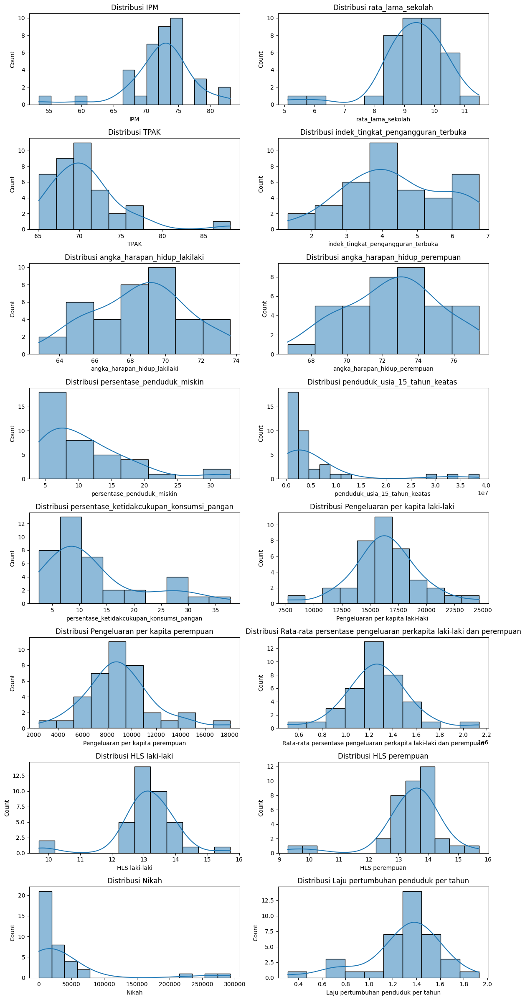

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


numerical_columns = df.select_dtypes(include=['number']).columns
n_cols = 2
n_rows = (len(numerical_columns) + 1) // n_cols  # jumlah baris yang dibutuhkan

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 3))
axes = axes.flatten()  # Ubah ke 1D array agar mudah diakses

# Buat plot untuk setiap kolom numerik
for i, col in enumerate(numerical_columns):
    sns.histplot(df[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribusi {col}')
# Kosongkan subplot yang tidak terpakai (jika jumlah kolom ganjil)
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()


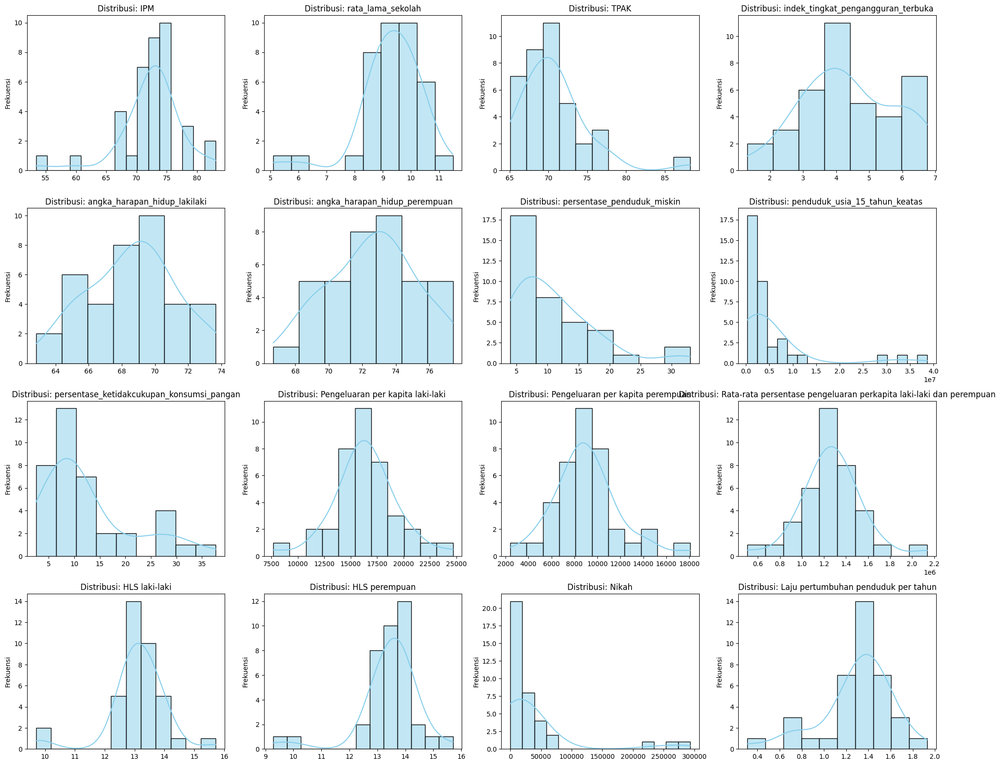

In [ ]:
# Visualisasi distribusi semua fitur numerik (kecuali 'Provinsi')
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

plt.figure(figsize=(20, 20))
for i, col in enumerate(numeric_cols):
    plt.subplot(5, 4, i + 1)
    sns.histplot(df[col], kde=True, color='skyblue')
    plt.title(f'Distribusi: {col}')
    plt.xlabel('')
    plt.ylabel('Frekuensi')
plt.tight_layout()

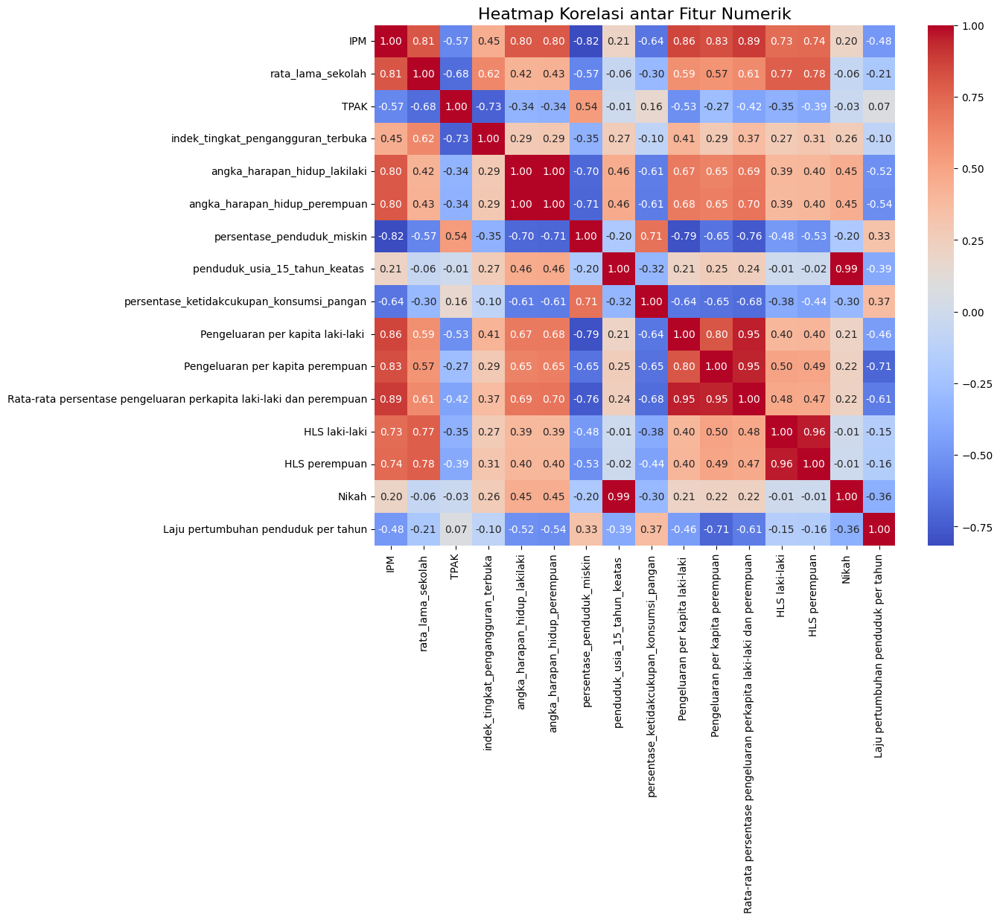

In [ ]:
# Hitung korelasi antar fitur numerik
corr_matrix = df[numeric_cols].corr()

# Visualisasi korelasi menggunakan heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title("Heatmap Korelasi antar Fitur Numerik", fontsize=16)
plt.tight_layout()
plt.show()


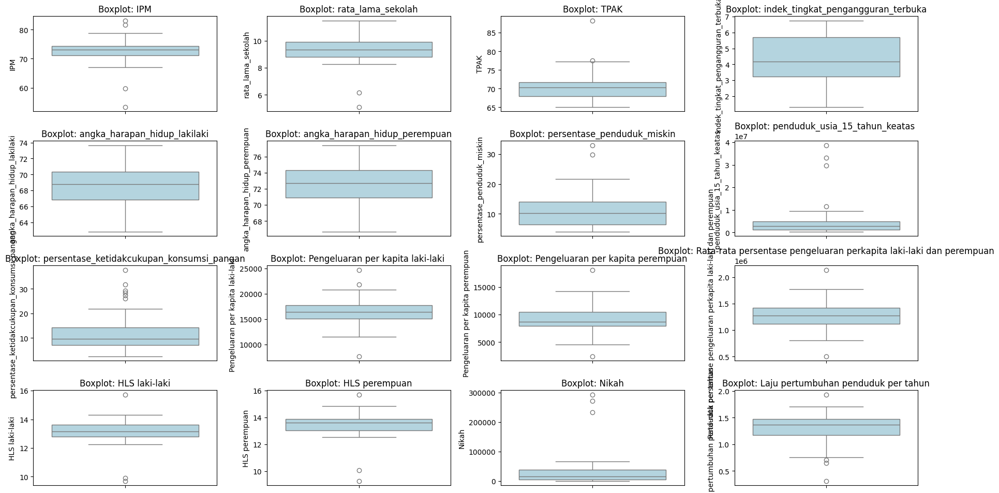

In [ ]:
plt.figure(figsize=(18, 12))
for i, col in enumerate(numeric_cols):
    plt.subplot(5, 4, i + 1)
    sns.boxplot(data=df, y=col, color='lightblue')
    plt.title(f'Boxplot: {col}')
plt.tight_layout()
plt.show()

# **Preprocessing**

In [ ]:
# Simpan nama provinsi
provinsi = df['Provinsi']

# Drop kolom non-numerik dan konversi ke numerik
X = df.drop(columns=['Provinsi'])

# Normalisasi
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)
X_scaled.head()

,IPM,rata_lama_sekolah,TPAK,indek_tingkat_pengangguran_terbuka,angka_harapan_hidup_lakilaki,angka_harapan_hidup_perempuan,persentase_penduduk_miskin,penduduk_usia_15_tahun_keatas,persentase_ketidakcukupan_konsumsi_pangan,Pengeluaran per kapita laki-laki,Pengeluaran per kapita perempuan,Rata-rata persentase pengeluaran perkapita laki-laki dan perempuan,HLS laki-laki,HLS perempuan,Nikah,Laju pertumbuhan penduduk per tahun
0,0.323018,0.580091,-1.317709,0.981923,-0.027426,-0.042086,0.463292,-0.181229,-0.395985,-0.414925,0.030723,-0.207724,1.214297,1.093331,-0.103508,0.297782
1,0.321050,0.782972,0.150396,0.874434,-0.088506,-0.098931,-0.474044,0.664698,-0.574304,0.076539,-0.025257,0.028249,0.171110,0.281766,0.401441,0.329390
2,0.413533,0.377210,-0.103293,0.981923,-0.069418,-0.079982,-0.777477,-0.143625,-0.421132,0.008681,0.518694,0.271280,0.718024,1.314667,-0.034924,0.424214
3,0.472565,0.350747,-1.031135,-0.487095,0.751344,0.765119,-0.672327,-0.082725,-0.186802,0.450091,-0.384722,0.044716,0.140726,0.244877,-0.001628,0.234565
4,0.204954,-0.028552,-0.434497,0.071848,0.571922,0.579424,-0.607735,-0.330294,-0.226810,0.322102,-0.288254,0.025354,-0.112474,0.041986,-0.250187,0.013309


# **Clustering**

## clustering - Semua fitur

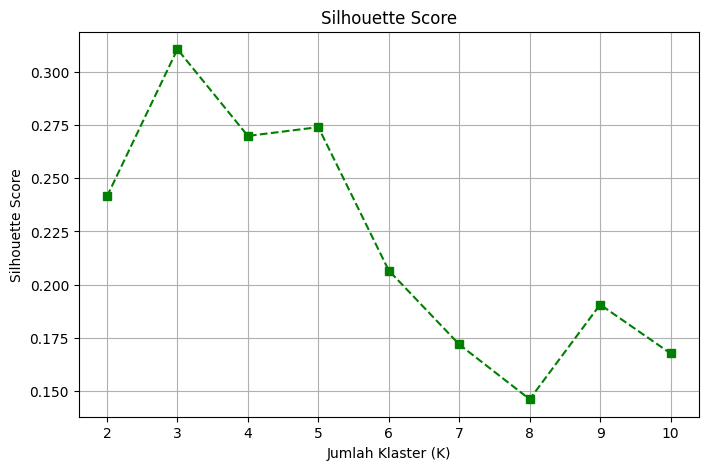

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

inertia = []
silhouette_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)

    inertia.append(kmeans.inertia_)
    score = silhouette_score(X_scaled, kmeans.labels_)
    silhouette_scores.append(score)

# # Plot Elbow Method (Inertia)
# plt.figure(figsize=(8, 5))
# plt.plot(K_range, inertia, marker='o', color='blue')
# plt.title('Elbow Method')
# plt.xlabel('Jumlah Klaster (K)')
# plt.ylabel('Inertia (SSE)')
# plt.xticks(K_range)
# plt.grid(True)
# plt.show()

# Plot Silhouette Score
plt.figure(figsize=(8, 5))
plt.plot(K_range, silhouette_scores, marker='s', color='green', linestyle='--')
plt.title('Silhouette Score')
plt.xlabel('Jumlah Klaster (K)')
plt.ylabel('Silhouette Score')
plt.xticks(K_range)
plt.grid(True)
plt.show()


In [ ]:
# Clustering
kmeans = KMeans(n_clusters = 3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)
df['cluster_Allfitur'] = clusters


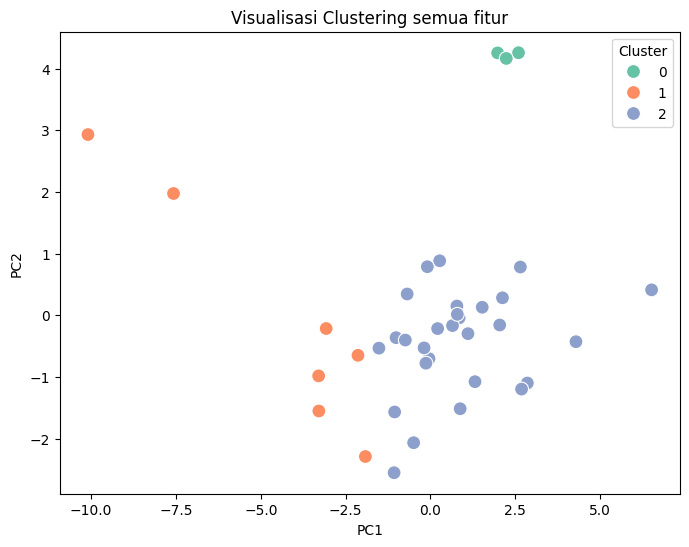


Cluster 0 (3 provinsi):
 - JAWA BARAT
 - JAWA TENGAH
 - JAWA TIMUR

Cluster 1 (7 provinsi):
 - NUSA TENGGARA TIMUR
 - SULAWESI BARAT
 - PAPUA BARAT
 - PAPUA BARAT DAYA
 - PAPUA SELATAN
 - PAPUA TENGAH
 - PAPUA PEGUNUNGAN

Cluster 2 (28 provinsi):
 - ACEH
 - SUMATERA UTARA
 - SUMATERA BARAT
 - RIAU
 - JAMBI
 - SUMATERA SELATAN
 - BENGKULU
 - LAMPUNG
 - KEP. BANGKA BELITUNG
 - KEP. RIAU
 - DKI JAKARTA
 - DI YOGYAKARTA
 - BANTEN
 - BALI
 - NUSA TENGGARA BARAT
 - KALIMANTAN BARAT
 - KALIMANTAN TENGAH
 - KALIMANTAN SELATAN
 - KALIMANTAN TIMUR
 - KALIMANTAN UTARA
 - SULAWESI UTARA
 - SULAWESI TENGAH
 - SULAWESI SELATAN
 - SULAWESI TENGGARA
 - GORONTALO
 - MALUKU
 - MALUKU UTARA
 - PAPUA


In [ ]:
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Lakukan PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Gabungkan hasil PCA dan cluster ke DataFrame
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['Cluster'] = clusters

# Plot dengan seaborn
plt.figure(figsize=(8,6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=100)
plt.title('Visualisasi Clustering semua fitur')
plt.grid(False)
plt.show()


# Tampilkan provinsi per klaster
for cluster_id in sorted(df['cluster_Allfitur'].unique()):
    provinsi_di_klaster = df[df['cluster_Allfitur'] == cluster_id]['Provinsi'].tolist()
    print(f"\nCluster {cluster_id} ({len(provinsi_di_klaster)} provinsi):")
    for prov in provinsi_di_klaster:
        print(f" - {prov}")


## clustering dengan PCA

In [ ]:
# PCA ke 2 dimensi
pca = PCA(n_components=2)
# pca = PCA()
X_pca = pca.fit_transform(X_scaled)


In [ ]:
df['PC1'] = X_pca[:, 0]
df['PC2'] = X_pca[:, 1]

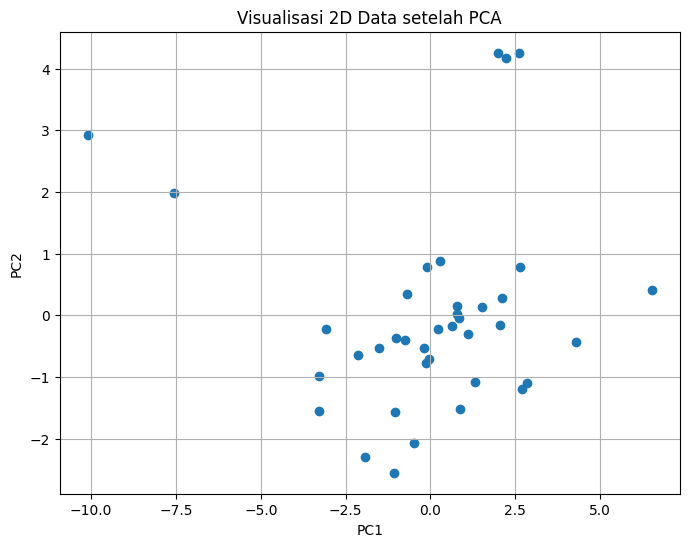

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(df['PC1'], df['PC2'])
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Visualisasi 2D Data setelah PCA')
plt.grid(True)
plt.show()


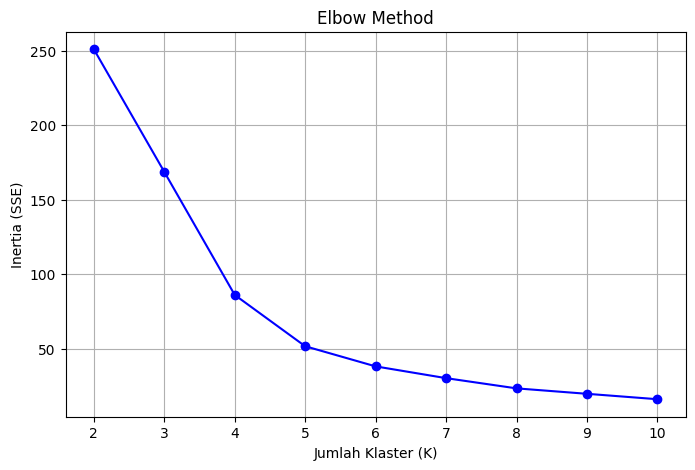

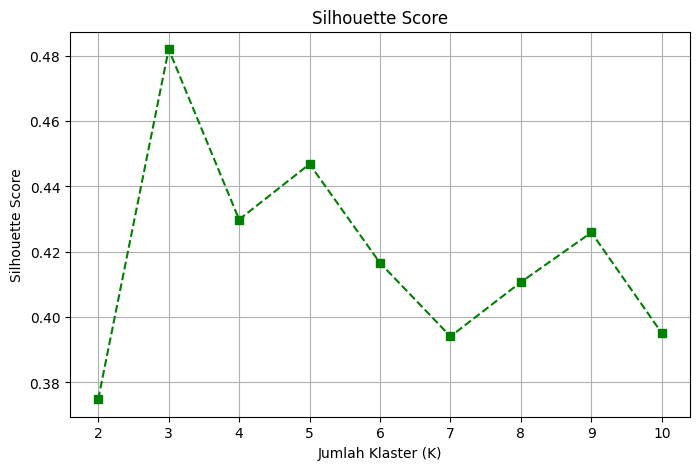

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

inertia = []
silhouette_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)

    inertia.append(kmeans.inertia_)
    score = silhouette_score(X_pca, kmeans.labels_)
    silhouette_scores.append(score)

# Plot Elbow Method (Inertia)
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertia, marker='o', color='blue')
plt.title('Elbow Method')
plt.xlabel('Jumlah Klaster (K)')
plt.ylabel('Inertia (SSE)')
plt.xticks(K_range)
plt.grid(True)
plt.show()

# Plot Silhouette Score
plt.figure(figsize=(8, 5))
plt.plot(K_range, silhouette_scores, marker='s', color='green', linestyle='--')
plt.title('Silhouette Score')
plt.xlabel('Jumlah Klaster (K)')
plt.ylabel('Silhouette Score')
plt.xticks(K_range)
plt.grid(True)
plt.show()


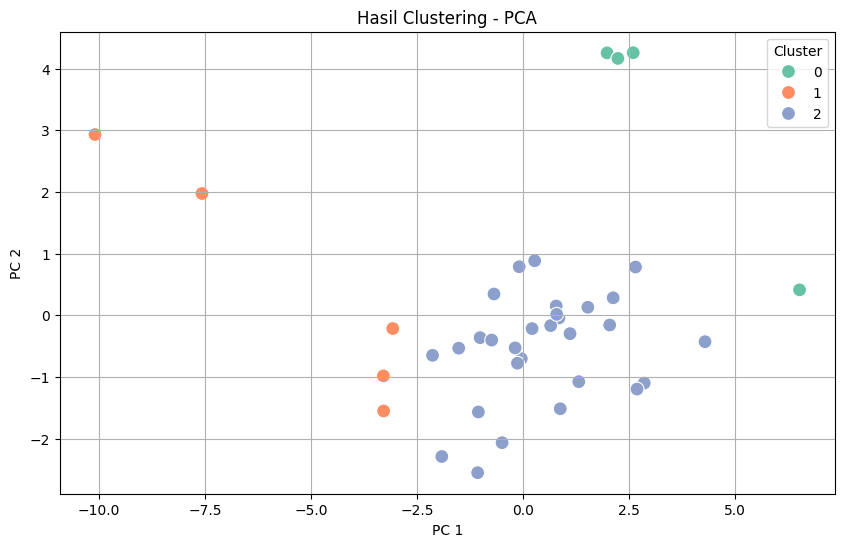


Cluster 0 (4 provinsi):
 - DKI JAKARTA
 - JAWA BARAT
 - JAWA TENGAH
 - JAWA TIMUR

Cluster 1 (5 provinsi):
 - NUSA TENGGARA TIMUR
 - PAPUA BARAT
 - PAPUA SELATAN
 - PAPUA TENGAH
 - PAPUA PEGUNUNGAN

Cluster 2 (29 provinsi):
 - ACEH
 - SUMATERA UTARA
 - SUMATERA BARAT
 - RIAU
 - JAMBI
 - SUMATERA SELATAN
 - BENGKULU
 - LAMPUNG
 - KEP. BANGKA BELITUNG
 - KEP. RIAU
 - DI YOGYAKARTA
 - BANTEN
 - BALI
 - NUSA TENGGARA BARAT
 - KALIMANTAN BARAT
 - KALIMANTAN TENGAH
 - KALIMANTAN SELATAN
 - KALIMANTAN TIMUR
 - KALIMANTAN UTARA
 - SULAWESI UTARA
 - SULAWESI TENGAH
 - SULAWESI SELATAN
 - SULAWESI TENGGARA
 - GORONTALO
 - SULAWESI BARAT
 - MALUKU
 - MALUKU UTARA
 - PAPUA BARAT DAYA
 - PAPUA


In [ ]:
# Clustering
kmeans = KMeans(n_clusters = 3, random_state=42)
clusters = kmeans.fit_predict(X_pca)
df['cluster_PCA'] = clusters

# Buat DataFrame hasil akhir
df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['Provinsi'] = provinsi.values[:len(df_pca)]
df_pca['Cluster'] = clusters

# Visualisasi
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=100)
plt.title('Hasil Clustering - PCA')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


# Tampilkan provinsi per klaster
for cluster_id in sorted(df_pca['Cluster'].unique()):
    provinsi_di_klaster = df_pca[df_pca['Cluster'] == cluster_id]['Provinsi'].tolist()
    print(f"\nCluster {cluster_id} ({len(provinsi_di_klaster)} provinsi):")
    for prov in provinsi_di_klaster:
        print(f" - {prov}")


In [ ]:
df.to_csv('/content/drive/Shareddrives/data mining sem 4/PROJEK_DATMIN_CLUSTERING.csv', index=False)

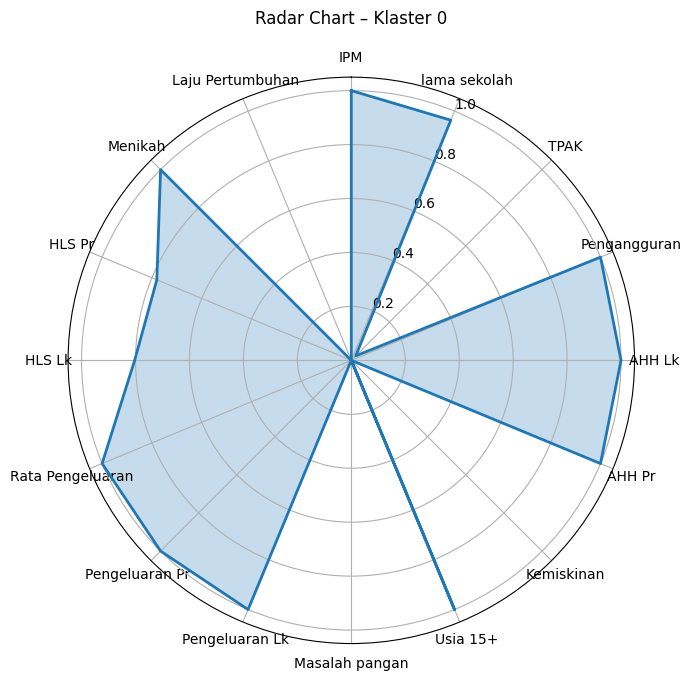

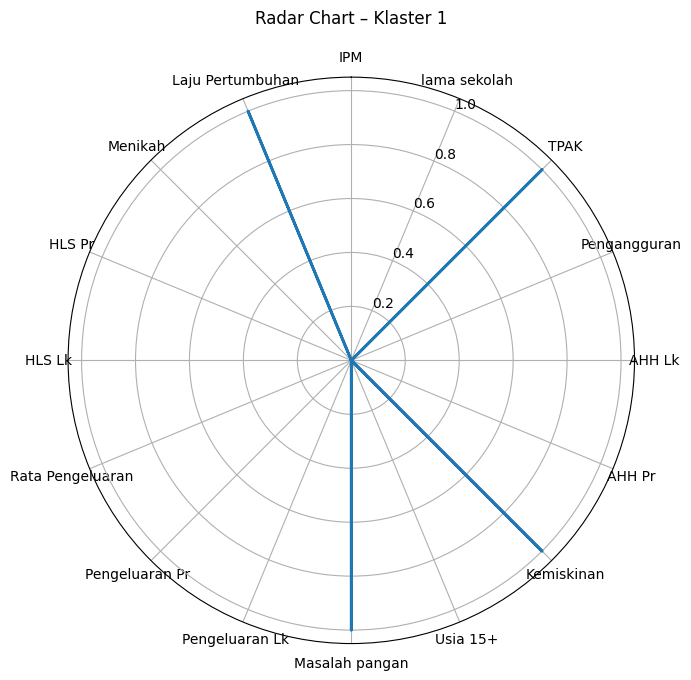

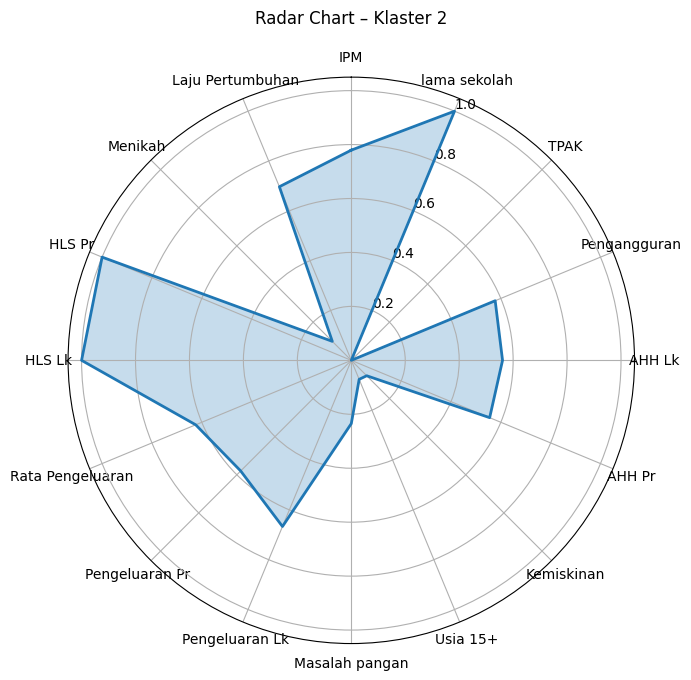

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt


# Tetap pakai nama asli df, jangan rename
mean_per_cluster = df.drop(columns=['Provinsi','cluster_Allfitur','cluster_2fitur','PC1','PC2']).groupby('cluster_PCA').mean()
scaler = MinMaxScaler()
normalized = scaler.fit_transform(mean_per_cluster)
normalized_df = pd.DataFrame(normalized, index=mean_per_cluster.index, columns=mean_per_cluster.columns)

# Label untuk visualisasi aja (ditampilkan di radar chart)
custom_labels = [
    'IPM', 'lama sekolah', 'TPAK', 'Pengangguran', 'AHH Lk', 'AHH Pr',
    'Kemiskinan', 'Usia 15+', 'Masalah pangan',
    'Pengeluaran Lk', 'Pengeluaran Pr', 'Rata Pengeluaran',
    'HLS Lk', 'HLS Pr', 'Menikah', 'Laju Pertumbuhan'
]

# Pastikan urutannya sama dengan kolom di normalized_df
labels = list(normalized_df.columns)
num_vars = len(labels)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]
custom_labels += custom_labels[:1]  # untuk menutup loop

# Radar chart per klaster
for idx, row in normalized_df.iterrows():
    values = row.tolist()
    values += values[:1]

    fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))
    ax.plot(angles, values, linewidth=2)
    ax.fill(angles, values, alpha=0.25)

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), custom_labels[:-1])
    ax.set_title(f'Radar Chart – Klaster {idx}', y=1.08)
    plt.tight_layout()
    plt.show()



# **Regressi OLS**

In [ ]:
import pandas as pd

# Load data
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv')

# Cek dimensi dan info awal
print(df.shape)
print(df.info())
print(df.describe())
print(df.isnull().sum())


(38, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38 entries, 0 to 37
Data columns (total 17 columns):
 #   Column                                                              Non-Null Count  Dtype  
---  ------                                                              --------------  -----  
 0   Provinsi                                                            38 non-null     object 
 1   IPM                                                                 38 non-null     float64
 2   rata_lama_sekolah                                                   38 non-null     float64
 3   TPAK                                                                38 non-null     float64
 4   indek_tingkat_pengangguran_terbuka                                  38 non-null     float64
 5   angka_harapan_hidup_lakilaki                                        38 non-null     float64
 6   angka_harapan_hidup_perempuan                                       38 non-null     float64
 7   persentase

In [ ]:
# Cek dan normalisasi fitur jika perlu
from sklearn.preprocessing import StandardScaler
# Strip spasi dan ganti karakter aneh di nama kolom
df.columns = df.columns.str.strip().str.replace('\u200b', '').str.replace(' ', '').str.lower()
df.drop(columns='rata-rata persentase pengeluaran perkapita laki-laki dan perempuan')
print(df.columns)
features = ['indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas',
       'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah',  'laju pertumbuhan penduduk per tahun']

scaler = StandardScaler()
Xr_scaled = scaler.fit_transform(df[features])
Xr_scaled = pd.DataFrame(Xr_scaled, columns=features)

# Tambahkan kolom konstanta
import statsmodels.api as sm
X_const = sm.add_constant(Xr_scaled)


Index(['provinsi', 'ipm', 'rata_lama_sekolah', 'tpak',
       'indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas',
       'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'rata-rata persentase pengeluaran perkapita laki-laki dan perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah',
       'laju pertumbuhan penduduk per tahun'],
      dtype='object')


In [ ]:
# Model untuk IPM
y_ipm = df['ipm']
model_ipm = sm.OLS(y_ipm, X_const).fit()

# Model untuk TPAK
y_tpak = df['tpak']
model_tpak = sm.OLS(y_tpak, X_const).fit()

print(model_ipm.summary())
print(model_tpak.summary())


                            OLS Regression Results                            
Dep. Variable:                    ipm   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     171.2
Date:                Wed, 14 May 2025   Prob (F-statistic):           6.89e-21
Time:                        14:10:32   Log-Likelihood:                -31.695
No. Observations:                  38   AIC:                             89.39
Df Residuals:                      25   BIC:                             110.7
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_df = pd.DataFrame()
vif_df['Fitur'] = X_const.columns
vif_df['VIF'] = [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]
print(vif_df)


                                        Fitur         VIF
0                                       const    1.000000
1          indek_tingkat_pengangguran_terbuka    1.864029
2                angka_harapan_hidup_lakilaki  898.633941
3               angka_harapan_hidup_perempuan  942.434562
4                  persentase_penduduk_miskin    5.388912
5               penduduk_usia_15_tahun_keatas  132.596719
6   persentase_ketidakcukupan_konsumsi_pangan    3.514227
7            pengeluaran per kapita laki-laki    6.525503
8            pengeluaran per kapita perempuan    8.229171
9                               hls laki-laki   18.273209
10                              hls perempuan   20.130139
11                                      nikah  123.285357
12        laju pertumbuhan penduduk per tahun    3.329938


In [ ]:
df['predicted_ipm'] = model_ipm.predict(X_const)
df['residual_ipm'] = df['ipm'] - df['predicted_ipm']
# Provinsi dengan error terbesar
df[['provinsi', 'ipm', 'predicted_ipm', 'residual_ipm']].sort_values(by='residual_ipm', key=abs, ascending=False).head(38)

,provinsi,ipm,predicted_ipm,residual_ipm
37,PAPUA PEGUNUNGAN,53.42,54.696754,-1.276754
19,KALIMANTAN BARAT,70.13,71.330679,-1.200679
1,SUMATERA UTARA,74.02,72.883274,1.136726
25,SULAWESI TENGAH,71.56,70.583338,0.976662
8,KEP. BANGKA BELITUNG,73.33,74.274693,-0.944693
36,PAPUA TENGAH,59.75,58.915812,0.834188
26,SULAWESI SELATAN,74.05,74.843269,-0.793269
20,KALIMANTAN TENGAH,72.73,71.944580,0.785420
5,SUMATERA SELATAN,72.30,71.611346,0.688654
33,PAPUA BARAT DAYA,68.63,69.267033,-0.637033


In [ ]:
df['predicted_tpak'] = model_tpak.predict(X_const)
df['residual_tpak'] = df['tpak'] - df['predicted_tpak']

# Provinsi dengan error terbesar
df[['provinsi', 'tpak', 'predicted_tpak', 'residual_tpak']].sort_values(by='residual_tpak', key=abs, ascending=False).head(38)


,provinsi,tpak,predicted_tpak,residual_tpak
37,PAPUA PEGUNUNGAN,88.22,82.158091,6.061909
36,PAPUA TENGAH,73.13,77.692662,-4.562662
26,SULAWESI SELATAN,67.38,71.119359,-3.739359
0,ACEH,65.11,68.393653,-3.283653
9,KEP. RIAU,69.17,65.977710,3.192290
34,PAPUA,68.40,65.670390,2.729610
29,SULAWESI BARAT,71.40,74.123593,-2.723593
25,SULAWESI TENGAH,71.10,73.743796,-2.643796
3,RIAU,66.33,68.926145,-2.596145
2,SUMATERA BARAT,70.28,68.041692,2.238308


## Diagnostik Model (Asumsi Regresi)


==== UJI ASUMSI REGRESI UNTUK: IPM ====
Fitur terpilih (2): [np.str_('angka_harapan_hidup_perempuan'), np.str_('pengeluaran per kapita laki-laki')]
Menggunakan LinearRegression untuk IPM


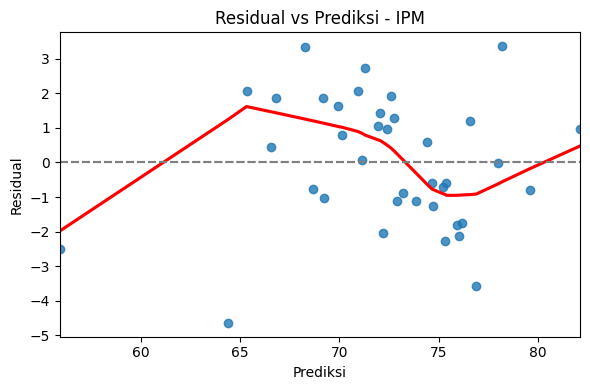

Durbin-Watson: 1.5296 (ideal ≈ 2)
Breusch-Pagan p-value: 0.2260 (OK)
Shapiro-Wilk p-value: 0.6598 (Residual normal)

VIF (Setelah seleksi fitur):
                            feature       VIF
0     angka_harapan_hidup_perempuan  1.890825
1  pengeluaran per kapita laki-laki  1.890825

==== UJI ASUMSI REGRESI UNTUK: TPAK ====
Fitur terpilih (2): [np.str_('angka_harapan_hidup_lakilaki'), np.str_('angka_harapan_hidup_perempuan')]
Menggunakan HuberRegressor untuk TPAK (robust)


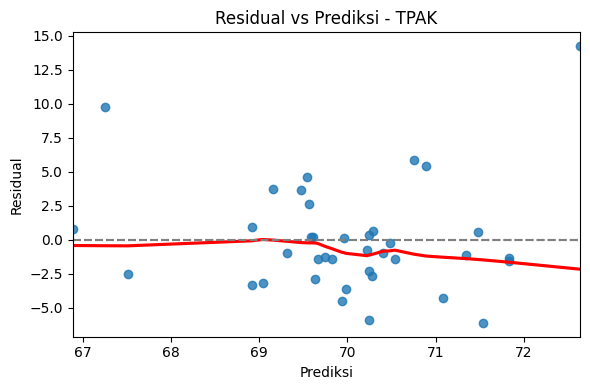

Durbin-Watson: 1.1944 (ideal ≈ 2)
Breusch-Pagan p-value: 0.2361 (OK)
Shapiro-Wilk p-value: 0.0005 (Tidak normal)

VIF (Setelah seleksi fitur):
                         feature         VIF
0   angka_harapan_hidup_lakilaki  531.918292
1  angka_harapan_hidup_perempuan  531.918292


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, HuberRegressor
from sklearn.feature_selection import RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.stats import shapiro

# Load data
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv')

# Bersihkan kolom
df.columns = df.columns.str.strip().str.replace('\u200b', '').str.replace(' ', '').str.lower()
df = df.drop(columns='rata-rata persentase pengeluaran perkapita laki-laki dan perempuan', errors='ignore')

# Daftar fitur
features = ['indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas', 'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah', 'laju pertumbuhan penduduk per tahun']

# Log transform untuk fitur dengan skew tinggi
log_features = ['penduduk_usia_15_tahun_keatas', 'pengeluaran per kapita laki-laki',
                'pengeluaran per kapita perempuan']
for col in log_features:
    df[col] = np.log1p(df[col])

# Fungsi VIF
def calculate_vif(X, cols):
    vif_data = pd.DataFrame()
    vif_data['feature'] = cols
    vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

# Fungsi utama uji asumsi
def test_assumptions(df, target_col):
    print(f"\n==== UJI ASUMSI REGRESI UNTUK: {target_col.upper()} ====")
    X = df[features].copy()
    y = df[target_col].values

    # Standarisasi
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # RFE untuk seleksi fitur
    estimator = LinearRegression()
    rfe = RFE(estimator, n_features_to_select=2)
    X_selected = rfe.fit_transform(X_scaled, y)
    selected_features = np.array(features)[rfe.support_]
    print(f"Fitur terpilih ({len(selected_features)}): {list(selected_features)}")

    # Model akhir
    if target_col.lower() == 'tpak':
        model = HuberRegressor().fit(X_selected, y)
        print("Menggunakan HuberRegressor untuk TPAK (robust)")
    else:
        model = LinearRegression().fit(X_selected, y)
        print("Menggunakan LinearRegression untuk IPM")

    y_pred = model.predict(X_selected)
    residuals = y - y_pred

    # Residual plot
    plt.figure(figsize=(6, 4))
    sns.residplot(x=y_pred, y=residuals, lowess=True, line_kws={'color': 'red'})
    plt.axhline(0, linestyle='--', color='gray')
    plt.xlabel('Prediksi')
    plt.ylabel('Residual')
    plt.title(f'Residual vs Prediksi - {target_col.upper()}')
    plt.tight_layout()
    plt.show()

    # Durbin-Watson
    dw = sm.stats.stattools.durbin_watson(residuals)
    print(f"Durbin-Watson: {dw:.4f} (ideal ≈ 2)")

    # Breusch-Pagan
    X_const = sm.add_constant(X_selected)
    _, pval_bp, _, _ = het_breuschpagan(residuals, X_const)
    print(f"Breusch-Pagan p-value: {pval_bp:.4f} ({'OK' if pval_bp > 0.05 else 'Terdapat heteroskedastisitas'})")

    # Shapiro-Wilk
    _, pval_sw = shapiro(residuals)
    print(f"Shapiro-Wilk p-value: {pval_sw:.4f} ({'Residual normal' if pval_sw > 0.05 else 'Tidak normal'})")

    # VIF
    vif_df = calculate_vif(pd.DataFrame(X_selected, columns=selected_features), selected_features)
    print("\nVIF (Setelah seleksi fitur):")
    print(vif_df.sort_values(by='VIF', ascending=False))

# Jalankan untuk IPM
test_assumptions(df, 'ipm')

# Jalankan untuk TPAK
test_assumptions(df, 'tpak')



=== Uji Kelayakan OLS untuk: IPM ===
                            OLS Regression Results                            
Dep. Variable:                    ipm   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     171.2
Date:                Wed, 14 May 2025   Prob (F-statistic):           6.89e-21
Time:                        14:31:49   Log-Likelihood:                -31.695
No. Observations:                  38   AIC:                             89.39
Df Residuals:                      25   BIC:                             110.7
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

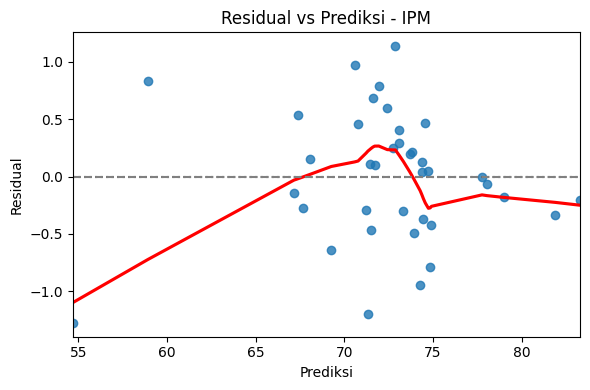

Durbin-Watson statistic: 2.169 (ideal sekitar 2)
Breusch-Pagan test p-value: 0.0906 (p > 0.05 ⇒ homoskedastik)
Shapiro-Wilk test p-value: 0.9476 (p > 0.05 ⇒ normal)

VIF:
                                      feature         VIF
2               angka_harapan_hidup_perempuan  942.434562
1                angka_harapan_hidup_lakilaki  898.633941
4               penduduk_usia_15_tahun_keatas  132.596719
10                                      nikah  123.285357
9                               hls perempuan   20.130139
8                               hls laki-laki   18.273209
7            pengeluaran per kapita perempuan    8.229171
6            pengeluaran per kapita laki-laki    6.525503
3                  persentase_penduduk_miskin    5.388912
5   persentase_ketidakcukupan_konsumsi_pangan    3.514227
11        laju pertumbuhan penduduk per tahun    3.329938
0          indek_tingkat_pengangguran_terbuka    1.864029

=== Uji Kelayakan OLS untuk: TPAK ===
                            OLS Regr

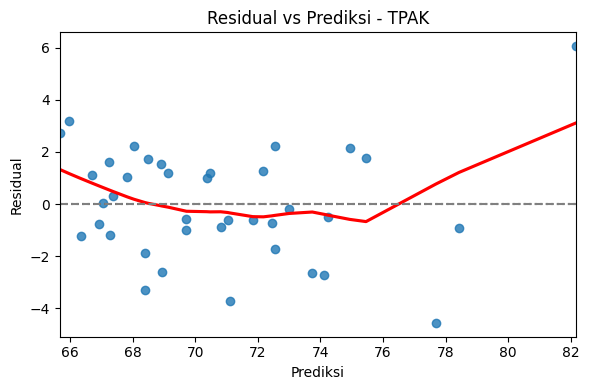

Durbin-Watson statistic: 1.948 (ideal sekitar 2)
Breusch-Pagan test p-value: 0.0395 (p > 0.05 ⇒ homoskedastik)
Shapiro-Wilk test p-value: 0.6398 (p > 0.05 ⇒ normal)

VIF:
                                      feature         VIF
2               angka_harapan_hidup_perempuan  942.434562
1                angka_harapan_hidup_lakilaki  898.633941
4               penduduk_usia_15_tahun_keatas  132.596719
10                                      nikah  123.285357
9                               hls perempuan   20.130139
8                               hls laki-laki   18.273209
7            pengeluaran per kapita perempuan    8.229171
6            pengeluaran per kapita laki-laki    6.525503
3                  persentase_penduduk_miskin    5.388912
5   persentase_ketidakcukupan_konsumsi_pangan    3.514227
11        laju pertumbuhan penduduk per tahun    3.329938
0          indek_tingkat_pengangguran_terbuka    1.864029


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.stats import shapiro


# Load data
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv')


df.columns = df.columns.str.strip().str.replace('\u200b', '').str.replace(' ', '').str.lower()
df = df.drop(columns='rata-rata persentase pengeluaran perkapita laki-laki dan perempuan', errors='ignore')

features = ['indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas', 'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah', 'laju pertumbuhan penduduk per tahun']

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(df[features]), columns=features)

# Fungsi VIF
def calculate_vif(X):
    vif_data = pd.DataFrame()
    vif_data['feature'] = X.columns
    vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data
def test_ols_assumptions(df, X_scaled, y_col):
    print(f"\n=== Uji Kelayakan OLS untuk: {y_col.upper()} ===")

    # Model OLS
    y = df[y_col]
    X_const = sm.add_constant(X_scaled)
    model = sm.OLS(y, X_const).fit()
    print(model.summary())

    # 1. LINEARITAS (plot residual vs prediksi)
    y_pred = model.fittedvalues
    residuals = model.resid

    plt.figure(figsize=(6, 4))
    sns.residplot(x=y_pred, y=residuals, lowess=True, line_kws={'color': 'red'})
    plt.axhline(0, linestyle='--', color='gray')
    plt.xlabel('Prediksi')
    plt.ylabel('Residual')
    plt.title(f'Residual vs Prediksi - {y_col.upper()}')
    plt.tight_layout()
    plt.show()

    # 2. INDEPENDENSI ERROR (Durbin-Watson)
    dw = sm.stats.stattools.durbin_watson(residuals)
    print(f"Durbin-Watson statistic: {dw:.3f} (ideal sekitar 2)")

    # 3. HOMOSKEDASTISITAS (Breusch-Pagan test)
    lm_stat, lm_pvalue, fvalue, f_pvalue = het_breuschpagan(residuals, X_const)
    print(f"Breusch-Pagan test p-value: {lm_pvalue:.4f} (p > 0.05 ⇒ homoskedastik)")

    # 4. NORMALITAS RESIDUAL (Shapiro-Wilk)
    shapiro_stat, shapiro_p = shapiro(residuals)
    print(f"Shapiro-Wilk test p-value: {shapiro_p:.4f} (p > 0.05 ⇒ normal)")

    # 5. MULTIKOLINEARITAS (VIF)
    vif = calculate_vif(X_scaled)
    print("\nVIF:")
    print(vif.sort_values(by='VIF', ascending=False))
# Jalankan untuk IPM
test_ols_assumptions(df, X_scaled, 'ipm')

# Jalankan untuk TPAK
test_ols_assumptions(df, X_scaled, 'tpak')


Jumlah komponen PCA: 6 (menjelaskan 95.41% variansi)

=== Uji Kelayakan OLS dengan PCA untuk: IPM ===
                            OLS Regression Results                            
Dep. Variable:                    ipm   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.966
Method:                 Least Squares   F-statistic:                     175.7
Date:                Sun, 18 May 2025   Prob (F-statistic):           1.60e-22
Time:                        10:38:17   Log-Likelihood:                -48.146
No. Observations:                  38   AIC:                             110.3
Df Residuals:                      31   BIC:                             121.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------

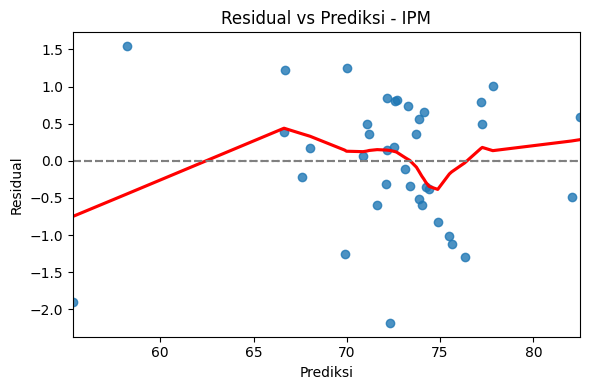

Durbin-Watson statistic: 2.274 (ideal sekitar 2)
Breusch-Pagan test p-value: 0.0502 (p > 0.05 ⇒ homoskedastik)
Shapiro-Wilk test p-value: 0.3672 (p > 0.05 ⇒ normal)

Multikolinearitas: Tidak perlu diuji setelah PCA (komponen PCA bersifat orthogonal).

=== Uji Kelayakan OLS dengan PCA untuk: TPAK ===
                            OLS Regression Results                            
Dep. Variable:                   tpak   R-squared:                       0.668
Model:                            OLS   Adj. R-squared:                  0.604
Method:                 Least Squares   F-statistic:                     10.41
Date:                Sun, 18 May 2025   Prob (F-statistic):           2.54e-06
Time:                        10:38:17   Log-Likelihood:                -87.995
No. Observations:                  38   AIC:                             190.0
Df Residuals:                      31   BIC:                             201.5
Df Model:                           6                              

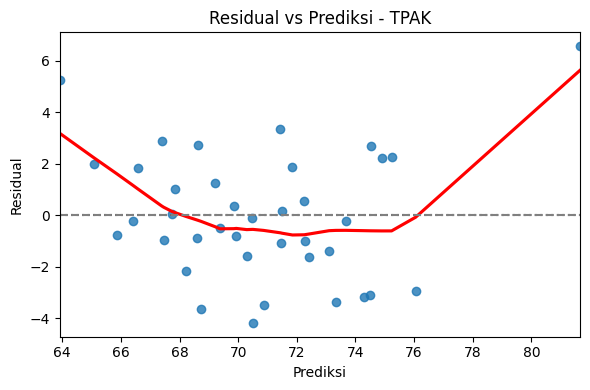

Durbin-Watson statistic: 1.580 (ideal sekitar 2)
Breusch-Pagan test p-value: 0.3457 (p > 0.05 ⇒ homoskedastik)
Shapiro-Wilk test p-value: 0.3737 (p > 0.05 ⇒ normal)

Multikolinearitas: Tidak perlu diuji setelah PCA (komponen PCA bersifat orthogonal).

=== Loading PCA (kontribusi variabel terhadap komponen utama) ===
                                             PC1    PC2    PC3    PC4    PC5  \
indek_tingkat_pengangguran_terbuka         0.175 -0.001  0.549  0.680 -0.210   
angka_harapan_hidup_lakilaki               0.360  0.092 -0.089 -0.004  0.206   
angka_harapan_hidup_perempuan              0.362  0.097 -0.094 -0.001  0.196   
persentase_penduduk_miskin                -0.339  0.145  0.072 -0.197 -0.344   
penduduk_usia_15_tahun_keatas              0.198  0.537  0.285 -0.189  0.004   
persentase_ketidakcukupan_konsumsi_pangan -0.312  0.034  0.197  0.182 -0.366   
pengeluaran per kapita laki-laki           0.341 -0.092 -0.173  0.372  0.027   
pengeluaran per kapita perempuan          

In [ ]:
from sklearn.decomposition import PCA
# Load data
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv')


df.columns = df.columns.str.strip().str.replace('\u200b', '').str.replace(' ', '').str.lower()
df = df.drop(columns='rata-rata persentase pengeluaran perkapita laki-laki dan perempuan', errors='ignore')

features = ['indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas', 'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah', 'laju pertumbuhan penduduk per tahun']

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(df[features]), columns=features)

# Terapkan PCA (gunakan cukup komponen yang menjelaskan >95% variansi)
pca = PCA(n_components=0.95)  # atau bisa diganti jumlah pasti misal n_components=5
X_pca = pca.fit_transform(X_scaled)
print(f"Jumlah komponen PCA: {X_pca.shape[1]} (menjelaskan {sum(pca.explained_variance_ratio_):.2%} variansi)")

# Konversi ke DataFrame untuk konsistensi input ke model OLS
X_pca_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])
def test_ols_assumptions(df, X_input, y_col):
    print(f"\n=== Uji Kelayakan OLS dengan PCA untuk: {y_col.upper()} ===")

    y = df[y_col]
    X_const = sm.add_constant(X_input)
    model = sm.OLS(y, X_const).fit()
    print(model.summary())

    y_pred = model.fittedvalues
    residuals = model.resid

    # LINEARITAS (residual plot)
    plt.figure(figsize=(6, 4))
    sns.residplot(x=y_pred, y=residuals, lowess=True, line_kws={'color': 'red'})
    plt.axhline(0, linestyle='--', color='gray')
    plt.xlabel('Prediksi')
    plt.ylabel('Residual')
    plt.title(f'Residual vs Prediksi - {y_col.upper()}')
    plt.tight_layout()
    plt.show()

    # INDEPENDENSI ERROR
    dw = sm.stats.stattools.durbin_watson(residuals)
    print(f"Durbin-Watson statistic: {dw:.3f} (ideal sekitar 2)")

    # HOMOSKEDASTISITAS
    lm_stat, lm_pvalue, fvalue, f_pvalue = het_breuschpagan(residuals, X_const)
    print(f"Breusch-Pagan test p-value: {lm_pvalue:.4f} (p > 0.05 ⇒ homoskedastik)")

    # NORMALITAS RESIDUAL
    shapiro_stat, shapiro_p = shapiro(residuals)
    print(f"Shapiro-Wilk test p-value: {shapiro_p:.4f} (p > 0.05 ⇒ normal)")

    # MULTIKOLINEARITAS (tidak relevan untuk PCA karena komponen orthogonal)
    print("\nMultikolinearitas: Tidak perlu diuji setelah PCA (komponen PCA bersifat orthogonal).")
# Jalankan untuk IPM
test_ols_assumptions(df, X_pca_df, 'ipm')

# Jalankan untuk TPAK
test_ols_assumptions(df, X_pca_df, 'tpak')
# Tampilkan loading PCA untuk PC1 hingga PC6
loadings = pd.DataFrame(
    pca.components_[:6],  # Ambil hanya PC1 - PC6
    columns=features,
    index=[f'PC{i+1}' for i in range(6)]
)

print("\n=== Loading PCA (kontribusi variabel terhadap komponen utama) ===")
print(loadings.T.round(3))  # Transpose agar lebih mudah dibaca


Jumlah komponen PCA: 6 (menjelaskan 95.41% variansi)

=== Uji Kelayakan OLS dengan PCA untuk: IPM ===
                            OLS Regression Results                            
Dep. Variable:                    ipm   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.966
Method:                 Least Squares   F-statistic:                     175.7
Date:                Sun, 18 May 2025   Prob (F-statistic):           1.60e-22
Time:                        14:09:16   Log-Likelihood:                -48.146
No. Observations:                  38   AIC:                             110.3
Df Residuals:                      31   BIC:                             121.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------

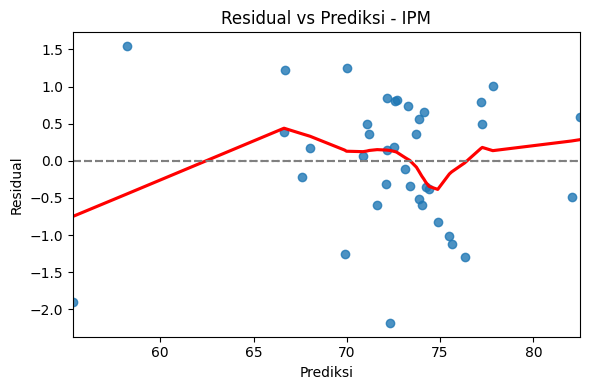

Durbin-Watson statistic: 2.274 (ideal sekitar 2)
Breusch-Pagan test p-value: 0.0502 (p > 0.05 ⇒ homoskedastik)
Shapiro-Wilk test p-value: 0.3672 (p > 0.05 ⇒ normal)

Multikolinearitas: Tidak perlu diuji setelah PCA (komponen PCA bersifat orthogonal).

=== Ketidakakuratan Prediksi IPM per Provinsi ===
            provinsi  Aktual   Prediksi  Residual
19  KALIMANTAN BARAT   70.13  72.313417 -2.183417
37  PAPUA PEGUNUNGAN   53.42  55.321386 -1.901386
36      PAPUA TENGAH   59.75  58.205547  1.544453
24    SULAWESI UTARA   75.03  76.319900 -1.289900
33  PAPUA BARAT DAYA   68.63  69.879714 -1.249714

=== Arah Hubungan Variabel terhadap IPM ===

Koefisien Regresi terhadap Komponen PCA (arah pengaruh terhadap IPM):
PC1    1.933
PC2   -1.045
PC3    0.131
PC4    0.409
PC5   -0.243
PC6    0.537
dtype: float64

=== Arah Hubungan Variabel terhadap IPM ===
hls laki-laki                                0.852
hls perempuan                                0.852
angka_harapan_hidup_lakilaki              

<ipython-input-10-a20105fef41b>:107: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=contribution.values, y=contribution.index, palette='coolwarm')


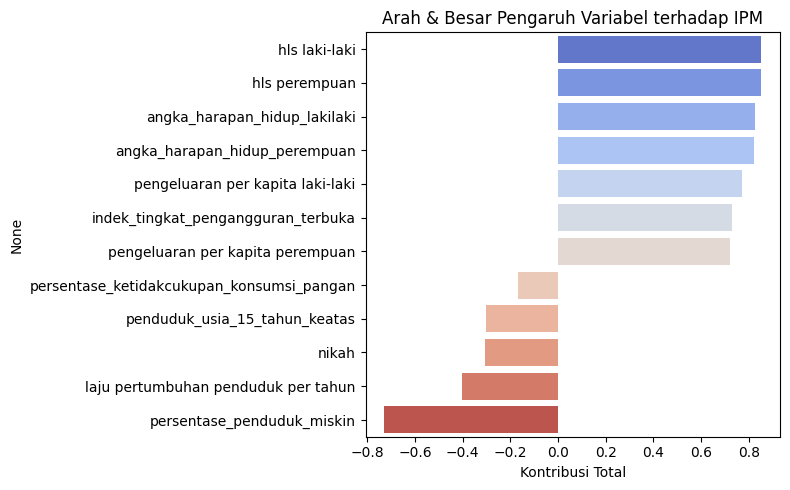


=== Uji Kelayakan OLS dengan PCA untuk: TPAK ===
                            OLS Regression Results                            
Dep. Variable:                   tpak   R-squared:                       0.668
Model:                            OLS   Adj. R-squared:                  0.604
Method:                 Least Squares   F-statistic:                     10.41
Date:                Sun, 18 May 2025   Prob (F-statistic):           2.54e-06
Time:                        14:09:18   Log-Likelihood:                -87.995
No. Observations:                  38   AIC:                             190.0
Df Residuals:                      31   BIC:                             201.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
co

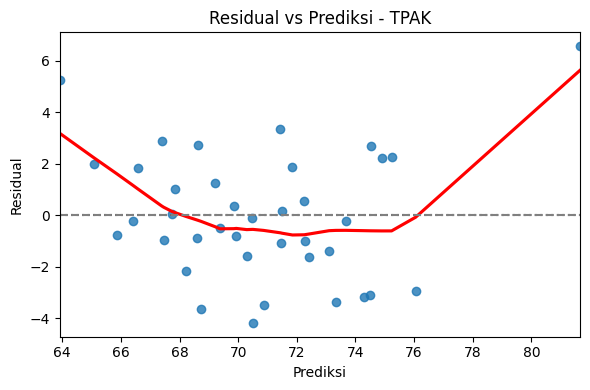

Durbin-Watson statistic: 1.580 (ideal sekitar 2)
Breusch-Pagan test p-value: 0.3457 (p > 0.05 ⇒ homoskedastik)
Shapiro-Wilk test p-value: 0.3737 (p > 0.05 ⇒ normal)

Multikolinearitas: Tidak perlu diuji setelah PCA (komponen PCA bersifat orthogonal).

=== Ketidakakuratan Prediksi TPAK per Provinsi ===
            provinsi  Aktual   Prediksi  Residual
37  PAPUA PEGUNUNGAN   88.22  81.658192  6.561808
9          KEP. RIAU   69.17  63.911431  5.258569
3               RIAU   66.33  70.504932 -4.174932
0               ACEH   65.11  68.734812 -3.624812
26  SULAWESI SELATAN   67.38  70.866728 -3.486728

=== Arah Hubungan Variabel terhadap TPAK ===

Koefisien Regresi terhadap Komponen PCA (arah pengaruh terhadap TPAK):
PC1   -0.776
PC2    0.713
PC3   -1.311
PC4   -2.496
PC5   -0.039
PC6   -0.363
dtype: float64

=== Arah Hubungan Variabel terhadap TPAK ===
persentase_penduduk_miskin                   0.732
penduduk_usia_15_tahun_keatas                0.382
nikah                                 

<ipython-input-10-a20105fef41b>:107: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=contribution.values, y=contribution.index, palette='coolwarm')


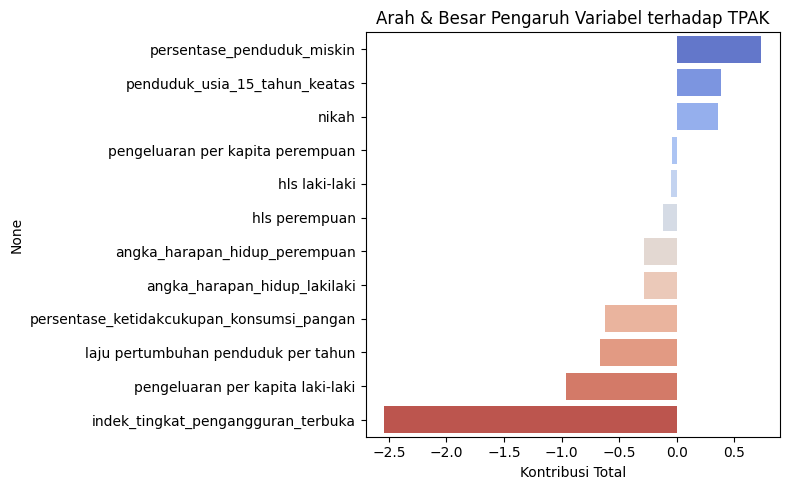


=== Loading PCA (kontribusi variabel terhadap komponen utama) ===
                                             PC1    PC2    PC3    PC4    PC5  \
indek_tingkat_pengangguran_terbuka         0.175 -0.001  0.549  0.680 -0.210   
angka_harapan_hidup_lakilaki               0.360  0.092 -0.089 -0.004  0.206   
angka_harapan_hidup_perempuan              0.362  0.097 -0.094 -0.001  0.196   
persentase_penduduk_miskin                -0.339  0.145  0.072 -0.197 -0.344   
penduduk_usia_15_tahun_keatas              0.198  0.537  0.285 -0.189  0.004   
persentase_ketidakcukupan_konsumsi_pangan -0.312  0.034  0.197  0.182 -0.366   
pengeluaran per kapita laki-laki           0.341 -0.092 -0.173  0.372  0.027   
pengeluaran per kapita perempuan           0.347 -0.086 -0.240  0.047 -0.364   
hls laki-laki                              0.240 -0.411  0.351 -0.362 -0.143   
hls perempuan                              0.248 -0.414  0.351 -0.332 -0.099   
nikah                                      0.193  0.5

In [ ]:
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.stats import shapiro

# Load data
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv')


df.columns = df.columns.str.strip().str.replace('\u200b', '').str.replace(' ', '').str.lower()
df = df.drop(columns='rata-rata persentase pengeluaran perkapita laki-laki dan perempuan', errors='ignore')

features = ['indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas', 'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah', 'laju pertumbuhan penduduk per tahun']

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(df[features]), columns=features)

# Terapkan PCA (gunakan cukup komponen yang menjelaskan >95% variansi)
pca = PCA(n_components=0.95)  # atau bisa diganti jumlah pasti misal n_components=5
X_pca = pca.fit_transform(X_scaled)

# Create loadings DataFrame based on the actual number of components used by PCA
loadings = pd.DataFrame(
    pca.components_.T,  # Transpose components_ to have features as rows, PCs as columns
    index=features,
    columns=[f'PC{i+1}' for i in range(X_pca.shape[1])] # Use the actual number of PCs
)


print(f"Jumlah komponen PCA: {X_pca.shape[1]} (menjelaskan {sum(pca.explained_variance_ratio_):.2%} variansi)")
def test_ols_assumptions(df, X_input, y_col, loadings_df, region_col='provinsi'): # Add loadings_df as argument
    print(f"\n=== Uji Kelayakan OLS dengan PCA untuk: {y_col.upper()} ===")

    y = df[y_col]
    X_const = sm.add_constant(X_input)
    model = sm.OLS(y, X_const).fit()
    print(model.summary())

    y_pred = model.fittedvalues
    residuals = model.resid

    # LINEARITAS (residual plot)
    plt.figure(figsize=(6, 4))
    sns.residplot(x=y_pred, y=residuals, lowess=True, line_kws={'color': 'red'})
    plt.axhline(0, linestyle='--', color='gray')
    plt.xlabel('Prediksi')
    plt.ylabel('Residual')
    plt.title(f'Residual vs Prediksi - {y_col.upper()}')
    plt.tight_layout()
    plt.show()

    # INDEPENDENSI ERROR
    dw = sm.stats.stattools.durbin_watson(residuals)
    print(f"Durbin-Watson statistic: {dw:.3f} (ideal sekitar 2)")

    # HOMOSKEDASTISITAS
    lm_stat, lm_pvalue, fvalue, f_pvalue = het_breuschpagan(residuals, X_const)
    print(f"Breusch-Pagan test p-value: {lm_pvalue:.4f} (p > 0.05 ⇒ homoskedastik)")

    # NORMALITAS RESIDUAL
    shapiro_stat, shapiro_p = shapiro(residuals)
    print(f"Shapiro-Wilk test p-value: {shapiro_p:.4f} (p > 0.05 ⇒ normal)")

    print("\nMultikolinearitas: Tidak perlu diuji setelah PCA (komponen PCA bersifat orthogonal).")

    # === KETIDAKAKURATAN PREDIKSI ===
    if region_col in df.columns:
        print(f"\n=== Ketidakakuratan Prediksi {y_col.upper()} per Provinsi ===")
        pred_df = df[[region_col]].copy()
        pred_df['Aktual'] = y
        pred_df['Prediksi'] = y_pred
        pred_df['Residual'] = residuals
        pred_df['|Residual|'] = residuals.abs()
        pred_df_sorted = pred_df.sort_values(by='|Residual|', ascending=False)

        # Tampilkan 5 provinsi dengan kesalahan prediksi terbesar
        print(pred_df_sorted[[region_col, 'Aktual', 'Prediksi', 'Residual']].head(5))

    # === ARAH HUBUNGAN DARI KOMPONEN PCA DAN KOEFISIEN ===
    print(f"\n=== Arah Hubungan Variabel terhadap {y_col.upper()} ===")


    coef = model.params[1:]  # eksklusi intercept
    pc_contribution = pd.Series(coef.values, index=loadings_df.columns)

    print(f"\nKoefisien Regresi terhadap Komponen PCA (arah pengaruh terhadap {y_col.upper()}):")
    print(pc_contribution.round(3))

    # Combine with loadings to get the influence of original variables
    contribution = loadings_df.dot(pc_contribution)
    contribution = contribution.sort_values(ascending=False)
    print(f"\n=== Arah Hubungan Variabel terhadap {y_col.upper()} ===")
    print(contribution.round(3))

    # Visualisasi
    plt.figure(figsize=(8, 5))
    sns.barplot(x=contribution.values, y=contribution.index, palette='coolwarm')
    plt.title(f'Arah & Besar Pengaruh Variabel terhadap {y_col.upper()}')
    plt.xlabel('Kontribusi Total')
    plt.tight_layout()
    plt.show()


# Convert X_pca to DataFrame for consistent indexing
X_pca_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])

# Jalankan untuk IPM
test_ols_assumptions(df, X_pca_df, 'ipm', loadings) # Pass loadings DataFrame

# Jalankan untuk TPAK
test_ols_assumptions(df, X_pca_df, 'tpak', loadings) # Pass loadings DataFrame

# Tampilkan loading PCA
# Display loadings for all components used in the model
print("\n=== Loading PCA (kontribusi variabel terhadap komponen utama) ===")
# loadings DataFrame already has the correct structure (features as index, PCs as columns)
print(loadings.round(3)) # Transpose is no longer needed as we built loadings with features as index

Jumlah komponen PCA: 6 (menjelaskan 95.41% variansi)

=== Uji Kelayakan OLS dengan PCA untuk: IPM ===
                            OLS Regression Results                            
Dep. Variable:                    ipm   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.966
Method:                 Least Squares   F-statistic:                     175.7
Date:                Sun, 18 May 2025   Prob (F-statistic):           1.60e-22
Time:                        13:53:00   Log-Likelihood:                -48.146
No. Observations:                  38   AIC:                             110.3
Df Residuals:                      31   BIC:                             121.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------

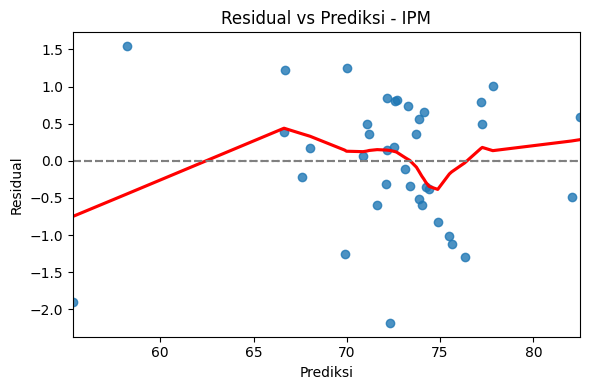

Durbin-Watson statistic: 2.274 (ideal sekitar 2)
Breusch-Pagan test p-value: 0.0502 (p > 0.05 ⇒ homoskedastik)
Shapiro-Wilk test p-value: 0.3672 (p > 0.05 ⇒ normal)

Multikolinearitas: Tidak perlu diuji setelah PCA (komponen PCA bersifat orthogonal).

=== Ketidakakuratan Prediksi IPM per Provinsi ===
            provinsi  Aktual   Prediksi  Residual
19  KALIMANTAN BARAT   70.13  72.313417 -2.183417
37  PAPUA PEGUNUNGAN   53.42  55.321386 -1.901386
36      PAPUA TENGAH   59.75  58.205547  1.544453
24    SULAWESI UTARA   75.03  76.319900 -1.289900
33  PAPUA BARAT DAYA   68.63  69.879714 -1.249714

=== Arah Hubungan Variabel terhadap IPM ===


ValueError: matrices are not aligned

In [ ]:
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.stats import shapiro

# Load data
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv')


df.columns = df.columns.str.strip().str.replace('\u200b', '').str.replace(' ', '').str.lower()
df = df.drop(columns='rata-rata persentase pengeluaran perkapita laki-laki dan perempuan', errors='ignore')

features = ['indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas', 'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah', 'laju pertumbuhan penduduk per tahun']

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(df[features]), columns=features)

# Terapkan PCA (gunakan cukup komponen yang menjelaskan >95% variansi)
pca = PCA(n_components=0.95)  # atau bisa diganti jumlah pasti misal n_components=5
X_pca = pca.fit_transform(X_scaled)

print(f"Jumlah komponen PCA: {X_pca.shape[1]} (menjelaskan {sum(pca.explained_variance_ratio_):.2%} variansi)")
def test_ols_assumptions(df, X_input, y_col, region_col='provinsi'):
    print(f"\n=== Uji Kelayakan OLS dengan PCA untuk: {y_col.upper()} ===")

    y = df[y_col]
    X_const = sm.add_constant(X_input)
    model = sm.OLS(y, X_const).fit()
    print(model.summary())

    y_pred = model.fittedvalues
    residuals = model.resid

    # LINEARITAS (residual plot)
    plt.figure(figsize=(6, 4))
    sns.residplot(x=y_pred, y=residuals, lowess=True, line_kws={'color': 'red'})
    plt.axhline(0, linestyle='--', color='gray')
    plt.xlabel('Prediksi')
    plt.ylabel('Residual')
    plt.title(f'Residual vs Prediksi - {y_col.upper()}')
    plt.tight_layout()
    plt.show()

    # INDEPENDENSI ERROR
    dw = sm.stats.stattools.durbin_watson(residuals)
    print(f"Durbin-Watson statistic: {dw:.3f} (ideal sekitar 2)")

    # HOMOSKEDASTISITAS
    lm_stat, lm_pvalue, fvalue, f_pvalue = het_breuschpagan(residuals, X_const)
    print(f"Breusch-Pagan test p-value: {lm_pvalue:.4f} (p > 0.05 ⇒ homoskedastik)")

    # NORMALITAS RESIDUAL
    shapiro_stat, shapiro_p = shapiro(residuals)
    print(f"Shapiro-Wilk test p-value: {shapiro_p:.4f} (p > 0.05 ⇒ normal)")

    print("\nMultikolinearitas: Tidak perlu diuji setelah PCA (komponen PCA bersifat orthogonal).")

    # === KETIDAKAKURATAN PREDIKSI ===
    if region_col in df.columns:
        print(f"\n=== Ketidakakuratan Prediksi {y_col.upper()} per Provinsi ===")
        pred_df = df[[region_col]].copy()
        pred_df['Aktual'] = y
        pred_df['Prediksi'] = y_pred
        pred_df['Residual'] = residuals
        pred_df['|Residual|'] = residuals.abs()
        pred_df_sorted = pred_df.sort_values(by='|Residual|', ascending=False)

        # Tampilkan 5 provinsi dengan kesalahan prediksi terbesar
        print(pred_df_sorted[[region_col, 'Aktual', 'Prediksi', 'Residual']].head(5))

    # === ARAH HUBUNGAN DARI KOMPONEN PCA DAN KOEFISIEN ===
    print(f"\n=== Arah Hubungan Variabel terhadap {y_col.upper()} ===")
    coef = model.params[1:]  # eksklusi intercept
    pc_contribution = pd.Series(coef.values, index=X_input.columns)

    # Kombinasikan dengan loadings untuk mendapatkan pengaruh variabel asli
    contribution = loadings[:len(pc_contribution)].T.dot(pc_contribution)
    contribution = contribution.sort_values(ascending=False)
    print(contribution.round(3))

    # Visualisasi
    plt.figure(figsize=(8, 5))
    sns.barplot(x=contribution.values, y=contribution.index, palette='coolwarm')
    plt.title(f'Arah & Besar Pengaruh Variabel terhadap {y_col.upper()}')
    plt.xlabel('Kontribusi Total')
    plt.tight_layout()
    plt.show()
# Jalankan untuk IPM
test_ols_assumptions(df, X_pca_df, 'ipm')

# Jalankan untuk TPAK
test_ols_assumptions(df, X_pca_df, 'tpak')

Uji TPAK

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_huber.py:343: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_huber.py:343: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_huber.py:343: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_

✅ Jumlah fitur optimal: 6 (RMSE CV: 3.3172)

📌 Fitur terpilih:
['indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki', 'angka_harapan_hidup_perempuan', 'penduduk_usia_15_tahun_keatas', 'pengeluaran per kapita laki-laki', 'nikah']
                            OLS Regression Results                            
Dep. Variable:                   tpak   R-squared:                       0.710
Model:                            OLS   Adj. R-squared:                  0.653
Method:                 Least Squares   F-statistic:                     12.63
Date:                Sun, 18 May 2025   Prob (F-statistic):           3.63e-07
Time:                        10:51:16   Log-Likelihood:                -85.473
No. Observations:                  38   AIC:                             184.9
Df Residuals:                      31   BIC:                             196.4
Df Model:                           6                                         
Covariance Type:            nonrobust       

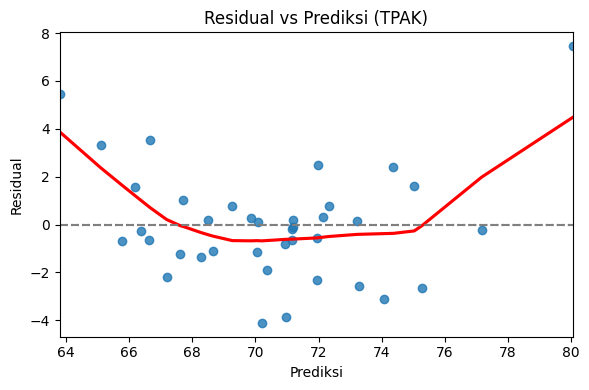

Durbin-Watson: 1.688 (ideal ≈ 2)
Breusch-Pagan p-value: 0.4433 (p > 0.05 ⇒ homoskedastik)
Shapiro-Wilk p-value: 0.0230 (p > 0.05 ⇒ normal residual)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import HuberRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.stats import shapiro
import seaborn as sns
import matplotlib.pyplot as plt

# Load & preprocessing
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv')
df.columns = df.columns.str.strip().str.replace('\u200b', '').str.replace(' ', '').str.lower()
df = df.drop(columns='rata-rata persentase pengeluaran perkapita laki-laki dan perempuan', errors='ignore')

# Define features & target
features = ['indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
            'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
            'penduduk_usia_15_tahun_keatas', 'persentase_ketidakcukupan_konsumsi_pangan',
            'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
            'hls laki-laki', 'hls perempuan', 'nikah', 'laju pertumbuhan penduduk per tahun']

X = df[features]
y = df['tpak']

# Scaling
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=features)

# Tuning jumlah fitur dengan CV
scores = []
feature_range = range(1, len(features) + 1)

for n in feature_range:
    selector = RFE(estimator=HuberRegressor(), n_features_to_select=n)
    selector = selector.fit(X_scaled, y)
    X_selected = X_scaled.loc[:, selector.support_]

    score = cross_val_score(HuberRegressor(), X_selected, y, scoring='neg_root_mean_squared_error', cv=5)
    scores.append(score.mean())

# Pilih jumlah fitur terbaik
best_n = feature_range[np.argmax(scores)]
print(f"✅ Jumlah fitur optimal: {best_n} (RMSE CV: {-max(scores):.4f})")

# Fit final model
selector_final = RFE(estimator=HuberRegressor(), n_features_to_select=best_n)
selector_final = selector_final.fit(X_scaled, y)
X_selected_final = X_scaled.loc[:, selector_final.support_]
selected_features = X_selected_final.columns.tolist()

# Fit model Huber
model = HuberRegressor().fit(X_selected_final, y)
y_pred = model.predict(X_selected_final)
residuals = y - y_pred

print("\n📌 Fitur terpilih:")
print(selected_features)

# Ringkasan model dengan statsmodels
X_const = sm.add_constant(X_selected_final)
ols_model = sm.OLS(y, X_const).fit()
print(ols_model.summary())

# Uji asumsi residual
# Residual vs prediksi
plt.figure(figsize=(6,4))
sns.residplot(x=y_pred, y=residuals, lowess=True, line_kws={'color':'red'})
plt.axhline(0, linestyle='--', color='gray')
plt.xlabel('Prediksi')
plt.ylabel('Residual')
plt.title('Residual vs Prediksi (TPAK)')
plt.tight_layout()
plt.show()

# Durbin-Watson (independensi)
dw = sm.stats.stattools.durbin_watson(residuals)
print(f"Durbin-Watson: {dw:.3f} (ideal ≈ 2)")

# Homoskedastisitas
lm_stat, lm_pvalue, _, _ = het_breuschpagan(residuals, X_const)
print(f"Breusch-Pagan p-value: {lm_pvalue:.4f} (p > 0.05 ⇒ homoskedastik)")

# Normalitas residual
shapiro_stat, shapiro_p = shapiro(residuals)
print(f"Shapiro-Wilk p-value: {shapiro_p:.4f} (p > 0.05 ⇒ normal residual)")


## Analisis 1

In [ ]:
# Tampilkan semua koefisien dan p-value IPM
ipm_coeffs = pd.DataFrame({
    "Koefisien": model_ipm.params,
    "P-Value": model_ipm.pvalues
}).sort_values(by="P-Value")

# Tampilkan hanya yang signifikan
print("Variabel Signifikan terhadap IPM:")
print(ipm_coeffs[ipm_coeffs["P-Value"] < 0.05])



Variabel Signifikan terhadap IPM:
                                  Koefisien       P-Value
const                             72.388421  2.272200e-54
pengeluaran per kapita laki-laki   2.027364  1.827921e-07
hls perempuan                      1.368098  1.126696e-02
angka_harapan_hidup_perempuan      7.885693  2.974281e-02


In [ ]:
tpak_coeffs = pd.DataFrame({
    "Koefisien":  model_tpak.params,
    "P-Value":  model_tpak.pvalues
}).sort_values(by="P-Value")

print("Variabel Signifikan terhadap TPAK:")
print(tpak_coeffs[tpak_coeffs["P-Value"] < 0.05])

Variabel Signifikan terhadap TPAK:
                                    Koefisien       P-Value
const                               70.719737  1.173037e-39
indek_tingkat_pengangguran_terbuka  -2.681206  9.213759e-05


In [ ]:
# Prediksi IPM
df['pred_ipm'] = model_ipm.predict(X_const)
df['residual_ipm'] = df['ipm'] - df['pred_ipm']

# Urutkan provinsi dengan kesalahan prediksi terbesar
print("5 Provinsi dengan Prediksi IPM yang Paling Meleset:")
print(df[['provinsi', 'ipm', 'pred_ipm', 'residual_ipm']].sort_values(by='residual_ipm', key=abs, ascending=False).head(5))

df['predicted_tpak'] = model_tpak.predict(X_const)
df['residual_tpak'] = df['tpak'] - df['predicted_tpak']

print("5 Provinsi dengan Prediksi IPM yang Paling Meleset:")
print(df[['provinsi', 'tpak', 'predicted_tpak', 'residual_tpak']].sort_values(by='residual_tpak', key=abs, ascending=False).head(5))


5 Provinsi dengan Prediksi IPM yang Paling Meleset:
                provinsi    ipm   pred_ipm  residual_ipm
37      PAPUA PEGUNUNGAN  53.42  54.696754     -1.276754
19      KALIMANTAN BARAT  70.13  71.330679     -1.200679
1         SUMATERA UTARA  74.02  72.883274      1.136726
25       SULAWESI TENGAH  71.56  70.583338      0.976662
8   KEP. BANGKA BELITUNG  73.33  74.274693     -0.944693
5 Provinsi dengan Prediksi IPM yang Paling Meleset:
            provinsi   tpak  predicted_tpak  residual_tpak
37  PAPUA PEGUNUNGAN  88.22       82.158091       6.061909
36      PAPUA TENGAH  73.13       77.692662      -4.562662
26  SULAWESI SELATAN  67.38       71.119359      -3.739359
0               ACEH  65.11       68.393653      -3.283653
9          KEP. RIAU  69.17       65.977710       3.192290


## Analisis lanjut

In [ ]:
import pandas as pd

# Load data
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv')

from sklearn.preprocessing import StandardScaler
# Strip spasi dan ganti karakter aneh di nama kolom
df.columns = df.columns.str.strip().str.replace('\u200b', '').str.replace(' ', '').str.lower()
df.drop(columns='rata-rata persentase pengeluaran perkapita laki-laki dan perempuan')
print(df.columns)
features = ['indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas',
       'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah',  'laju pertumbuhan penduduk per tahun']

scaler = StandardScaler()
Xr_scaled = scaler.fit_transform(df[features])
Xr_scaled = pd.DataFrame(Xr_scaled, columns=features)

# Tambahkan kolom konstanta
import statsmodels.api as sm
X_const = sm.add_constant(Xr_scaled)


Index(['provinsi', 'ipm', 'rata_lama_sekolah', 'tpak',
       'indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas',
       'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'rata-rata persentase pengeluaran perkapita laki-laki dan perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah',
       'laju pertumbuhan penduduk per tahun'],
      dtype='object')


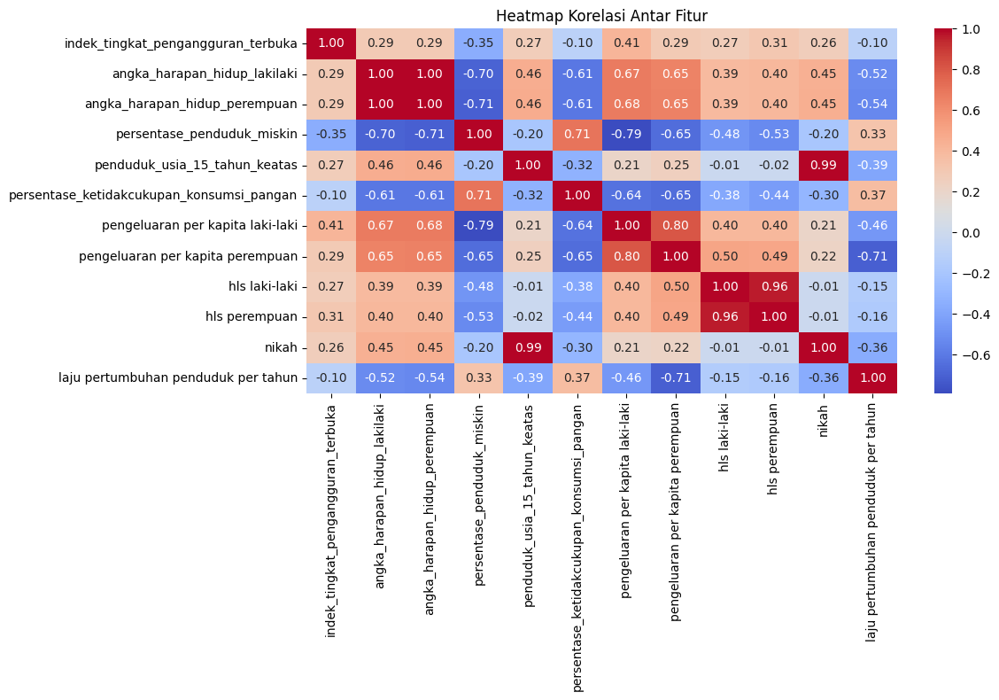

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Korelasi antar fitur
plt.figure(figsize=(12, 8))
sns.heatmap(Xr_scaled.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap Korelasi Antar Fitur')
plt.tight_layout()
plt.show()


### IPM

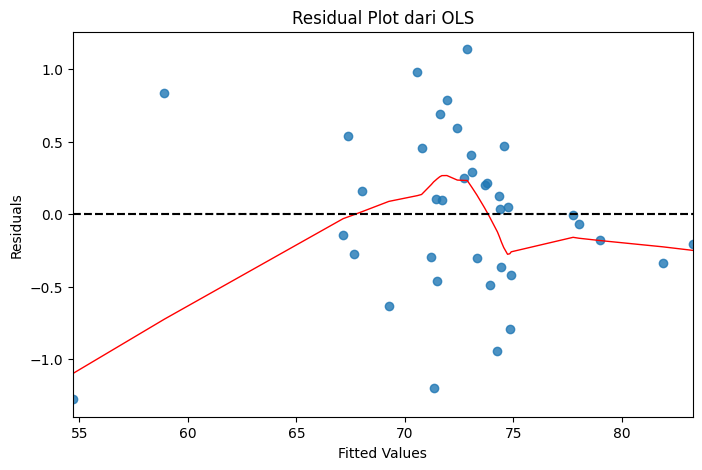

                            OLS Regression Results                            
Dep. Variable:                    ipm   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     171.2
Date:                Wed, 14 May 2025   Prob (F-statistic):           6.89e-21
Time:                        14:10:34   Log-Likelihood:                -31.695
No. Observations:                  38   AIC:                             89.39
Df Residuals:                      25   BIC:                             110.7
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [ ]:
# Target variabel
y = df['ipm']

# Model OLS
model_ols = sm.OLS(y, X_const).fit()

# Residual plot
plt.figure(figsize=(8, 5))
sns.residplot(x=model_ols.fittedvalues, y=model_ols.resid, lowess=True,
              line_kws={'color': 'red', 'lw': 1})
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot dari OLS')
plt.axhline(0, color='black', linestyle='--')
plt.show()

# Print ringkasan model
print(model_ols.summary())


Ridge alpha terbaik: 1.0
MSE Ridge: 0.3894283465349269
Lasso alpha terbaik: 0.004381030358645281
MSE Lasso: 0.3615468072787383


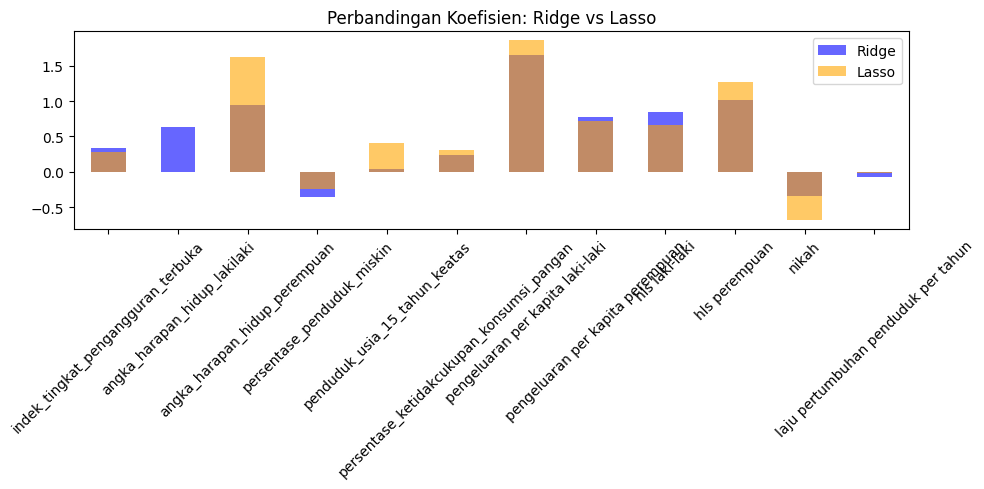

In [ ]:
from sklearn.linear_model import RidgeCV, LassoCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error

# Ridge dengan cross-validation
ridge = RidgeCV(alphas=[0.01, 0.1, 1.0, 10.0, 100.0], cv=5)
ridge.fit(Xr_scaled, y)
print("Ridge alpha terbaik:", ridge.alpha_)
print("MSE Ridge:", mean_squared_error(y, ridge.predict(Xr_scaled)))

# Lasso dengan cross-validation
lasso = LassoCV(alphas=None, cv=5, max_iter=10000)
lasso.fit(Xr_scaled, y)
print("Lasso alpha terbaik:", lasso.alpha_)
print("MSE Lasso:", mean_squared_error(y, lasso.predict(Xr_scaled)))

# Koefisien Ridge & Lasso
ridge_coef = pd.Series(ridge.coef_, index=features)
lasso_coef = pd.Series(lasso.coef_, index=features)

plt.figure(figsize=(10, 5))
ridge_coef.plot(kind='bar', color='blue', alpha=0.6, label='Ridge')
lasso_coef.plot(kind='bar', color='orange', alpha=0.6, label='Lasso')
plt.title('Perbandingan Koefisien: Ridge vs Lasso')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline

# PCA untuk 95% variansi
pca = PCA(n_components=0.85)
X_pca = pca.fit_transform(Xr_scaled)

print(f'Jumlah komponen utama untuk 95% variansi: {pca.n_components_}')

# OLS dengan hasil PCA
X_pca_const = sm.add_constant(X_pca)
model_pca_ols = sm.OLS(y, X_pca_const).fit()

print(model_pca_ols.summary())


Jumlah komponen utama untuk 95% variansi: 5
                            OLS Regression Results                            
Dep. Variable:                    ipm   R-squared:                       0.965
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                     178.3
Date:                Wed, 14 May 2025   Prob (F-statistic):           2.22e-22
Time:                        14:10:34   Log-Likelihood:                -51.811
No. Observations:                  38   AIC:                             115.6
Df Residuals:                      32   BIC:                             125.4
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const   

### TPAK

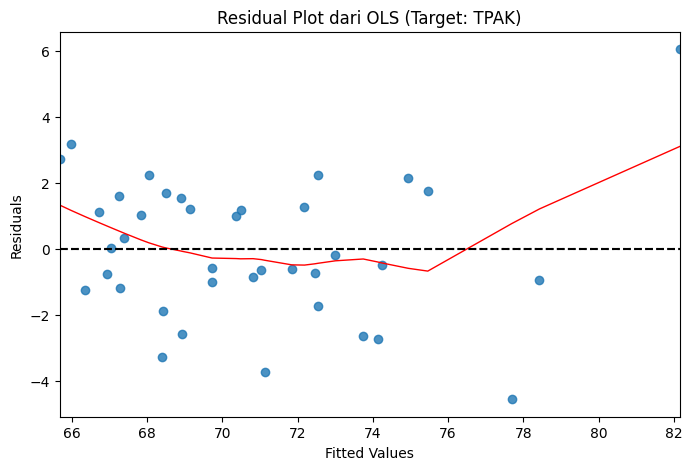

                            OLS Regression Results                            
Dep. Variable:                   tpak   R-squared:                       0.754
Model:                            OLS   Adj. R-squared:                  0.636
Method:                 Least Squares   F-statistic:                     6.387
Date:                Wed, 14 May 2025   Prob (F-statistic):           4.90e-05
Time:                        14:10:34   Log-Likelihood:                -82.318
No. Observations:                  38   AIC:                             190.6
Df Residuals:                      25   BIC:                             211.9
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [ ]:
# Target variabel
y_tpak = df['tpak']

# Tambahkan konstanta (pakai yang sudah dibuat sebelumnya)
model_ols_tpak = sm.OLS(y_tpak, X_const).fit()

# Residual plot
plt.figure(figsize=(8, 5))
sns.residplot(x=model_ols_tpak.fittedvalues, y=model_ols_tpak.resid, lowess=True,
              line_kws={'color': 'red', 'lw': 1})
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot dari OLS (Target: TPAK)')
plt.axhline(0, color='black', linestyle='--')
plt.show()

# Ringkasan model
print(model_ols_tpak.summary())


Ridge alpha terbaik (TPAK): 10.0
MSE Ridge (TPAK): 5.765856447632794
Lasso alpha terbaik (TPAK): 0.5796791282423951
MSE Lasso (TPAK): 7.164936779071254


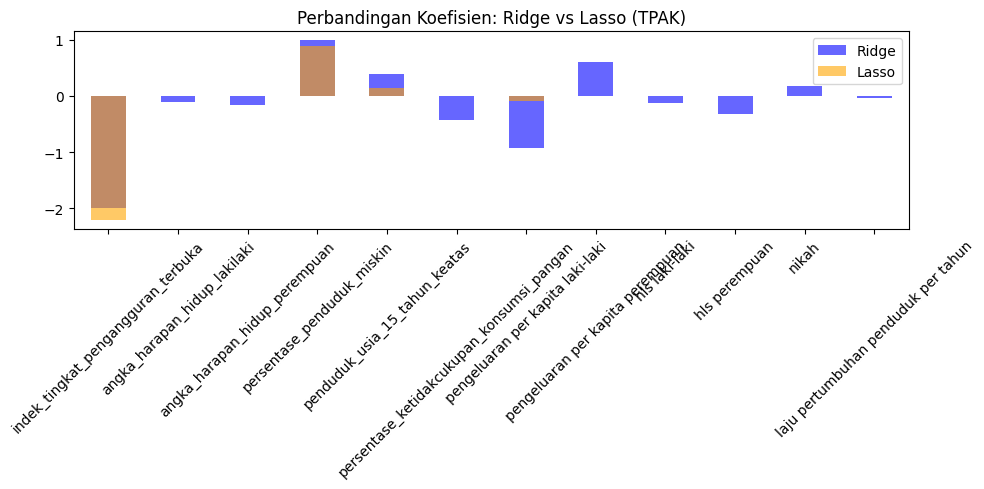

In [ ]:
# Ridge
ridge_tpak = RidgeCV(alphas=[0.01, 0.1, 1.0, 10.0, 100.0], cv=5)
ridge_tpak.fit(Xr_scaled, y_tpak)
print("Ridge alpha terbaik (TPAK):", ridge_tpak.alpha_)
print("MSE Ridge (TPAK):", mean_squared_error(y_tpak, ridge_tpak.predict(Xr_scaled)))

# Lasso
lasso_tpak = LassoCV(alphas=None, cv=5, max_iter=10000)
lasso_tpak.fit(Xr_scaled, y_tpak)
print("Lasso alpha terbaik (TPAK):", lasso_tpak.alpha_)
print("MSE Lasso (TPAK):", mean_squared_error(y_tpak, lasso_tpak.predict(Xr_scaled)))

# Plot koefisien
ridge_coef_tpak = pd.Series(ridge_tpak.coef_, index=features)
lasso_coef_tpak = pd.Series(lasso_tpak.coef_, index=features)

plt.figure(figsize=(10, 5))
ridge_coef_tpak.plot(kind='bar', color='blue', alpha=0.6, label='Ridge')
lasso_coef_tpak.plot(kind='bar', color='orange', alpha=0.6, label='Lasso')
plt.title('Perbandingan Koefisien: Ridge vs Lasso (TPAK)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# PCA transform (pakai model yang sama jika sudah dibuat untuk IPM)
X_pca_tpak = pca.transform(Xr_scaled)

# OLS dengan PCA
X_pca_const_tpak = sm.add_constant(X_pca_tpak)
model_pca_ols_tpak = sm.OLS(y_tpak, X_pca_const_tpak).fit()

print(model_pca_ols_tpak.summary())


                            OLS Regression Results                            
Dep. Variable:                   tpak   R-squared:                       0.664
Model:                            OLS   Adj. R-squared:                  0.612
Method:                 Least Squares   F-statistic:                     12.67
Date:                Wed, 14 May 2025   Prob (F-statistic):           7.89e-07
Time:                        14:10:35   Log-Likelihood:                -88.220
No. Observations:                  38   AIC:                             188.4
Df Residuals:                      32   BIC:                             198.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         70.7197      0.436    162.218      0.0

# **Random Forest Regression**


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.inspection import partial_dependence, PartialDependenceDisplay
import shap
import matplotlib.pyplot as plt
import pandas as pd

# Load data
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/DATASET_PROJEK_DATMIN.csv')

from sklearn.preprocessing import StandardScaler
# Strip spasi dan ganti karakter aneh di nama kolom
df.columns = df.columns.str.strip().str.replace('\u200b', '').str.replace(' ', '').str.lower()
df.drop(columns='rata-rata persentase pengeluaran perkapita laki-laki dan perempuan')
print(df.columns)
features = ['indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas',
       'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah',  'laju pertumbuhan penduduk per tahun']
scaler = StandardScaler()
Xr_scaled = scaler.fit_transform(df[features])
Xr_scaled = pd.DataFrame(Xr_scaled, columns=features)
# X = variabel independen (sudah distandarkan sebelumnya)
X = Xr_scaled
y_ipm = df['ipm']
y_tpak = df['tpak']

# Train Random Forest untuk IPM
rf_ipm = RandomForestRegressor(random_state=42, n_estimators=100)
rf_ipm.fit(X, y_ipm)
df['pred_rf_ipm'] = rf_ipm.predict(X)
df['resid_rf_ipm'] = df['ipm'] - df['pred_rf_ipm']

# Train Random Forest untuk TPAK
rf_tpak = RandomForestRegressor(random_state=42, n_estimators=100)
rf_tpak.fit(X, y_tpak)
df['pred_rf_tpak'] = rf_tpak.predict(X)
df['resid_rf_tpak'] = df['tpak'] - df['pred_rf_tpak']

# Evaluasi R2 & Error
def evaluate_model(y_true, y_pred, label):
    print(f"\n📊 Evaluasi Model Random Forest untuk {label.upper()}")
    print(f"R-squared       : {r2_score(y_true, y_pred):.3f}")
    print(f"RMSE            : {np.sqrt(mean_squared_error(y_true, y_pred)):.3f}")
    print(f"MAE             : {mean_absolute_error(y_true, y_pred):.3f}")

evaluate_model(df['ipm'], df['pred_rf_ipm'], 'IPM')
evaluate_model(df['tpak'], df['pred_rf_tpak'], 'TPAK')

# Feature importance
feat_imp_ipm = pd.Series(rf_ipm.feature_importances_, index=X.columns).sort_values(ascending=False)
feat_imp_tpak = pd.Series(rf_tpak.feature_importances_, index=X.columns).sort_values(ascending=False)

print("\n🔍 Feature Importance - IPM")
print(feat_imp_ipm)

print("\n🔍 Feature Importance - TPAK")
print(feat_imp_tpak)

# Residual analisis: Provinsi yang prediksinya paling meleset
print("\n❗ Provinsi dengan Prediksi IPM yang Paling Meleset:")
print(df[['provinsi', 'ipm', 'pred_rf_ipm', 'resid_rf_ipm']].sort_values(by='resid_rf_ipm', key=abs, ascending=False).head())

print("\n❗ Provinsi dengan Prediksi TPAK yang Paling Meleset:")
print(df[['provinsi', 'tpak', 'pred_rf_tpak', 'resid_rf_tpak']].sort_values(by='resid_rf_tpak', key=abs, ascending=False).head())


Index(['provinsi', 'ipm', 'rata_lama_sekolah', 'tpak',
       'indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas',
       'persentase_ketidakcukupan_konsumsi_pangan',
       'pengeluaran per kapita laki-laki', 'pengeluaran per kapita perempuan',
       'rata-rata persentase pengeluaran perkapita laki-laki dan perempuan',
       'hls laki-laki', 'hls perempuan', 'nikah',
       'laju pertumbuhan penduduk per tahun'],
      dtype='object')

📊 Evaluasi Model Random Forest untuk IPM
R-squared       : 0.972
RMSE            : 0.858
MAE             : 0.611

📊 Evaluasi Model Random Forest untuk TPAK
R-squared       : 0.923
RMSE            : 1.181
MAE             : 0.841

🔍 Feature Importance - IPM
persentase_penduduk_miskin                   0.261989
pengeluaran per kapita perempuan             0.198250
pengeluaran per kapita laki-laki             0.141598
angka_harapa

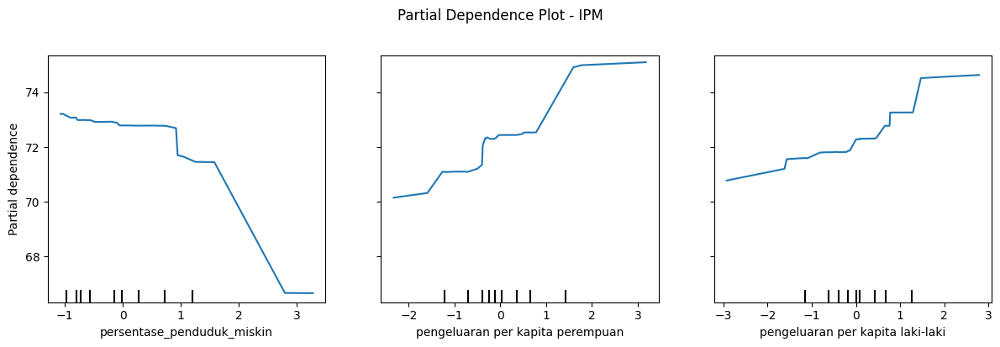

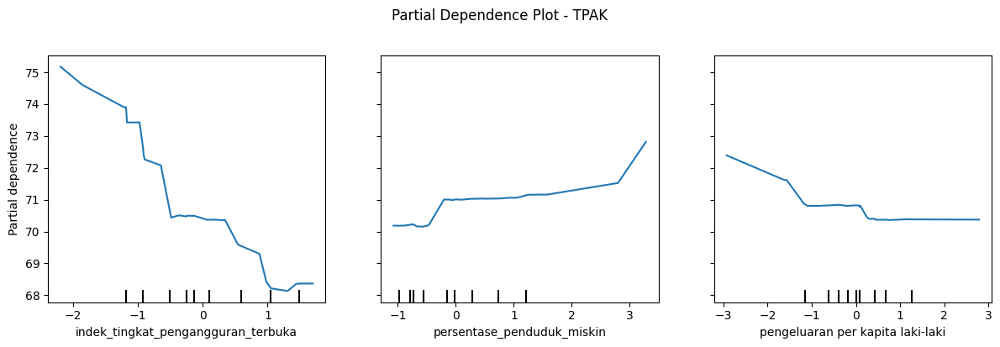

In [ ]:
# Partial Dependence Plot untuk fitur top 3 IPM
top3_ipm = feat_imp_ipm.head(3).index.tolist()
fig, ax = plt.subplots(figsize=(12, 4))
PartialDependenceDisplay.from_estimator(rf_ipm, X, features=top3_ipm, ax=ax)
plt.suptitle('Partial Dependence Plot - IPM', y=1.02)
plt.tight_layout()
plt.show()

# Partial Dependence Plot untuk fitur top 3 TPAK
top3_tpak = feat_imp_tpak.head(3).index.tolist()
fig, ax = plt.subplots(figsize=(12, 4))
PartialDependenceDisplay.from_estimator(rf_tpak, X, features=top3_tpak, ax=ax)
plt.suptitle('Partial Dependence Plot - TPAK', y=1.02)
plt.tight_layout()
plt.show()


# **Forecasting**

##IPM

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpshbip1e8/iw0n8evd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpshbip1e8/9mk0vc8n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79318', 'data', 'file=/tmp/tmpshbip1e8/iw0n8evd.json', 'init=/tmp/tmpshbip1e8/9mk0vc8n.json', 'output', 'file=/tmp/tmpshbip1e8/prophet_modelyvbuue7s/prophet_model-20250607160548.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:05:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:05:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-13b0eb8b0816>:119: FutureWarning: the 'smoothin

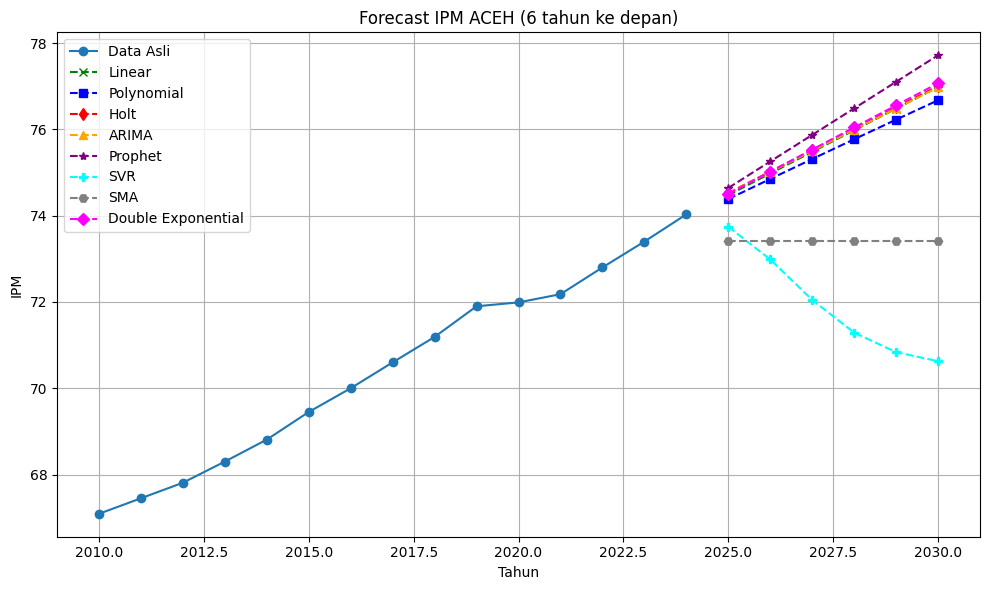

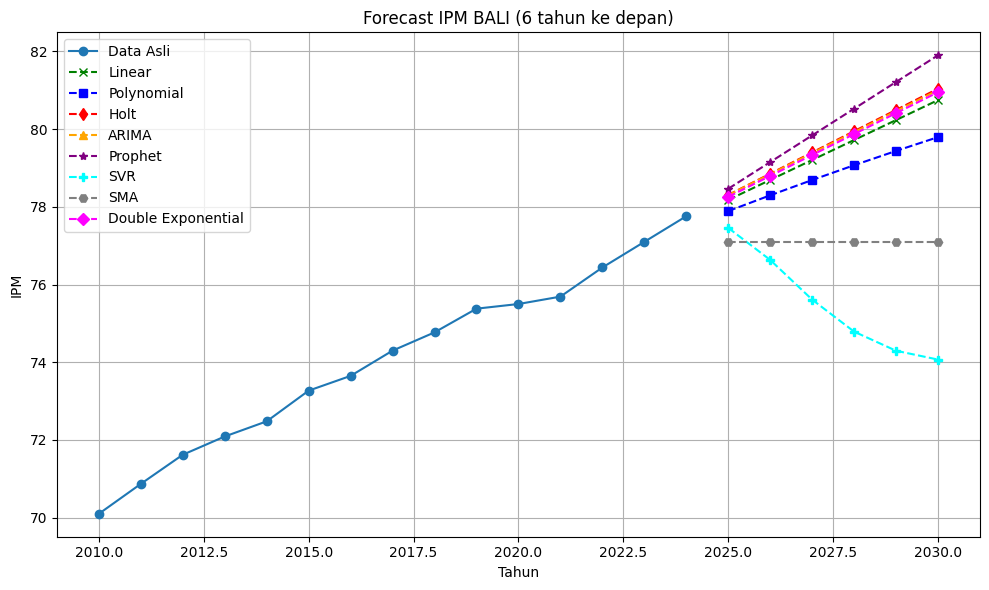

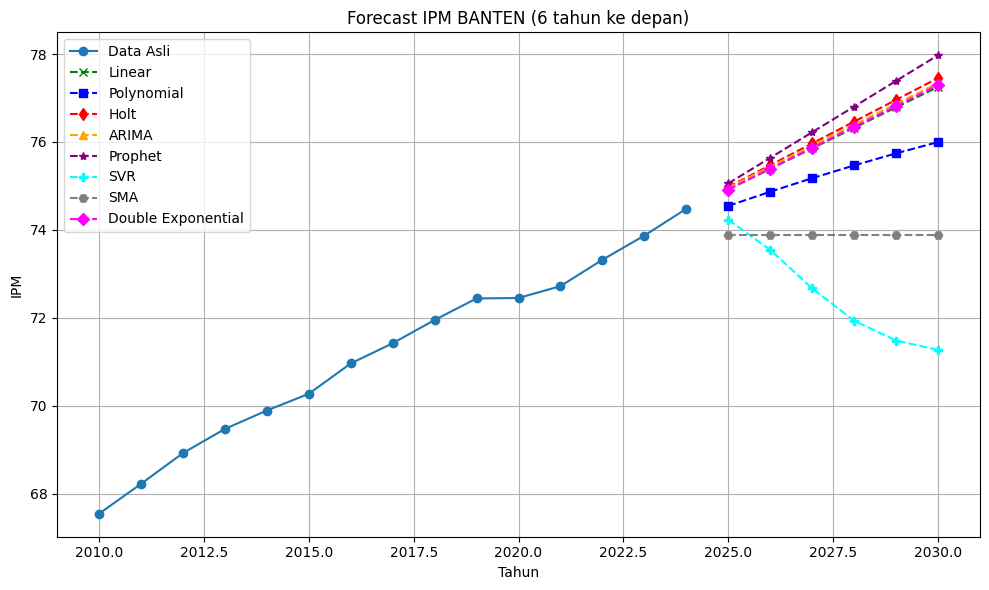

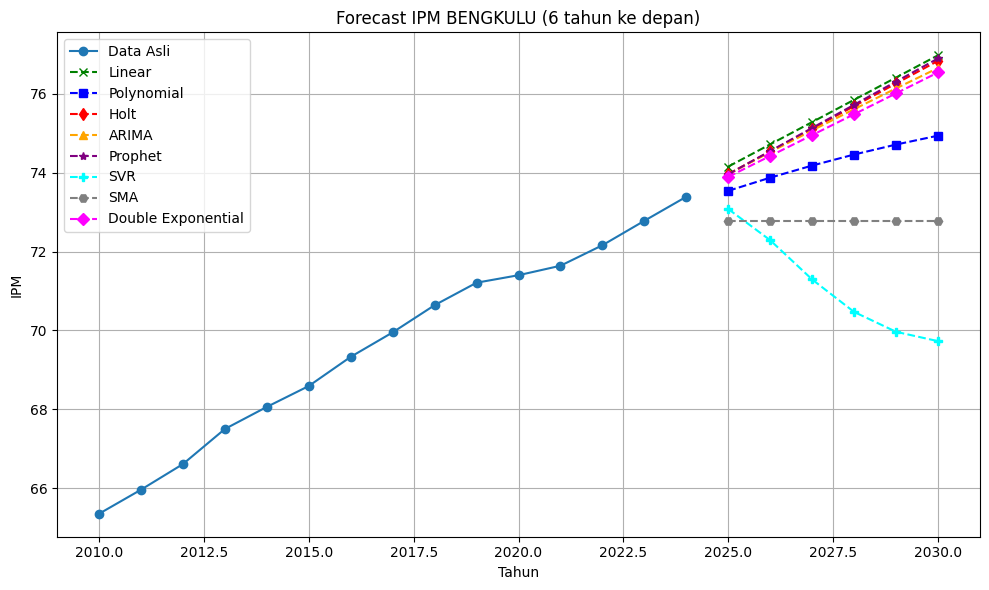

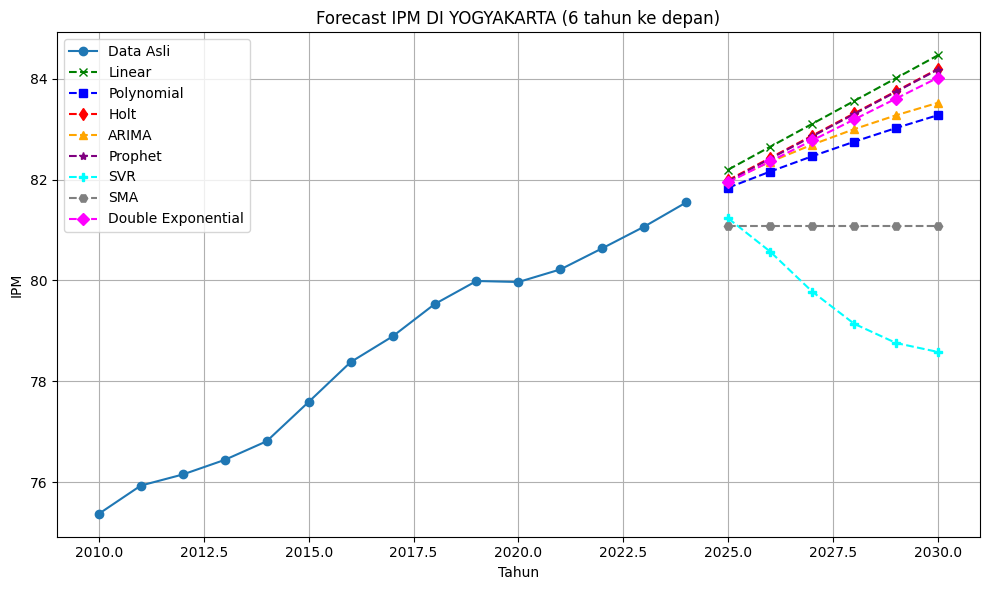

...

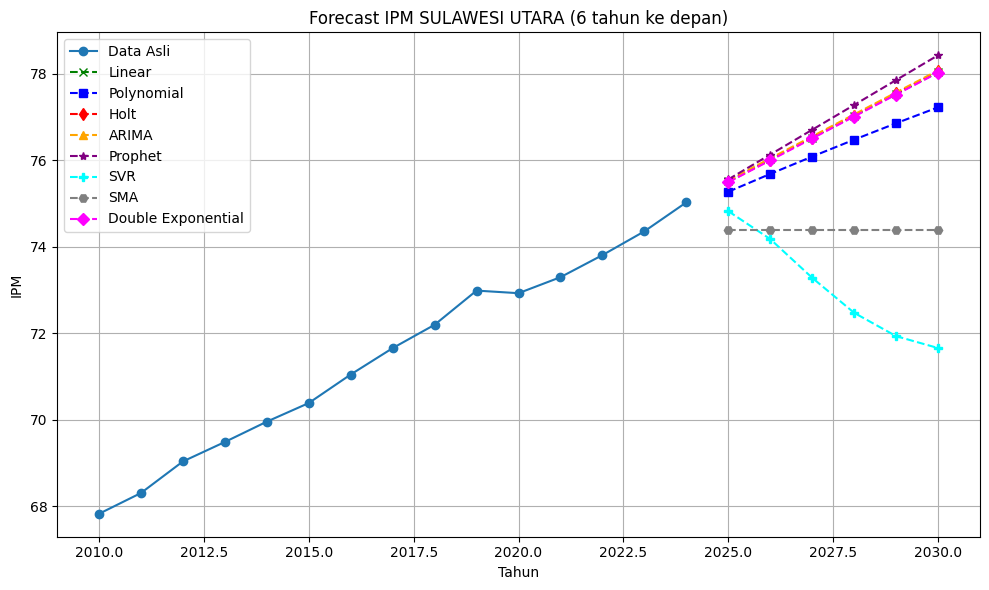

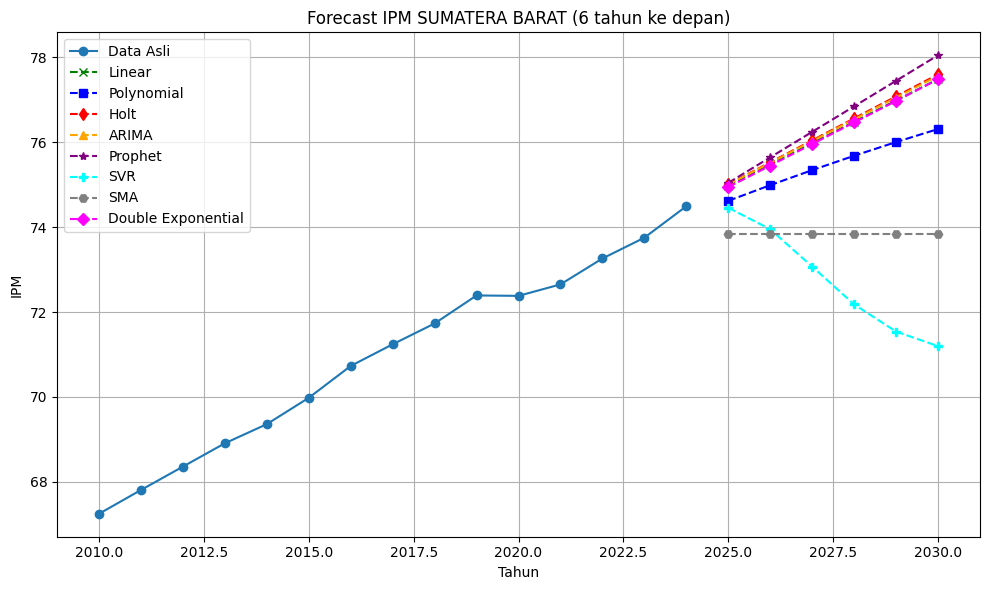

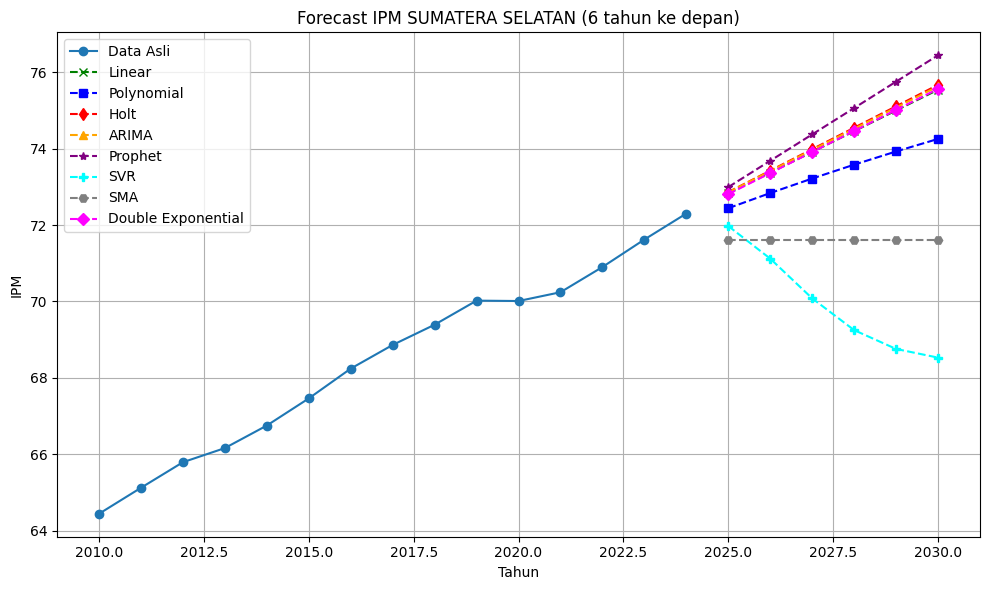

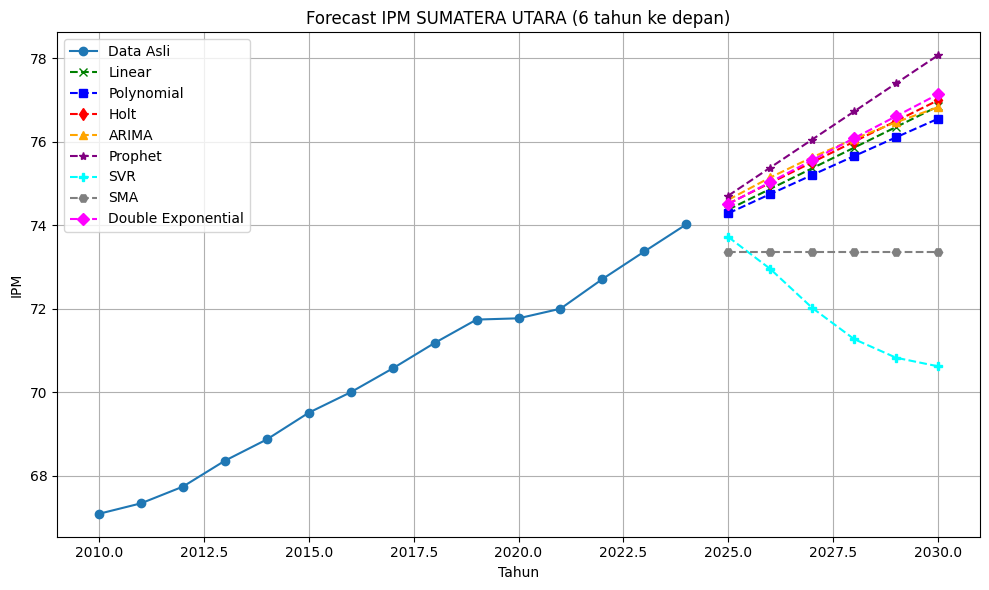

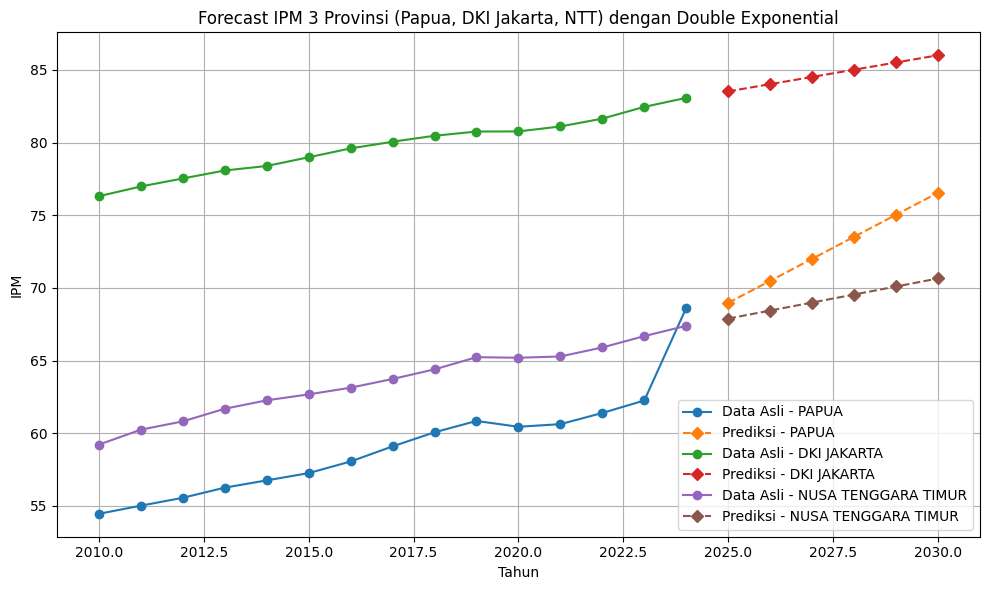

In [ ]:
# ================================================
# 📌 IMPORT LIBRARY
# ================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import statsmodels.api as sm
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
import lightgbm as lgb

from prophet import Prophet

# ================================================
# 📌 BACA DATA & PREPROCESSING
# ================================================
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/ipm_pivot.csv')

# Ganti koma dengan titik dan konversi ke float
provinsi_cols = df.columns[1:]
df[provinsi_cols] = df[provinsi_cols].apply(lambda x: x.str.replace(',', '.').astype(float))

# ================================================
# 📌 FUNGSI FORECAST
# ================================================
def forecast_linear(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    model = LinearRegression()
    model.fit(X, y)

    y_pred = model.predict(np.array(tahun_prediksi).reshape(-1, 1))
    return y_pred

def forecast_polynomial(provinsi, tahun_prediksi, degree=2):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)

    model = LinearRegression()
    model.fit(X_poly, y)

    X_pred_poly = poly.transform(np.array(tahun_prediksi).reshape(-1, 1))
    y_pred = model.predict(X_pred_poly)
    return y_pred

def forecast_holt(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    model = ExponentialSmoothing(y, trend='add', seasonal=None, damped_trend=False)
    model_fit = model.fit(optimized=True)

    y_pred = model_fit.forecast(len(tahun_prediksi))
    return y_pred

def forecast_arima(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    try:
        model = sm.tsa.ARIMA(y, order=(1, 1, 1))
        model_fit = model.fit()
        y_pred = model_fit.forecast(steps=len(tahun_prediksi))
    except:
        # fallback ARIMA jika error
        y_pred = [y[-1]] * len(tahun_prediksi)

    return y_pred

def forecast_prophet(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna().rename(columns={'Tahun': 'ds', provinsi: 'y'})
    data['ds'] = pd.to_datetime(data['ds'], format='%Y')

    m = Prophet(yearly_seasonality=False, daily_seasonality=False)
    m.fit(data)

    future = pd.DataFrame({'ds': pd.to_datetime(tahun_prediksi, format='%Y')})
    forecast = m.predict(future)

    y_pred = forecast['yhat'].values
    return y_pred

def forecast_svr(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
    model.fit(X, y)

    y_pred = model.predict(np.array(tahun_prediksi).reshape(-1, 1))
    return y_pred

def forecast_sma(provinsi, tahun_prediksi, window=3):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].rolling(window=window).mean().dropna()

    # Karena rolling mengurangi jumlah data, sesuaikan tahun
    tahun = data['Tahun'][window-1:]

    last_sma = y.values[-1]
    y_pred = [last_sma] * len(tahun_prediksi)
    return y_pred

def forecast_double_exponential(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    model = ExponentialSmoothing(y, trend='add', seasonal=None, damped_trend=False)
    model_fit = model.fit(smoothing_level=0.8, smoothing_slope=0.2, optimized=False)

    y_pred = model_fit.forecast(len(tahun_prediksi))
    return y_pred

# ================================================
# 📌 PARAMETER: TAHUN PREDIKSI
# ================================================
tahun_terakhir = df['Tahun'].max()
tahun_prediksi = [tahun_terakhir + i for i in range(1, 7)]  # 6 tahun ke depan

# ================================================
# 📌 SIMPAN HASIL SEMUA PROVINSI
# ================================================
results = []

for provinsi in provinsi_cols:
    linear_preds = forecast_linear(provinsi, tahun_prediksi)
    poly_preds = forecast_polynomial(provinsi, tahun_prediksi, degree=2)
    holt_preds = forecast_holt(provinsi, tahun_prediksi)
    arima_preds = forecast_arima(provinsi, tahun_prediksi)
    prophet_preds = forecast_prophet(provinsi, tahun_prediksi)
    svr_preds = forecast_svr(provinsi, tahun_prediksi)
    sma_preds = forecast_sma(provinsi, tahun_prediksi)
    double_exp_preds = forecast_double_exponential(provinsi, tahun_prediksi)


    for tahun, linear, poly, holt, arima, prophet, svr, sma, double_exp in zip(
        tahun_prediksi, linear_preds, poly_preds, holt_preds, arima_preds, prophet_preds,
         svr_preds, sma_preds, double_exp_preds):
        results.append({
            'Provinsi': provinsi,
            'Tahun': tahun,
            'Linear_Regression': linear,
            'Polynomial_Regression': poly,
            'Holt_Exponential': holt,
            'ARIMA': arima,
            'Prophet': prophet,
            'SVR': svr,
            'SMA': sma,
            'Double_Exponential': double_exp
        })

# Gabungkan ke DataFrame
forecast_df = pd.DataFrame(results)

# Simpan ke file CSV
forecast_df.to_csv("/content/drive/Shareddrives/data mining sem 4/forecast_ipm_semua_model.csv", index=False)

# ================================================
# 📌 VISUALISASI SEMUA PROVINSI
# ================================================
for provinsi in provinsi_cols:
    data_asli = df[['Tahun', provinsi]].dropna()

    plt.figure(figsize=(10, 6))
    plt.plot(data_asli['Tahun'], data_asli[provinsi], marker='o', label='Data Asli')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Linear_Regression'],
             marker='x', linestyle='--', color='green', label='Linear')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Polynomial_Regression'],
             marker='s', linestyle='--', color='blue', label='Polynomial')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Holt_Exponential'],
             marker='d', linestyle='--', color='red', label='Holt')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['ARIMA'],
             marker='^', linestyle='--', color='orange', label='ARIMA')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Prophet'],
             marker='*', linestyle='--', color='purple', label='Prophet')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['SVR'],
             marker='P', linestyle='--', color='cyan', label='SVR')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['SMA'],
             marker='H', linestyle='--', color='gray', label='SMA')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Double_Exponential'],
             marker='D', linestyle='--', color='magenta', label='Double Exponential')

    plt.xlabel('Tahun')
    plt.ylabel('IPM')
    plt.title(f'Forecast IPM {provinsi} (6 tahun ke depan)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
import matplotlib.pyplot as plt

# ================================================
# 📌 VISUALISASI 3 PROVINSI (Papua, Jakarta, NTT) dengan Double Exponential
# ================================================
provinsi_pilihan = ['PAPUA', 'DKI JAKARTA', 'NUSA TENGGARA TIMUR']

plt.figure(figsize=(10, 6))

for provinsi in provinsi_pilihan:
    data_asli = df[['Tahun', provinsi]].dropna()
    plt.plot(data_asli['Tahun'], data_asli[provinsi], marker='o', label=f'Data Asli - {provinsi}')

    y_pred = forecast_df[forecast_df['Provinsi'] == provinsi]['Double_Exponential'].values
    plt.plot(tahun_prediksi, y_pred, marker='D', linestyle='--', label=f'Prediksi - {provinsi}')

plt.xlabel('Tahun')
plt.ylabel('IPM')
plt.title('Forecast IPM 3 Provinsi (Papua, DKI Jakarta, NTT) dengan Double Exponential')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


##Pengangguran Terbuka

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 4.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpshbip1e8/c_l672iy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpshbip1e8/zp1g507i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67021', 'data', 'file=/tmp/tmpshbip1e8/c_l672iy.json', 'init=/tmp/tmpshbip1e8/zp1g507i.json', 'output', 'file=/tmp/tmpshbip1e8/prophet_modelh9lwtgcr/prophet_model-20250607160908.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:09:08 - cm

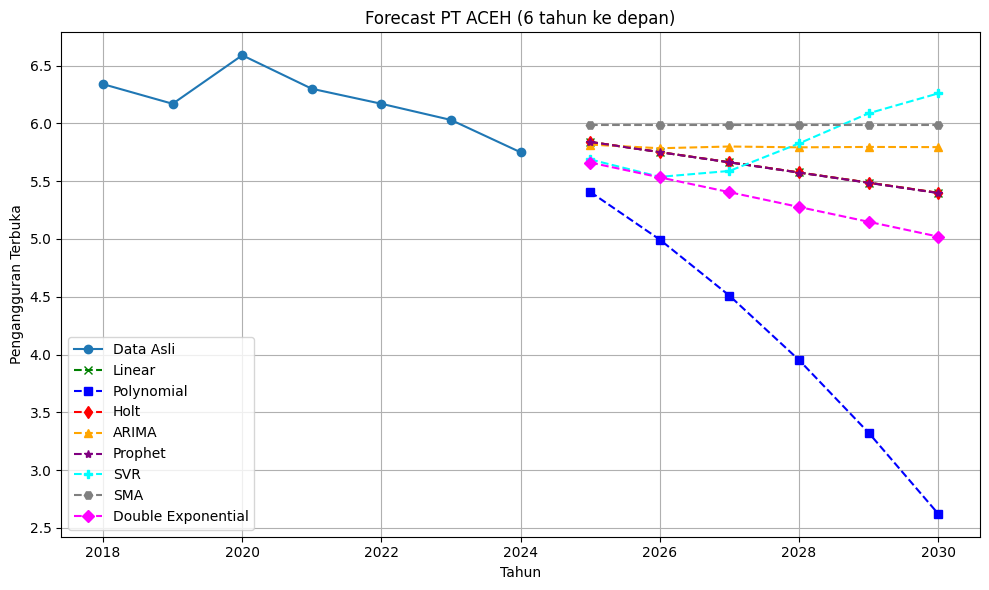

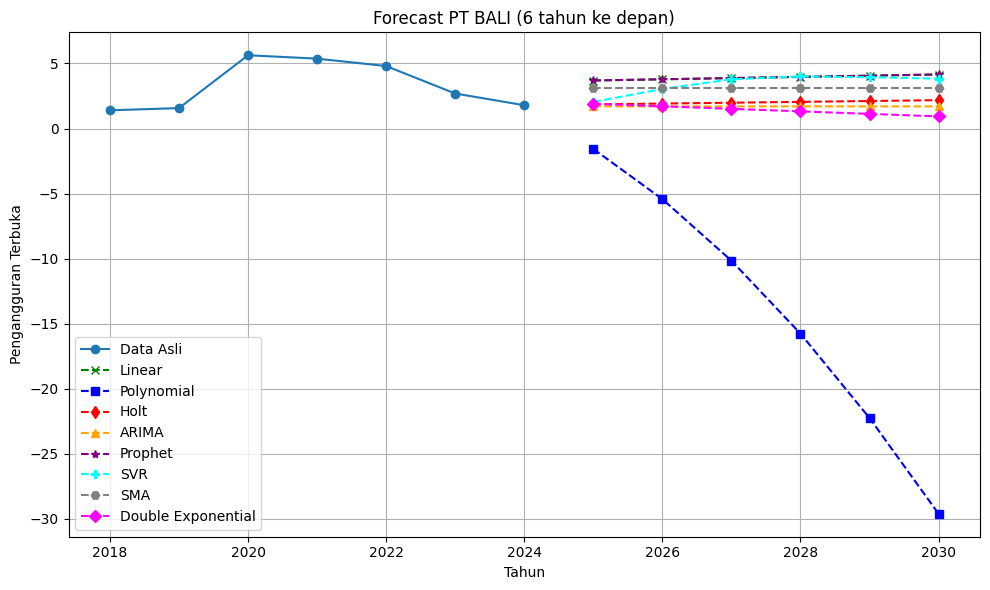

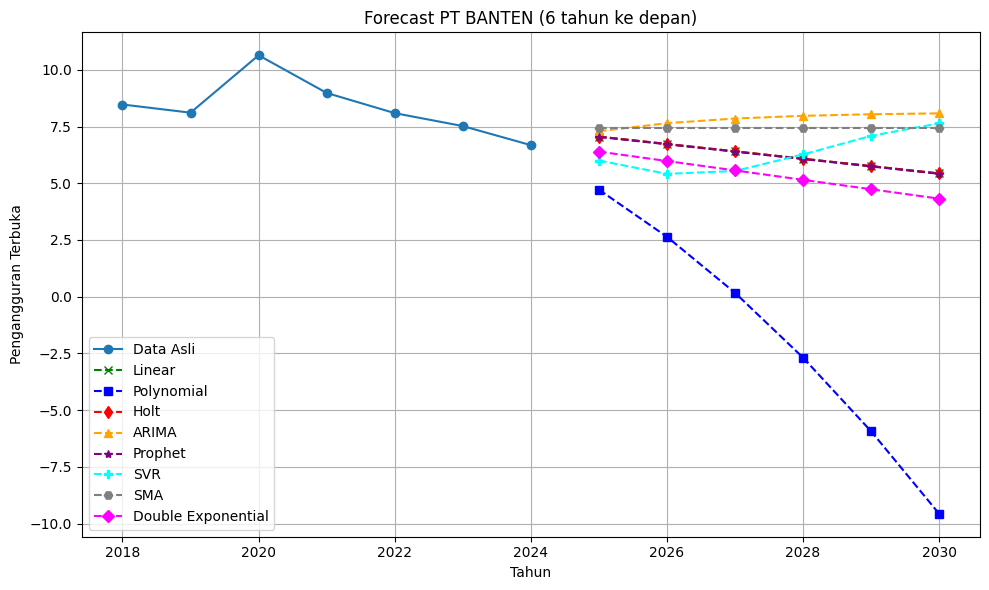

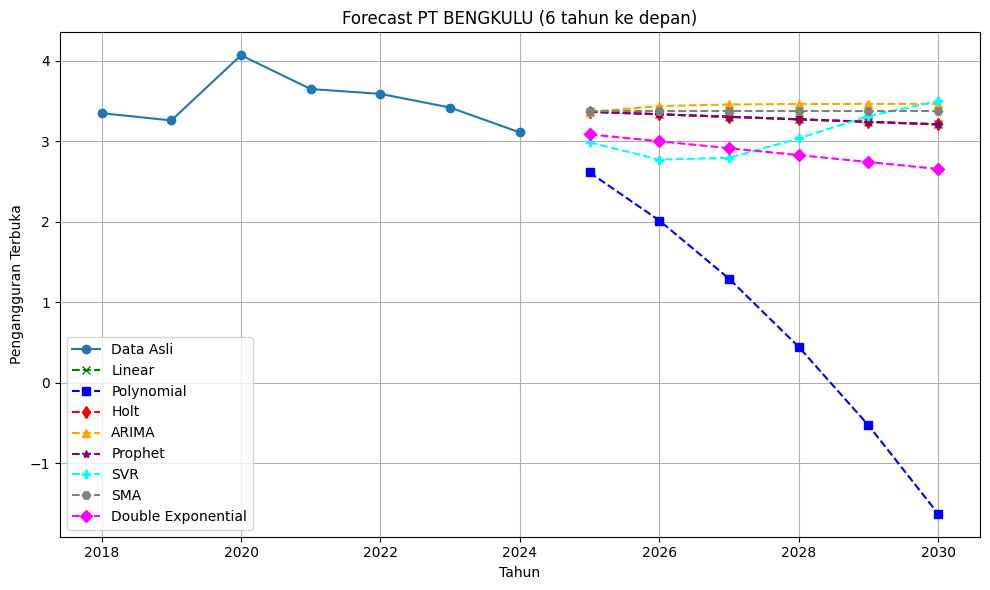

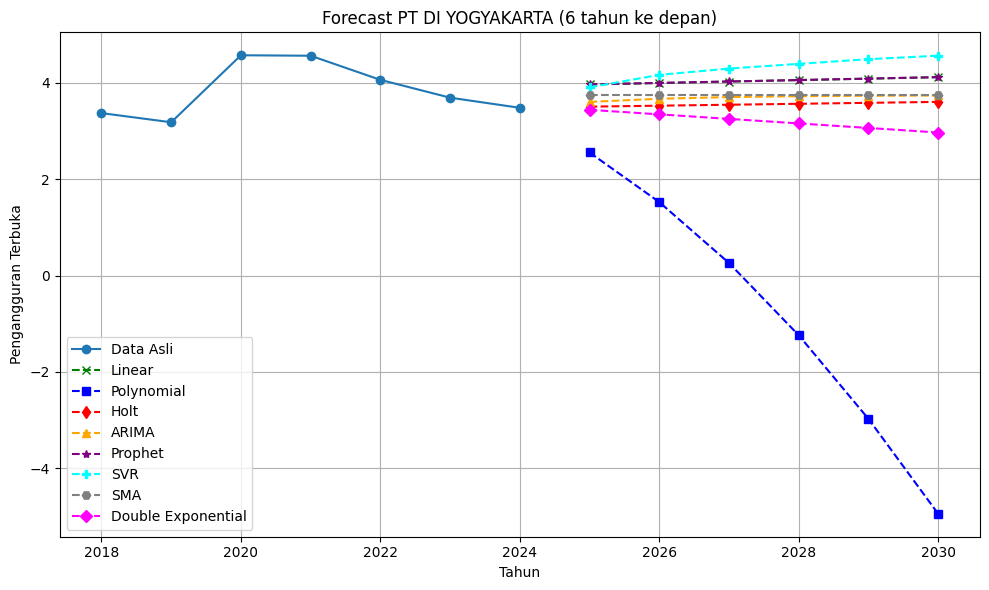

...

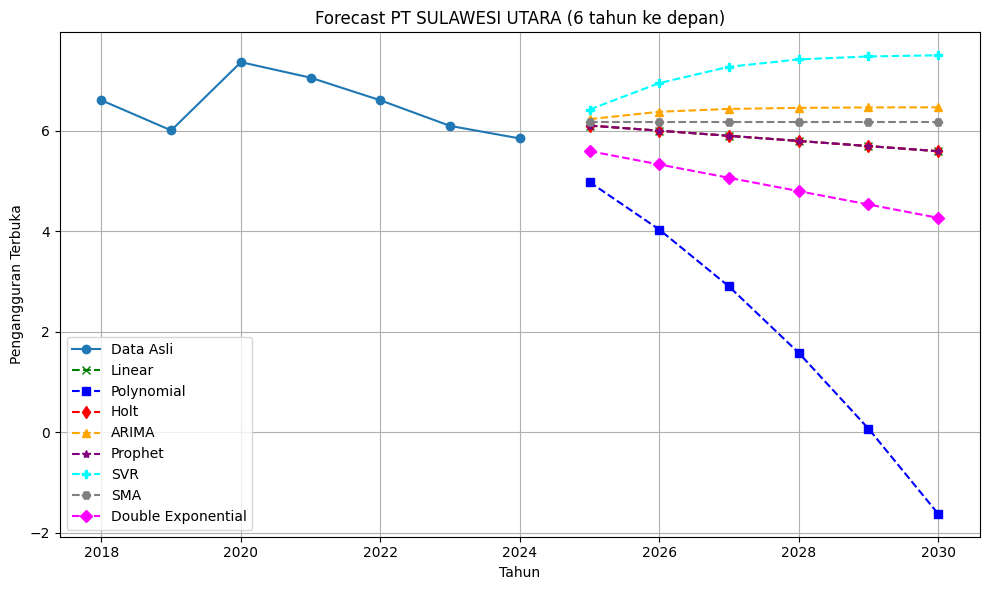

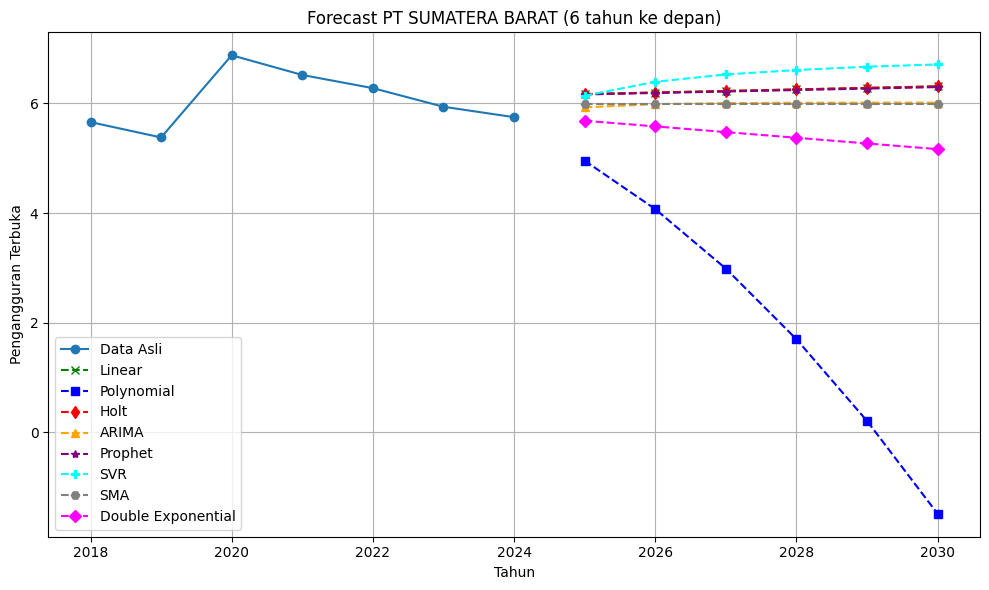

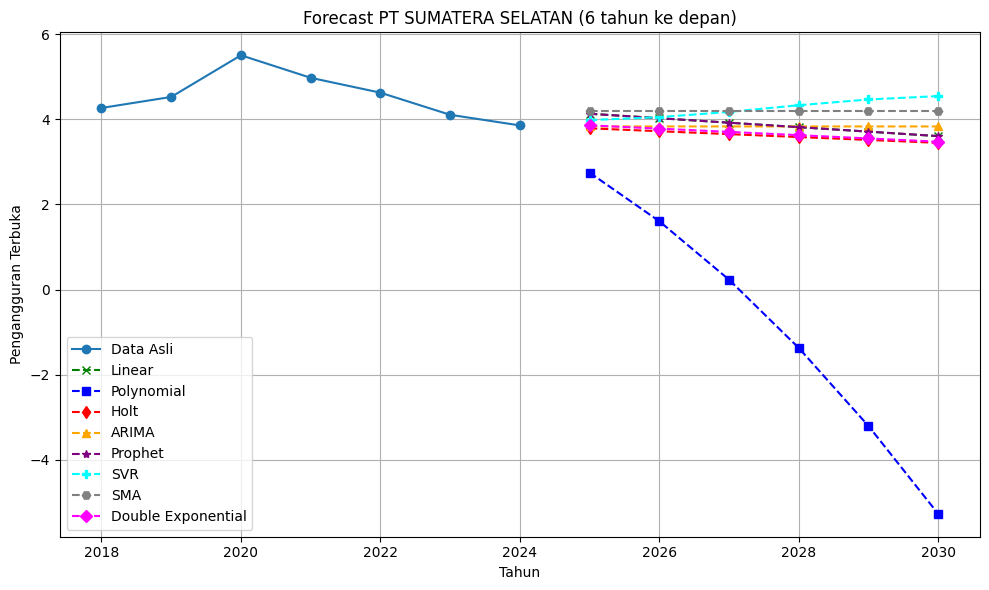

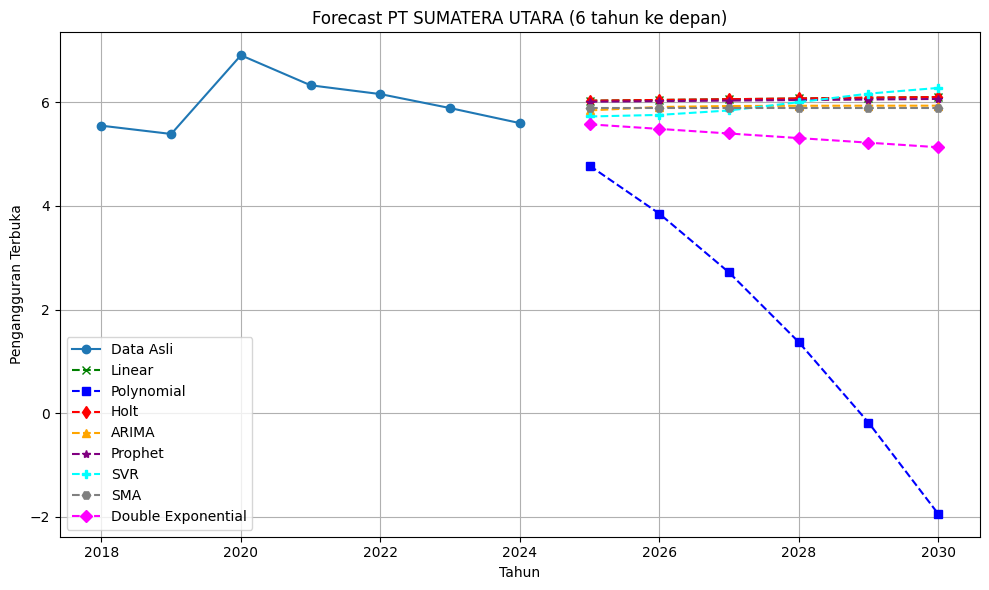

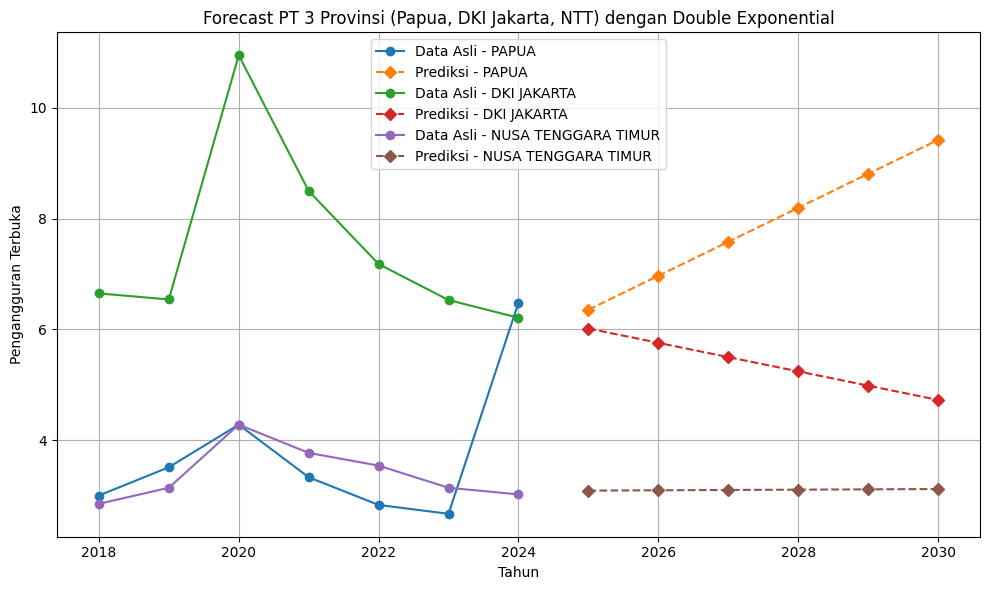

In [ ]:
# ================================================
# 📌 IMPORT LIBRARY
# ================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import statsmodels.api as sm
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
import lightgbm as lgb

from prophet import Prophet

# ================================================
# 📌 BACA DATA & PREPROCESSING
# ================================================
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/tpask_pivot.csv')

# Ganti koma dengan titik dan konversi ke float
provinsi_cols = df.columns[1:]
# df[provinsi_cols] = df[provinsi_cols].apply(lambda x: x.str.replace(',', '.').astype(float))

# ================================================
# 📌 FUNGSI FORECAST
# ================================================
def forecast_linear(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    model = LinearRegression()
    model.fit(X, y)

    y_pred = model.predict(np.array(tahun_prediksi).reshape(-1, 1))
    return y_pred

def forecast_polynomial(provinsi, tahun_prediksi, degree=2):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)

    model = LinearRegression()
    model.fit(X_poly, y)

    X_pred_poly = poly.transform(np.array(tahun_prediksi).reshape(-1, 1))
    y_pred = model.predict(X_pred_poly)
    return y_pred

def forecast_holt(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    model = ExponentialSmoothing(y, trend='add', seasonal=None, damped_trend=False)
    model_fit = model.fit(optimized=True)

    y_pred = model_fit.forecast(len(tahun_prediksi))
    return y_pred

def forecast_arima(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    try:
        model = sm.tsa.ARIMA(y, order=(1, 1, 1))
        model_fit = model.fit()
        y_pred = model_fit.forecast(steps=len(tahun_prediksi))
    except:
        # fallback ARIMA jika error
        y_pred = [y[-1]] * len(tahun_prediksi)

    return y_pred

def forecast_prophet(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna().rename(columns={'Tahun': 'ds', provinsi: 'y'})
    data['ds'] = pd.to_datetime(data['ds'], format='%Y')

    m = Prophet(yearly_seasonality=False, daily_seasonality=False)
    m.fit(data)

    future = pd.DataFrame({'ds': pd.to_datetime(tahun_prediksi, format='%Y')})
    forecast = m.predict(future)

    y_pred = forecast['yhat'].values
    return y_pred

def forecast_svr(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
    model.fit(X, y)

    y_pred = model.predict(np.array(tahun_prediksi).reshape(-1, 1))
    return y_pred

def forecast_sma(provinsi, tahun_prediksi, window=3):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].rolling(window=window).mean().dropna()

    # Karena rolling mengurangi jumlah data, sesuaikan tahun
    tahun = data['Tahun'][window-1:]

    last_sma = y.values[-1]
    y_pred = [last_sma] * len(tahun_prediksi)
    return y_pred

def forecast_double_exponential(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    model = ExponentialSmoothing(y, trend='add', seasonal=None, damped_trend=False)
    model_fit = model.fit(smoothing_level=0.8, smoothing_slope=0.2, optimized=False)

    y_pred = model_fit.forecast(len(tahun_prediksi))
    return y_pred

# ================================================
# 📌 PARAMETER: TAHUN PREDIKSI
# ================================================
tahun_terakhir = df['Tahun'].max()
tahun_prediksi = [tahun_terakhir + i for i in range(1, 7)]  # 6 tahun ke depan

# ================================================
# 📌 SIMPAN HASIL SEMUA PROVINSI
# ================================================
results = []

for provinsi in provinsi_cols:
    linear_preds = forecast_linear(provinsi, tahun_prediksi)
    poly_preds = forecast_polynomial(provinsi, tahun_prediksi, degree=2)
    holt_preds = forecast_holt(provinsi, tahun_prediksi)
    arima_preds = forecast_arima(provinsi, tahun_prediksi)
    prophet_preds = forecast_prophet(provinsi, tahun_prediksi)
    svr_preds = forecast_svr(provinsi, tahun_prediksi)
    sma_preds = forecast_sma(provinsi, tahun_prediksi)
    double_exp_preds = forecast_double_exponential(provinsi, tahun_prediksi)


    for tahun, linear, poly, holt, arima, prophet, svr, sma, double_exp in zip(
        tahun_prediksi, linear_preds, poly_preds, holt_preds, arima_preds, prophet_preds,
         svr_preds, sma_preds, double_exp_preds):
        results.append({
            'Provinsi': provinsi,
            'Tahun': tahun,
            'Linear_Regression': linear,
            'Polynomial_Regression': poly,
            'Holt_Exponential': holt,
            'ARIMA': arima,
            'Prophet': prophet,
            'SVR': svr,
            'SMA': sma,
            'Double_Exponential': double_exp
        })

# Gabungkan ke DataFrame
forecast_df = pd.DataFrame(results)

# Simpan ke file CSV
forecast_df.to_csv("/content/drive/Shareddrives/data mining sem 4/forecast_pt_semua_model.csv", index=False)

# ================================================
# 📌 VISUALISASI SEMUA PROVINSI
# ================================================
for provinsi in provinsi_cols:
    data_asli = df[['Tahun', provinsi]].dropna()

    plt.figure(figsize=(10, 6))
    plt.plot(data_asli['Tahun'], data_asli[provinsi], marker='o', label='Data Asli')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Linear_Regression'],
             marker='x', linestyle='--', color='green', label='Linear')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Polynomial_Regression'],
             marker='s', linestyle='--', color='blue', label='Polynomial')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Holt_Exponential'],
             marker='d', linestyle='--', color='red', label='Holt')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['ARIMA'],
             marker='^', linestyle='--', color='orange', label='ARIMA')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Prophet'],
             marker='*', linestyle='--', color='purple', label='Prophet')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['SVR'],
             marker='P', linestyle='--', color='cyan', label='SVR')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['SMA'],
             marker='H', linestyle='--', color='gray', label='SMA')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Double_Exponential'],
             marker='D', linestyle='--', color='magenta', label='Double Exponential')

    plt.xlabel('Tahun')
    plt.ylabel('Pengangguran Terbuka')
    plt.title(f'Forecast PT {provinsi} (6 tahun ke depan)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# ================================================
# 📌 VISUALISASI 3 PROVINSI (Papua, Jakarta, NTT) dengan Double Exponential
# ================================================
provinsi_pilihan = ['PAPUA', 'DKI JAKARTA', 'NUSA TENGGARA TIMUR']

plt.figure(figsize=(10, 6))

for provinsi in provinsi_pilihan:
    data_asli = df[['Tahun', provinsi]].dropna()
    plt.plot(data_asli['Tahun'], data_asli[provinsi], marker='o', label=f'Data Asli - {provinsi}')

    y_pred = forecast_df[forecast_df['Provinsi'] == provinsi]['Double_Exponential'].values
    plt.plot(tahun_prediksi, y_pred, marker='D', linestyle='--', label=f'Prediksi - {provinsi}')

plt.xlabel('Tahun')
plt.ylabel('Pengangguran Terbuka')
plt.title('Forecast PT 3 Provinsi (Papua, DKI Jakarta, NTT) dengan Double Exponential')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


##Rata Rata Lama Sekolah

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsysq5eku/odi2w531.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsysq5eku/_45yc2jw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95640', 'data', 'file=/tmp/

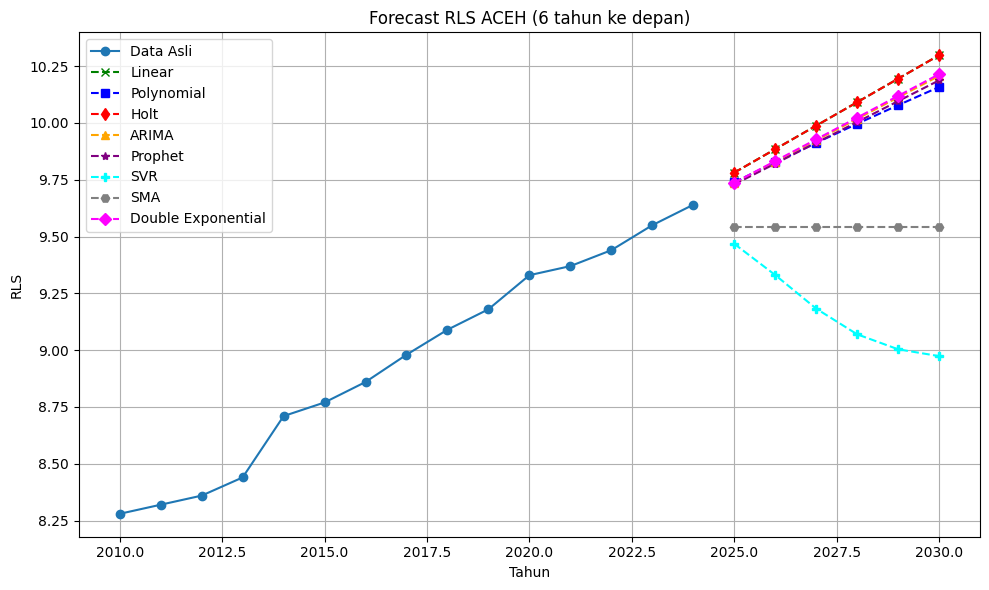

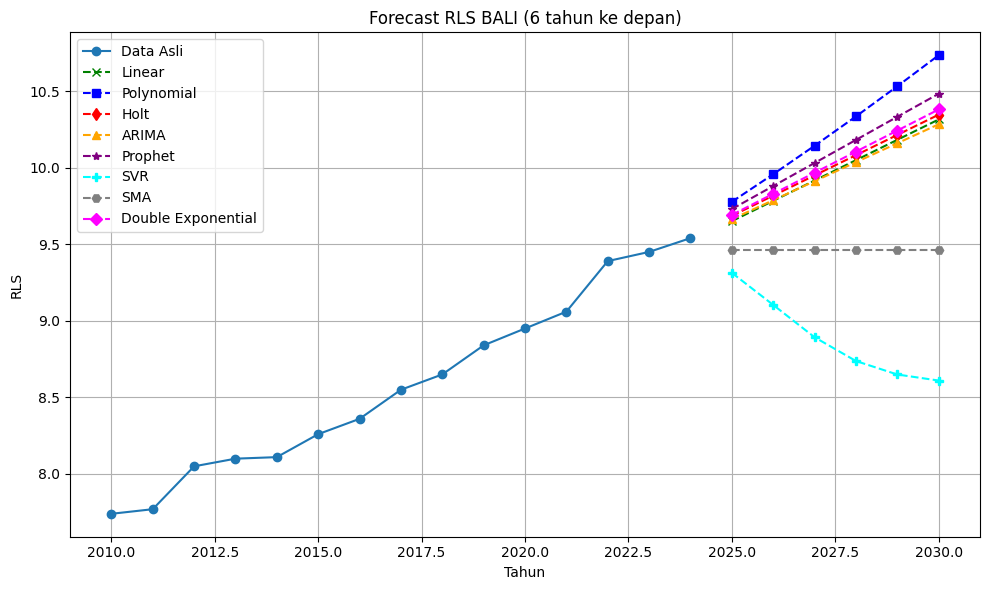

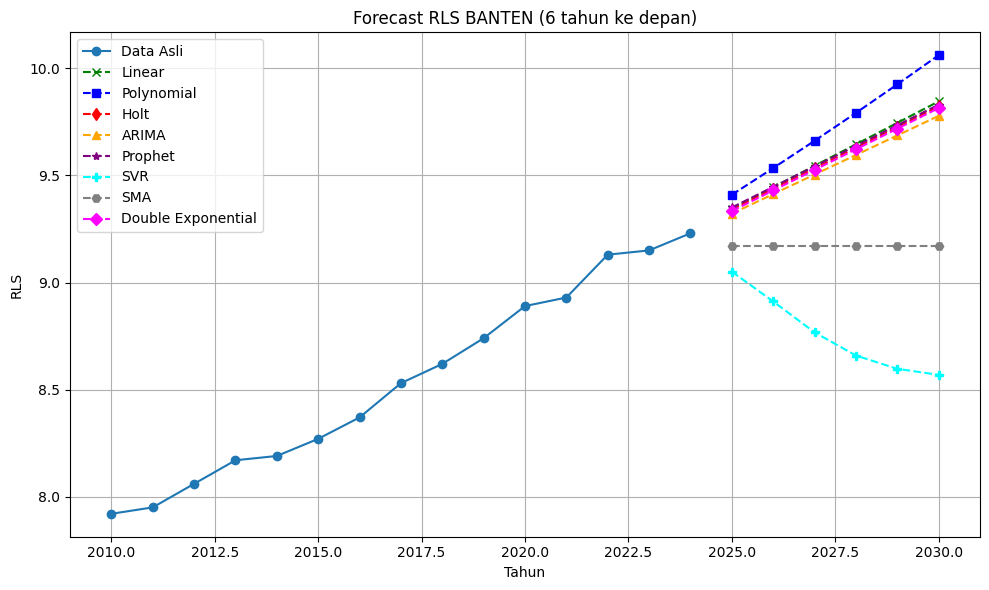

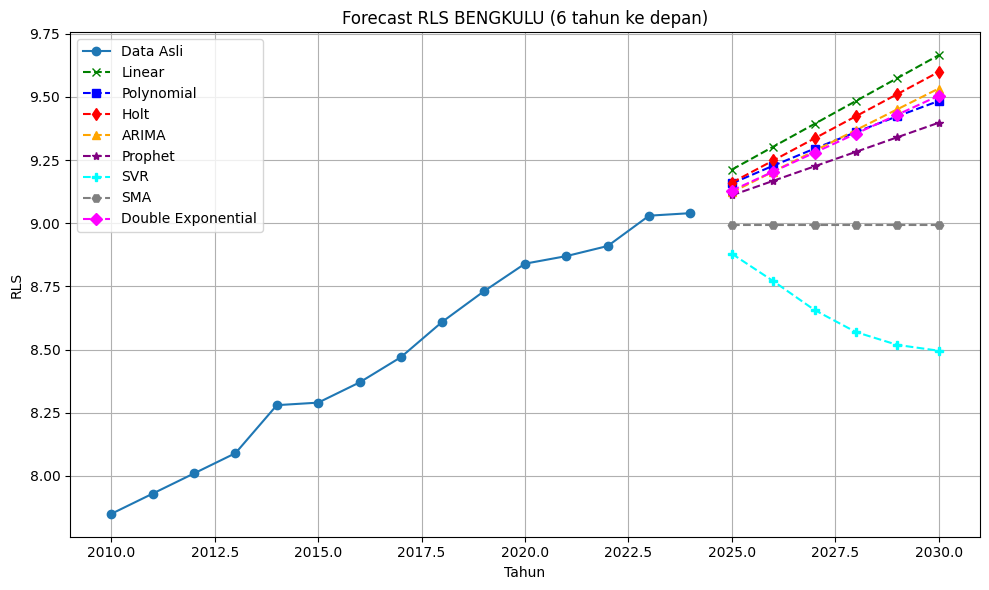

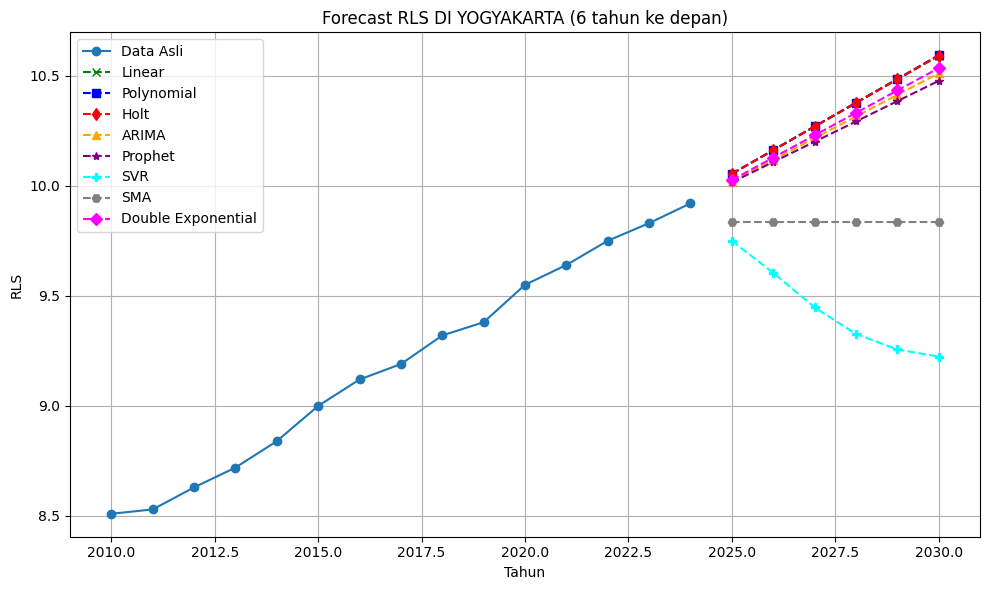

...

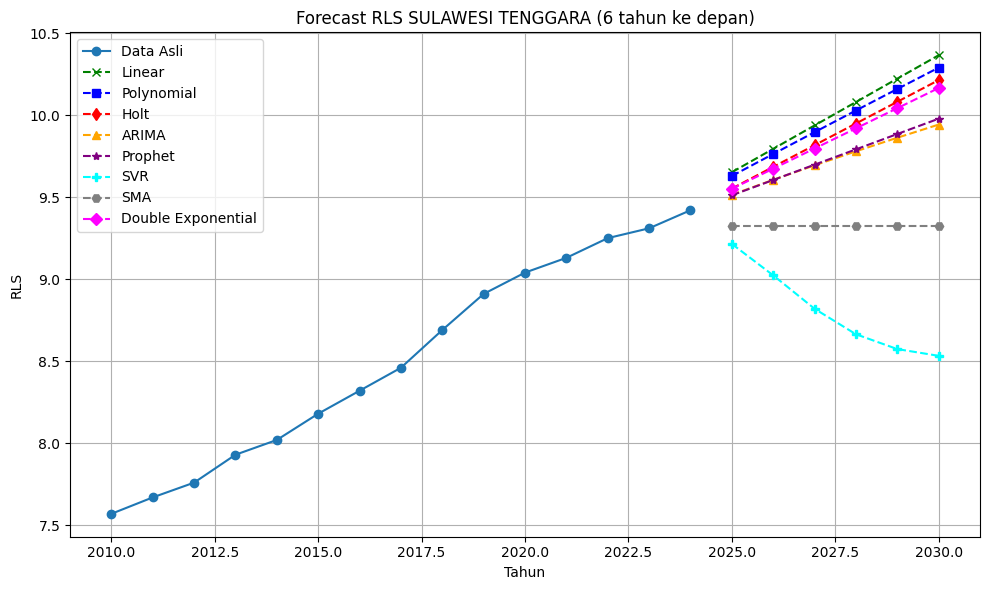

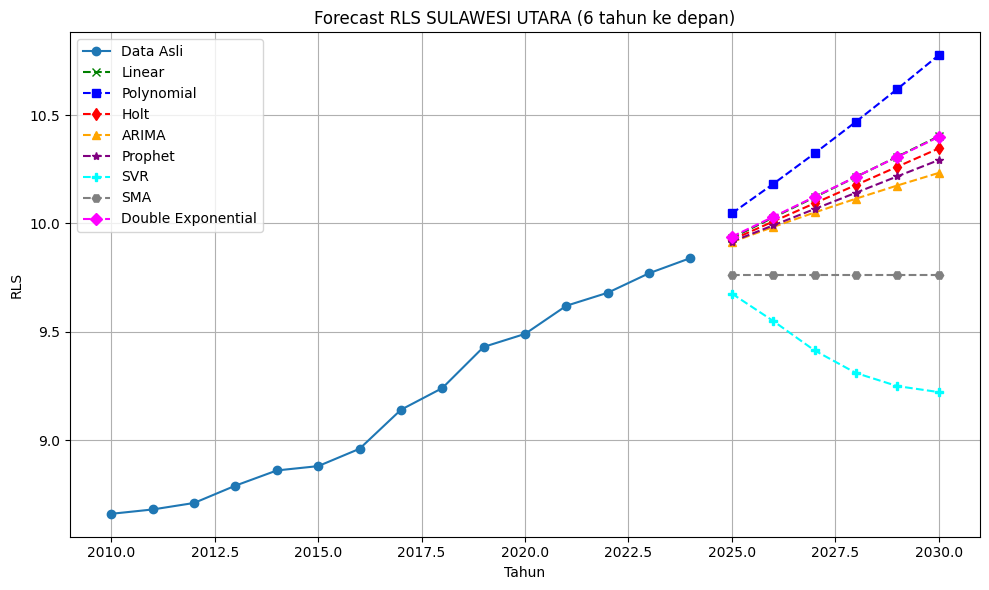

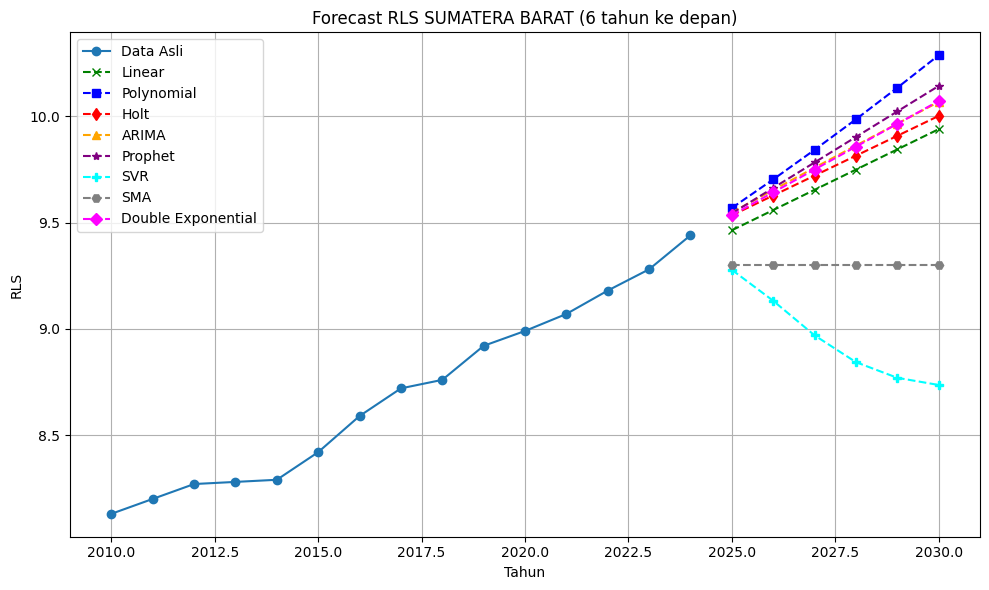

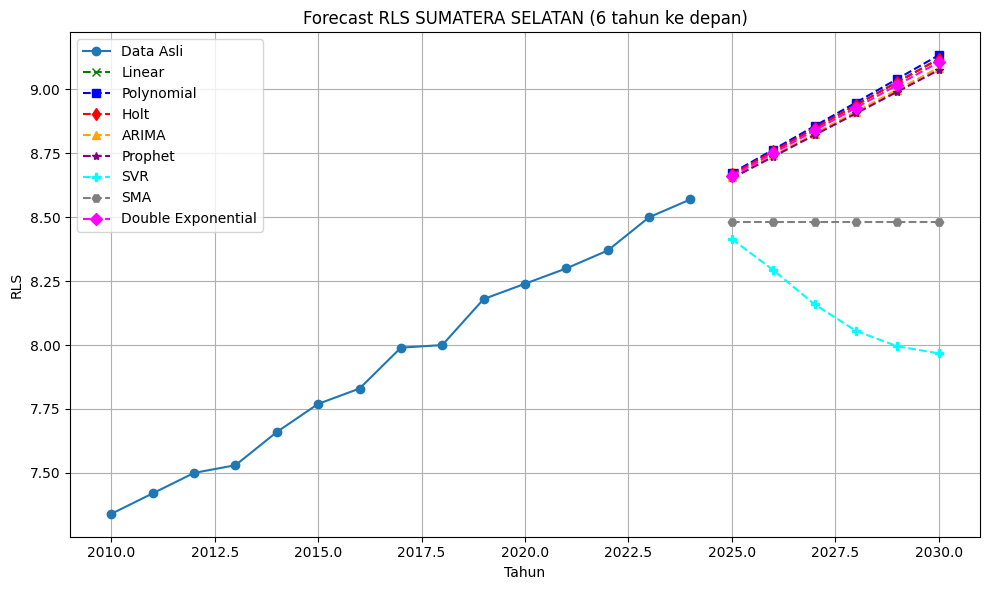

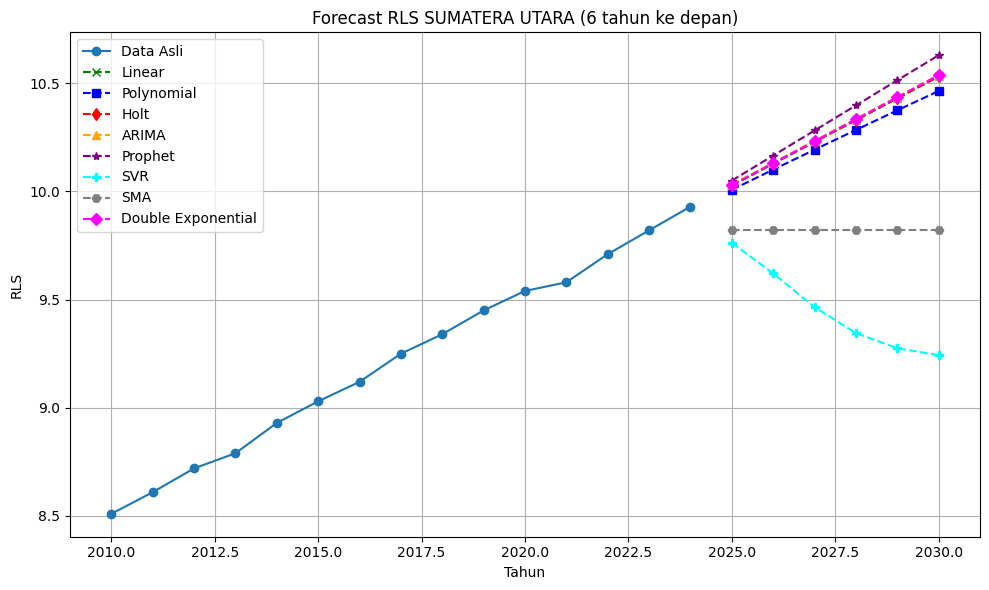

In [ ]:
# ================================================
# 📌 IMPORT LIBRARY
# ================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import statsmodels.api as sm
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
import lightgbm as lgb

from prophet import Prophet

# ================================================
# 📌 BACA DATA & PREPROCESSING
# ================================================
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/rata_lama_sekolah_pivot.csv')

# Ganti koma dengan titik dan konversi ke float
provinsi_cols = df.columns[1:]
df[provinsi_cols] = df[provinsi_cols].apply(lambda x: x.str.replace(',', '.').astype(float))

# ================================================
# 📌 FUNGSI FORECAST
# ================================================
def forecast_linear(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    model = LinearRegression()
    model.fit(X, y)

    y_pred = model.predict(np.array(tahun_prediksi).reshape(-1, 1))
    return y_pred

def forecast_polynomial(provinsi, tahun_prediksi, degree=2):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)

    model = LinearRegression()
    model.fit(X_poly, y)

    X_pred_poly = poly.transform(np.array(tahun_prediksi).reshape(-1, 1))
    y_pred = model.predict(X_pred_poly)
    return y_pred

def forecast_holt(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    model = ExponentialSmoothing(y, trend='add', seasonal=None, damped_trend=False)
    model_fit = model.fit(optimized=True)

    y_pred = model_fit.forecast(len(tahun_prediksi))
    return y_pred

def forecast_arima(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    try:
        model = sm.tsa.ARIMA(y, order=(1, 1, 1))
        model_fit = model.fit()
        y_pred = model_fit.forecast(steps=len(tahun_prediksi))
    except:
        # fallback ARIMA jika error
        y_pred = [y[-1]] * len(tahun_prediksi)

    return y_pred

def forecast_prophet(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna().rename(columns={'Tahun': 'ds', provinsi: 'y'})
    data['ds'] = pd.to_datetime(data['ds'], format='%Y')

    m = Prophet(yearly_seasonality=False, daily_seasonality=False)
    m.fit(data)

    future = pd.DataFrame({'ds': pd.to_datetime(tahun_prediksi, format='%Y')})
    forecast = m.predict(future)

    y_pred = forecast['yhat'].values
    return y_pred

def forecast_svr(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
    model.fit(X, y)

    y_pred = model.predict(np.array(tahun_prediksi).reshape(-1, 1))
    return y_pred

def forecast_sma(provinsi, tahun_prediksi, window=3):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].rolling(window=window).mean().dropna()

    # Karena rolling mengurangi jumlah data, sesuaikan tahun
    tahun = data['Tahun'][window-1:]

    last_sma = y.values[-1]
    y_pred = [last_sma] * len(tahun_prediksi)
    return y_pred

def forecast_double_exponential(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    model = ExponentialSmoothing(y, trend='add', seasonal=None, damped_trend=False)
    model_fit = model.fit(smoothing_level=0.8, smoothing_slope=0.2, optimized=False)

    y_pred = model_fit.forecast(len(tahun_prediksi))
    return y_pred

# ================================================
# 📌 PARAMETER: TAHUN PREDIKSI
# ================================================
tahun_terakhir = df['Tahun'].max()
tahun_prediksi = [tahun_terakhir + i for i in range(1, 7)]  # 6 tahun ke depan

# ================================================
# 📌 SIMPAN HASIL SEMUA PROVINSI
# ================================================
results = []

for provinsi in provinsi_cols:
    linear_preds = forecast_linear(provinsi, tahun_prediksi)
    poly_preds = forecast_polynomial(provinsi, tahun_prediksi, degree=2)
    holt_preds = forecast_holt(provinsi, tahun_prediksi)
    arima_preds = forecast_arima(provinsi, tahun_prediksi)
    prophet_preds = forecast_prophet(provinsi, tahun_prediksi)
    svr_preds = forecast_svr(provinsi, tahun_prediksi)
    sma_preds = forecast_sma(provinsi, tahun_prediksi)
    double_exp_preds = forecast_double_exponential(provinsi, tahun_prediksi)


    for tahun, linear, poly, holt, arima, prophet, svr, sma, double_exp in zip(
        tahun_prediksi, linear_preds, poly_preds, holt_preds, arima_preds, prophet_preds,
         svr_preds, sma_preds, double_exp_preds):
        results.append({
            'Provinsi': provinsi,
            'Tahun': tahun,
            'Linear_Regression': linear,
            'Polynomial_Regression': poly,
            'Holt_Exponential': holt,
            'ARIMA': arima,
            'Prophet': prophet,
            'SVR': svr,
            'SMA': sma,
            'Double_Exponential': double_exp
        })

# Gabungkan ke DataFrame
forecast_df = pd.DataFrame(results)

# Simpan ke file CSV
forecast_df.to_csv("/content/drive/Shareddrives/data mining sem 4/forecast_RLS_semua_model.csv", index=False)

# ================================================
# 📌 VISUALISASI SEMUA PROVINSI
# ================================================
for provinsi in provinsi_cols:
    data_asli = df[['Tahun', provinsi]].dropna()

    plt.figure(figsize=(10, 6))
    plt.plot(data_asli['Tahun'], data_asli[provinsi], marker='o', label='Data Asli')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Linear_Regression'],
             marker='x', linestyle='--', color='green', label='Linear')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Polynomial_Regression'],
             marker='s', linestyle='--', color='blue', label='Polynomial')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Holt_Exponential'],
             marker='d', linestyle='--', color='red', label='Holt')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['ARIMA'],
             marker='^', linestyle='--', color='orange', label='ARIMA')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Prophet'],
             marker='*', linestyle='--', color='purple', label='Prophet')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['SVR'],
             marker='P', linestyle='--', color='cyan', label='SVR')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['SMA'],
             marker='H', linestyle='--', color='gray', label='SMA')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Double_Exponential'],
             marker='D', linestyle='--', color='magenta', label='Double Exponential')

    plt.xlabel('Tahun')
    plt.ylabel('RLS')
    plt.title(f'Forecast RLS {provinsi} (6 tahun ke depan)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


##Persentase Penduduk Miskin

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsysq5eku/8znssmyu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpsysq5eku/c7wyp1uz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16024', 'data', 'file=/tmp/tmpsysq5eku/8znssmyu.json', 'init=/tmp/tmpsysq5eku/c7wyp1uz.json', 'output', 'file=/tmp/tmpsysq5eku/prophet_model612l8881/prophet_model-20250530085408.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
08:54:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:54:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-29-da4c0afec1a6>:119: FutureWarning: the 'smoothi

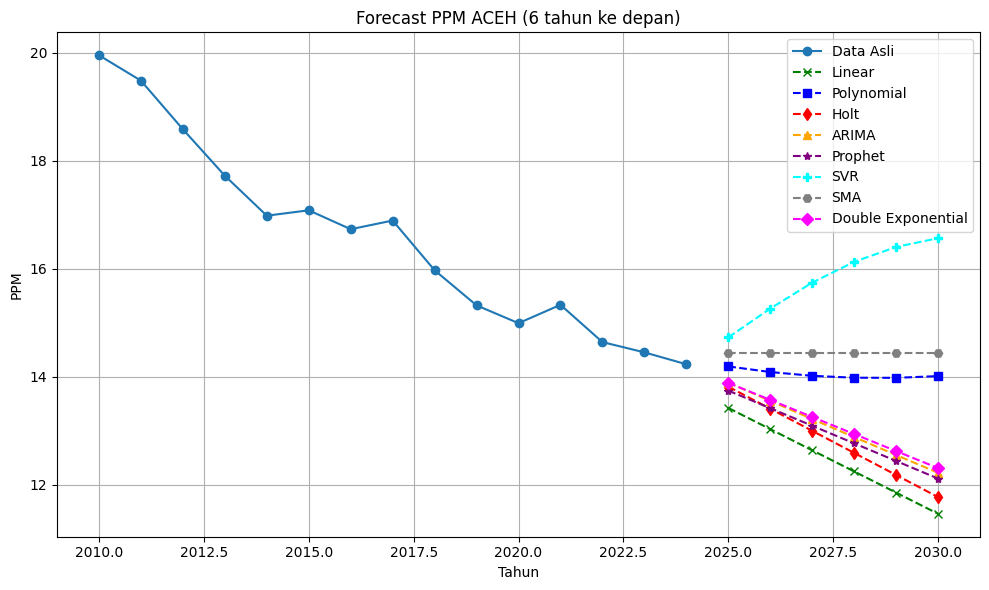

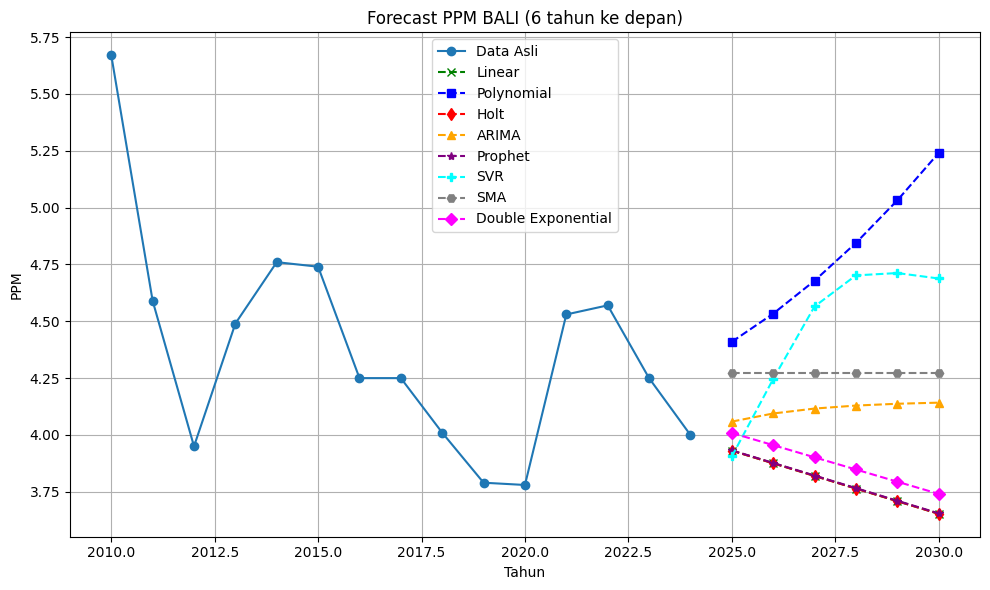

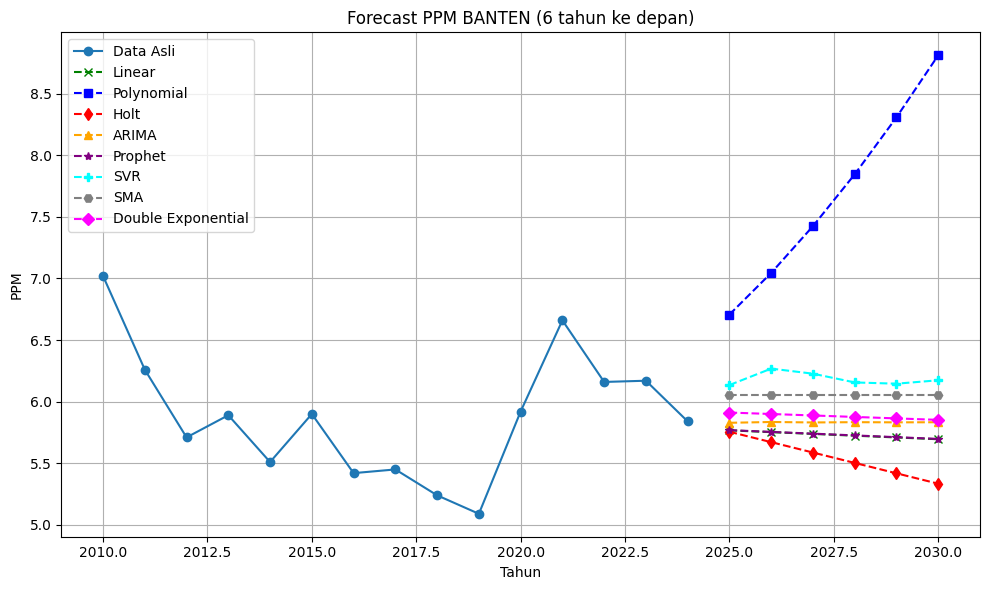

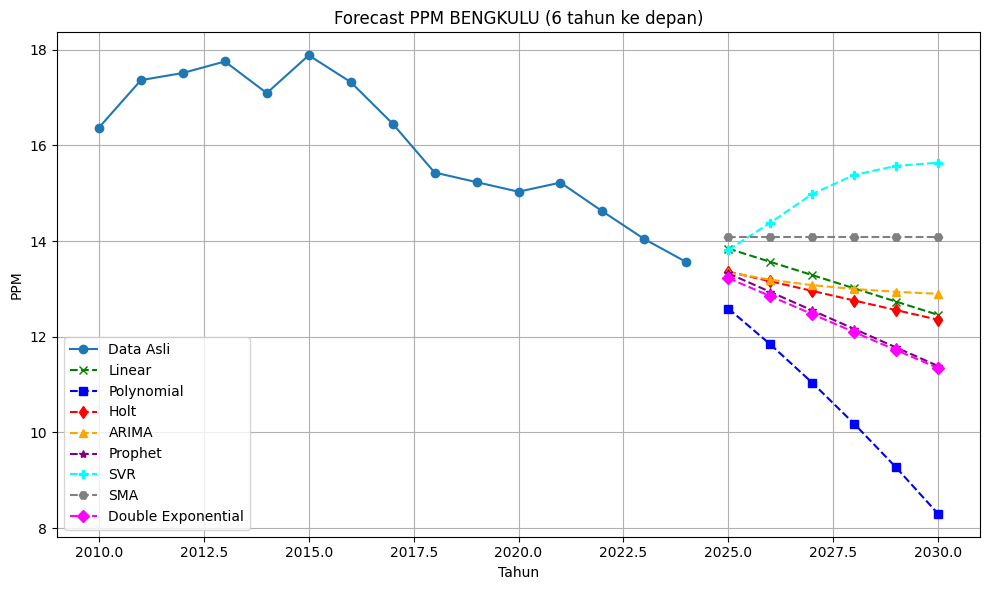

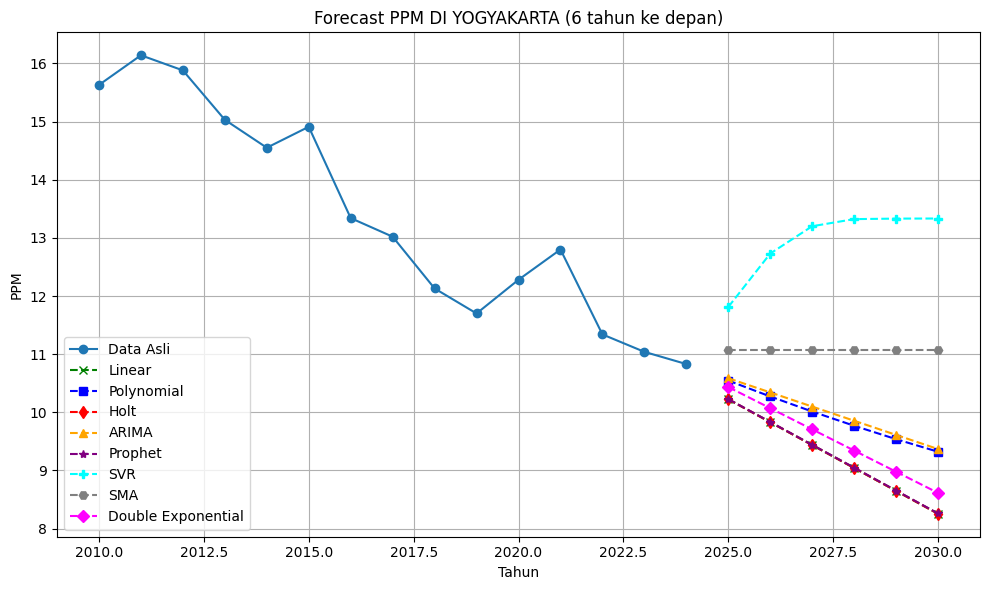

...

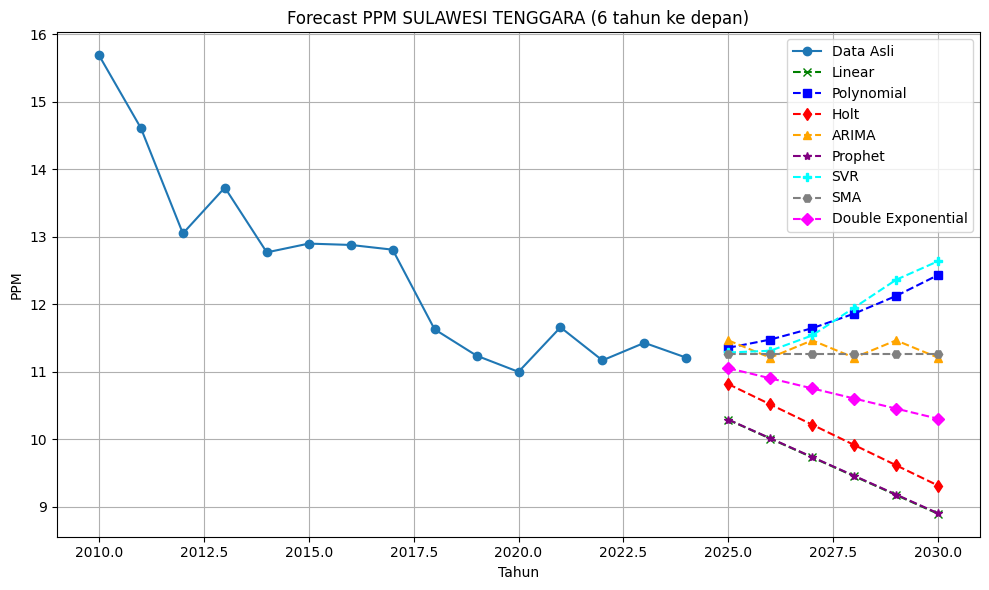

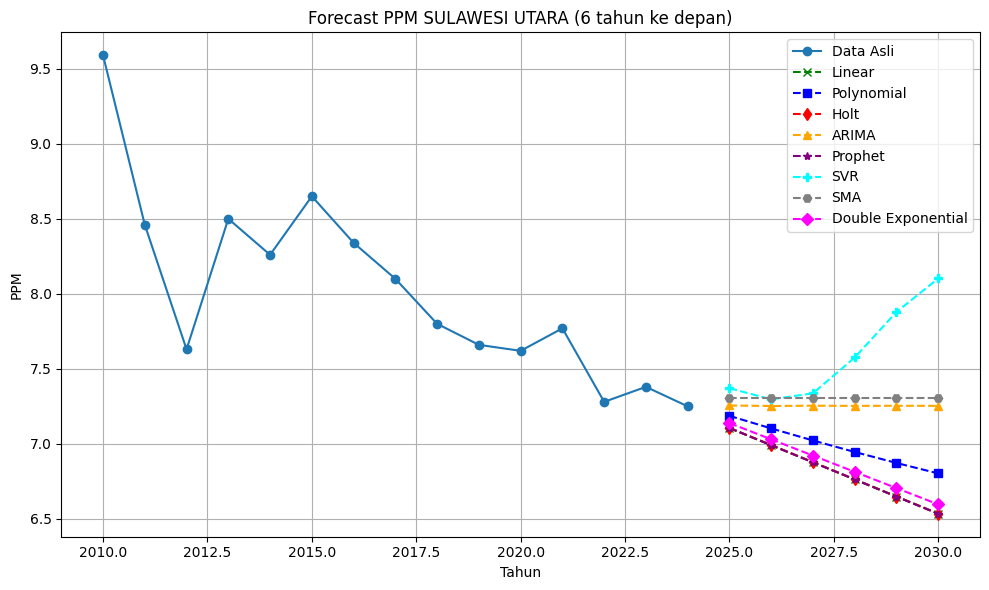

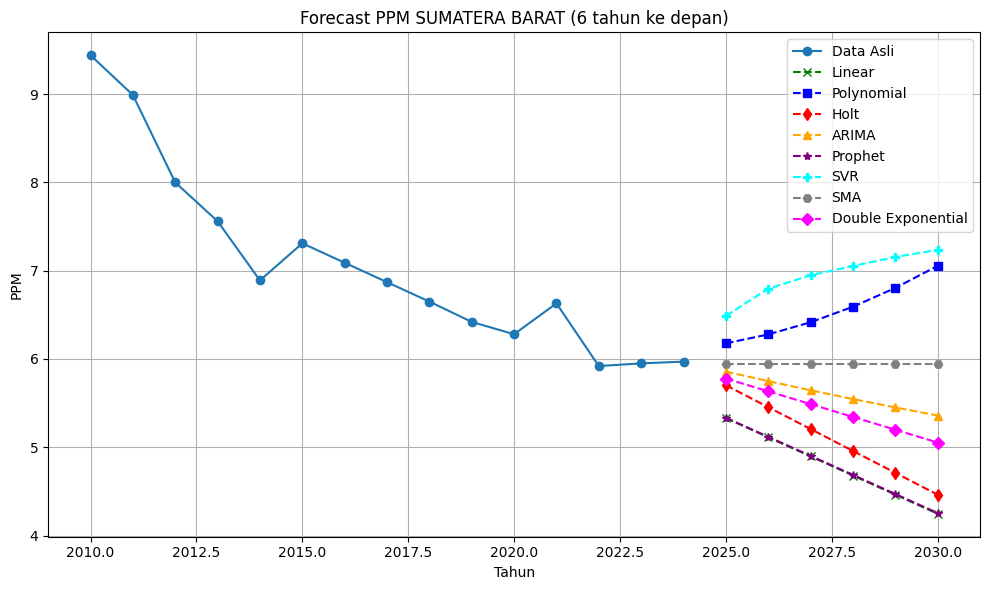

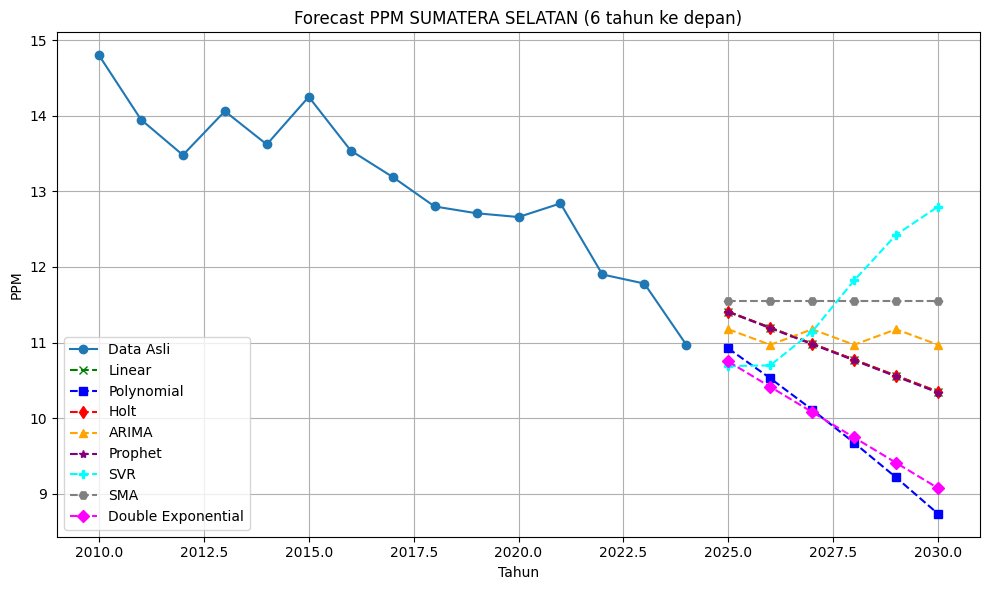

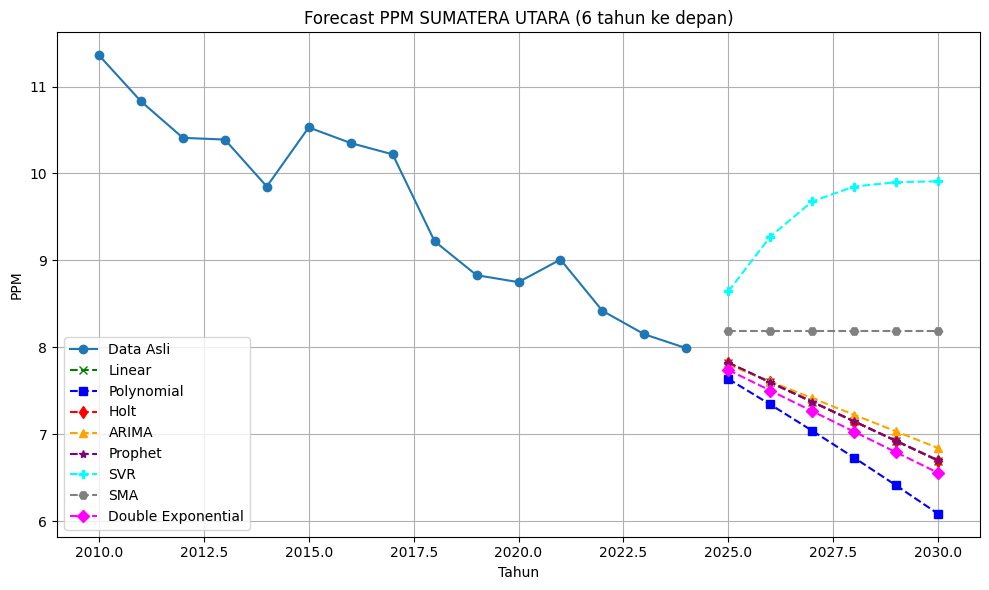

In [ ]:
# ================================================
# 📌 IMPORT LIBRARY
# ================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import statsmodels.api as sm
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
import lightgbm as lgb

from prophet import Prophet

# ================================================
# 📌 BACA DATA & PREPROCESSING
# ================================================
df = pd.read_csv('/content/drive/Shareddrives/data mining sem 4/persentase_miskin_pivot.csv')

# Ganti koma dengan titik dan konversi ke float
provinsi_cols = df.columns[1:]
df[provinsi_cols] = df[provinsi_cols].apply(lambda x: x.str.replace(',', '.').astype(float))

# ================================================
# 📌 FUNGSI FORECAST
# ================================================
def forecast_linear(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    model = LinearRegression()
    model.fit(X, y)

    y_pred = model.predict(np.array(tahun_prediksi).reshape(-1, 1))
    return y_pred

def forecast_polynomial(provinsi, tahun_prediksi, degree=2):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)

    model = LinearRegression()
    model.fit(X_poly, y)

    X_pred_poly = poly.transform(np.array(tahun_prediksi).reshape(-1, 1))
    y_pred = model.predict(X_pred_poly)
    return y_pred

def forecast_holt(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    model = ExponentialSmoothing(y, trend='add', seasonal=None, damped_trend=False)
    model_fit = model.fit(optimized=True)

    y_pred = model_fit.forecast(len(tahun_prediksi))
    return y_pred

def forecast_arima(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    try:
        model = sm.tsa.ARIMA(y, order=(1, 1, 1))
        model_fit = model.fit()
        y_pred = model_fit.forecast(steps=len(tahun_prediksi))
    except:
        # fallback ARIMA jika error
        y_pred = [y[-1]] * len(tahun_prediksi)

    return y_pred

def forecast_prophet(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna().rename(columns={'Tahun': 'ds', provinsi: 'y'})
    data['ds'] = pd.to_datetime(data['ds'], format='%Y')

    m = Prophet(yearly_seasonality=False, daily_seasonality=False)
    m.fit(data)

    future = pd.DataFrame({'ds': pd.to_datetime(tahun_prediksi, format='%Y')})
    forecast = m.predict(future)

    y_pred = forecast['yhat'].values
    return y_pred

def forecast_svr(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    X = data['Tahun'].values.reshape(-1, 1)
    y = data[provinsi].values

    model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
    model.fit(X, y)

    y_pred = model.predict(np.array(tahun_prediksi).reshape(-1, 1))
    return y_pred

def forecast_sma(provinsi, tahun_prediksi, window=3):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].rolling(window=window).mean().dropna()

    # Karena rolling mengurangi jumlah data, sesuaikan tahun
    tahun = data['Tahun'][window-1:]

    last_sma = y.values[-1]
    y_pred = [last_sma] * len(tahun_prediksi)
    return y_pred

def forecast_double_exponential(provinsi, tahun_prediksi):
    data = df[['Tahun', provinsi]].dropna()
    y = data[provinsi].values

    model = ExponentialSmoothing(y, trend='add', seasonal=None, damped_trend=False)
    model_fit = model.fit(smoothing_level=0.8, smoothing_slope=0.2, optimized=False)

    y_pred = model_fit.forecast(len(tahun_prediksi))
    return y_pred

# ================================================
# 📌 PARAMETER: TAHUN PREDIKSI
# ================================================
tahun_terakhir = df['Tahun'].max()
tahun_prediksi = [tahun_terakhir + i for i in range(1, 7)]  # 6 tahun ke depan

# ================================================
# 📌 SIMPAN HASIL SEMUA PROVINSI
# ================================================
results = []

for provinsi in provinsi_cols:
    linear_preds = forecast_linear(provinsi, tahun_prediksi)
    poly_preds = forecast_polynomial(provinsi, tahun_prediksi, degree=2)
    holt_preds = forecast_holt(provinsi, tahun_prediksi)
    arima_preds = forecast_arima(provinsi, tahun_prediksi)
    prophet_preds = forecast_prophet(provinsi, tahun_prediksi)
    svr_preds = forecast_svr(provinsi, tahun_prediksi)
    sma_preds = forecast_sma(provinsi, tahun_prediksi)
    double_exp_preds = forecast_double_exponential(provinsi, tahun_prediksi)


    for tahun, linear, poly, holt, arima, prophet, svr, sma, double_exp in zip(
        tahun_prediksi, linear_preds, poly_preds, holt_preds, arima_preds, prophet_preds,
         svr_preds, sma_preds, double_exp_preds):
        results.append({
            'Provinsi': provinsi,
            'Tahun': tahun,
            'Linear_Regression': linear,
            'Polynomial_Regression': poly,
            'Holt_Exponential': holt,
            'ARIMA': arima,
            'Prophet': prophet,
            'SVR': svr,
            'SMA': sma,
            'Double_Exponential': double_exp
        })

# Gabungkan ke DataFrame
forecast_df = pd.DataFrame(results)

# Simpan ke file CSV
forecast_df.to_csv("/content/drive/Shareddrives/data mining sem 4/forecast_PPM_semua_model.csv", index=False)

# ================================================
# 📌 VISUALISASI SEMUA PROVINSI
# ================================================
for provinsi in provinsi_cols:
    data_asli = df[['Tahun', provinsi]].dropna()

    plt.figure(figsize=(10, 6))
    plt.plot(data_asli['Tahun'], data_asli[provinsi], marker='o', label='Data Asli')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Linear_Regression'],
             marker='x', linestyle='--', color='green', label='Linear')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Polynomial_Regression'],
             marker='s', linestyle='--', color='blue', label='Polynomial')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Holt_Exponential'],
             marker='d', linestyle='--', color='red', label='Holt')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['ARIMA'],
             marker='^', linestyle='--', color='orange', label='ARIMA')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Prophet'],
             marker='*', linestyle='--', color='purple', label='Prophet')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['SVR'],
             marker='P', linestyle='--', color='cyan', label='SVR')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['SMA'],
             marker='H', linestyle='--', color='gray', label='SMA')
    plt.plot(tahun_prediksi,
             forecast_df[forecast_df['Provinsi'] == provinsi]['Double_Exponential'],
             marker='D', linestyle='--', color='magenta', label='Double Exponential')

    plt.xlabel('Tahun')
    plt.ylabel('PPM')
    plt.title(f'Forecast PPM {provinsi} (6 tahun ke depan)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
import pandas as pd

# Load data dari ketiga file CSV
ipm_df = pd.read_csv("/content/drive/Shareddrives/data mining sem 4/forecast_ipm_semua_model.csv")
ppm_df = pd.read_csv("/content/drive/Shareddrives/data mining sem 4/forecast_PPM_semua_model.csv")
pt_df = pd.read_csv("/content/drive/Shareddrives/data mining sem 4/forecast_pt_semua_model.csv")

# Filter data untuk tahun 2030 saja
ipm_2030 = ipm_df[ipm_df["Tahun"] == 2030]
ppm_2030 = ppm_df[ppm_df["Tahun"] == 2030]
pt_2030 = pt_df[pt_df["Tahun"] == 2030]

# Gabungkan ketiga tabel berdasarkan kolom Provinsi dan Tahun
merged_2030 = ipm_2030.merge(ppm_2030, on=["Provinsi", "Tahun"], suffixes=("_IPM", "_PPM"))
merged_2030 = merged_2030.merge(pt_2030, on=["Provinsi", "Tahun"])
merged_2030.rename(columns=lambda col: col.replace("_x", "_PT"), inplace=True)

# Simpan hasil gabungan ke file baru (opsional)
merged_2030.to_csv("hasil_forecast_2030.csv", index=False)

# Tampilkan tabel hasil gabungan tahun 2030
print(merged_2030)


                     Provinsi  Tahun  Linear_Regression_IPM  \
0                        ACEH   2030              76.984310   
1                        BALI   2030              80.749071   
2                      BANTEN   2030              77.253131   
3                    BENGKULU   2030              76.977429   
4               DI YOGYAKARTA   2030              84.469738   
5                 DKI JAKARTA   2030              85.531548   
6                   GORONTALO   2030              74.618690   
7                       JAMBI   2030              76.821167   
8                  JAWA BARAT   2030              77.977476   
9                 JAWA TENGAH   2030              77.414893   
10                 JAWA TIMUR   2030              77.849190   
11           KALIMANTAN BARAT   2030              73.327917   
12         KALIMANTAN SELATAN   2030              76.413393   
13          KALIMANTAN TENGAH   2030              75.880845   
14           KALIMANTAN TIMUR   2030              81.71

# **Factor Analysis**


In [ ]:
# Pilih kolom yang relevan
selected_columns = [
'IPM', 'rata_lama_sekolah', 'TPAK',
       'indek_tingkat_pengangguran_terbuka', 'angka_harapan_hidup_lakilaki',
       'angka_harapan_hidup_perempuan', 'persentase_penduduk_miskin',
       'penduduk_usia_15_tahun_keatas ',
       'persentase_ketidakcukupan_konsumsi_pangan',
       'Pengeluaran per kapita laki-laki ', 'Pengeluaran per kapita perempuan',
       'HLS laki-laki', 'HLS perempuan', 'Nikah',
       'Laju pertumbuhan penduduk per tahun'
]


In [ ]:
!pip install factor-analyzer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 1.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for factor-analyzer: filename=factor_analyzer-0.5.1-py2.py3-none-any.whl size=42655 sha256=12dca07344747497910176698c22f5d4e0c9ef1a4fb1bdf07629477c38d9e244
  Stored in directory: /root/.cache/pip/wheels/fa/f7/53/a55a8a56668a6fe0199e0e02b6e0ae3007ec35cdf6e4c25df7
Successfully built factor-analyzer


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from factor_analyzer import calculate_kmo, calculate_bartlett_sphericity
# Standardisasi data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df[selected_columns])

In [ ]:
# Hitung KMO dan Bartlett’s Test
kmo_all, kmo_model = calculate_kmo(data_scaled)
bartlett_chi_square_value, bartlett_p_value = calculate_bartlett_sphericity(data_scaled)

print("===== HASIL UJI KELAYAKAN ANALISIS FAKTOR =====")
print(f"Nilai KMO: {kmo_model:.4f}")
print(f"Bartlett’s Test Chi-Square: {bartlett_chi_square_value:.4f}")
print(f"Bartlett’s Test p-value: {bartlett_p_value:.4f}")

===== HASIL UJI KELAYAKAN ANALISIS FAKTOR =====
Nilai KMO: 0.7358
Bartlett’s Test Chi-Square: 910.0260
Bartlett’s Test p-value: 0.0000


/usr/local/lib/python3.11/dist-packages/factor_analyzer/utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


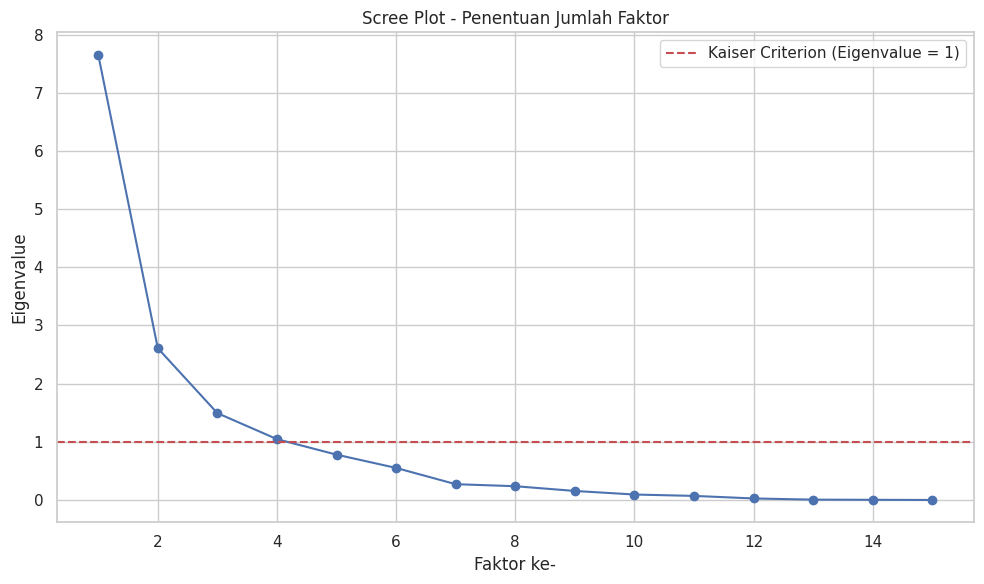

Faktor ke-1: Eigenvalue = 7.6547
Faktor ke-2: Eigenvalue = 2.6092
Faktor ke-3: Eigenvalue = 1.4932
Faktor ke-4: Eigenvalue = 1.0462
Faktor ke-5: Eigenvalue = 0.7795
Faktor ke-6: Eigenvalue = 0.5512
Faktor ke-7: Eigenvalue = 0.2719
Faktor ke-8: Eigenvalue = 0.2369
Faktor ke-9: Eigenvalue = 0.1556
Faktor ke-10: Eigenvalue = 0.0942
Faktor ke-11: Eigenvalue = 0.0704
Faktor ke-12: Eigenvalue = 0.0268
Faktor ke-13: Eigenvalue = 0.0062
Faktor ke-14: Eigenvalue = 0.0035
Faktor ke-15: Eigenvalue = 0.0004


In [ ]:
import matplotlib.pyplot as plt
from factor_analyzer import FactorAnalyzer
import seaborn as sns

# Buat analisis faktor awal tanpa rotasi
fa = FactorAnalyzer(n_factors=len(selected_columns), rotation=None)
fa.fit(data_scaled)

# Ambil nilai eigenvalue
eigenvalues, _ = fa.get_eigenvalues()

# Buat scree plot
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
plt.plot(range(1, len(eigenvalues)+1), eigenvalues, marker='o', linestyle='-')
plt.axhline(y=1, color='r', linestyle='--', label='Kaiser Criterion (Eigenvalue = 1)')
plt.title('Scree Plot - Penentuan Jumlah Faktor')
plt.xlabel('Faktor ke-')
plt.ylabel('Eigenvalue')
plt.legend()
plt.tight_layout()
plt.show()

# Tampilkan nilai eigenvalue
for i, val in enumerate(eigenvalues, 1):
    print(f"Faktor ke-{i}: Eigenvalue = {val:.4f}")


In [ ]:
from factor_analyzer import FactorAnalyzer

# Inisialisasi dan fit model dengan 4 faktor dan rotasi varimax
fa = FactorAnalyzer(n_factors=4, rotation='varimax')
fa.fit(data_scaled)

# Tampilkan factor loading
loadings = pd.DataFrame(fa.loadings_, index=selected_columns, columns=['Faktor 1', 'Faktor 2', 'Faktor 3', 'Faktor 4'])
print(loadings)


                                           Faktor 1  Faktor 2  Faktor 3  \
IPM                                        0.790606  0.488619  0.374245   
rata_lama_sekolah                          0.338559  0.618599  0.607353   
TPAK                                      -0.214596 -0.167506 -0.851130   
indek_tingkat_pengangguran_terbuka         0.092005  0.146293  0.824418   
angka_harapan_hidup_lakilaki               0.802140  0.167477  0.166291   
angka_harapan_hidup_perempuan              0.810545  0.162746  0.169439   
persentase_penduduk_miskin                -0.734355 -0.260076 -0.333786   
penduduk_usia_15_tahun_keatas              0.245393 -0.059883  0.042198   
persentase_ketidakcukupan_konsumsi_pangan -0.704279 -0.232890  0.016049   
Pengeluaran per kapita laki-laki           0.811833  0.132764  0.387950   
Pengeluaran per kapita perempuan           0.813686  0.277419  0.126681   
HLS laki-laki                              0.262758  0.939295  0.157273   
HLS perempuan            

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
# Hitung komunalitas: jumlah kuadrat loading faktor untuk setiap variabel
communalities = (loadings ** 2).sum(axis=1)
communalities = communalities.sort_values(ascending=False)

# Tampilkan hasil komunalitas
communalities


,0
IPM,1.004638
penduduk_usia_15_tahun_keatas,0.997424
HLS laki-laki,0.977019
Nikah,0.972124
HLS perempuan,0.958897
rata_lama_sekolah,0.884553
Pengeluaran per kapita laki-laki,0.827293
angka_harapan_hidup_perempuan,0.804329
TPAK,0.802042
angka_harapan_hidup_lakilaki,0.788700


In [ ]:
import numpy as np
# Pastikan hanya kolom yang relevan (yang digunakan dalam FA)
features = loadings.index.tolist()
X = df[features]

# Standarisasi data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Hitung skor faktor: skor_faktor = Z * Loadings
factor_scores = np.dot(X_scaled, loadings.values)

# Simpan skor faktor ke dalam DataFrame
factor_scores_df = pd.DataFrame(
    factor_scores,
    columns=["Faktor 1", "Faktor 2", "Faktor 3", "Faktor 4"]
)
factor_scores_df["Provinsi"] = df["Provinsi"]
# factor_scores_df = factor_scores_df.set_index("Provinsi")

# Tampilkan hasil skor faktor
factor_scores_df

,Faktor 1,Faktor 2,Faktor 3,Faktor 4,Provinsi
0,0.779482,2.946743,2.472346,-0.323569,ACEH
1,1.391751,1.323807,1.474167,1.066348,SUMATERA UTARA
2,2.008806,2.896954,1.949791,-0.118299,SUMATERA BARAT
3,2.515512,1.327251,1.540812,0.117141,RIAU
4,1.651112,0.494841,0.932437,-0.188813,JAMBI
5,1.154728,-0.810851,-0.539658,0.592406,SUMATERA SELATAN
6,-0.112851,1.131126,-0.806502,-1.111563,BENGKULU
7,0.375813,-0.951998,-0.417824,0.686215,LAMPUNG
8,1.986621,-0.877556,0.966315,-0.573741,KEP. BANGKA BELITUNG
9,5.008346,2.719053,3.911385,-0.523749,KEP. RIAU


In [ ]:
from sklearn.cluster import KMeans
# Membuat DataFrame
df = pd.DataFrame(factor_scores_df)
features = df[['Faktor 1', 'Faktor 2', 'Faktor 3', 'Faktor 4']]

# Menentukan jumlah klaster (k) = 3
kmeans = KMeans(n_clusters=3, random_state=42)
df['Klaster'] = kmeans.fit_predict(features)

# Menyimpan hasil centroid untuk visualisasi (opsional)
centroids = kmeans.cluster_centers_

df_sorted = df.sort_values('Klaster')
df_sorted[['Provinsi', 'Faktor 1', 'Faktor 2', 'Faktor 3', 'Faktor 4', 'Klaster']]

,Provinsi,Faktor 1,Faktor 2,Faktor 3,Faktor 4,Klaster
12,JAWA TENGAH,5.326644,-0.424836,0.146678,6.958442,0
15,BANTEN,4.083972,1.297314,3.236045,1.471882,0
13,DI YOGYAKARTA,9.232453,6.949808,1.729822,0.906304,0
14,JAWA TIMUR,5.315918,0.423940,0.124546,7.279542,0
10,DKI JAKARTA,13.314227,5.317642,6.433658,2.208841,0
11,JAWA BARAT,5.857803,0.100862,3.062413,8.662795,0
9,KEP. RIAU,5.008346,2.719053,3.911385,-0.523749,0
16,BALI,6.919992,2.672245,-0.868281,0.236623,0
24,SULAWESI UTARA,4.513680,1.651908,2.835292,0.278392,0
26,SULAWESI SELATAN,3.221002,1.552366,1.290518,0.693630,0


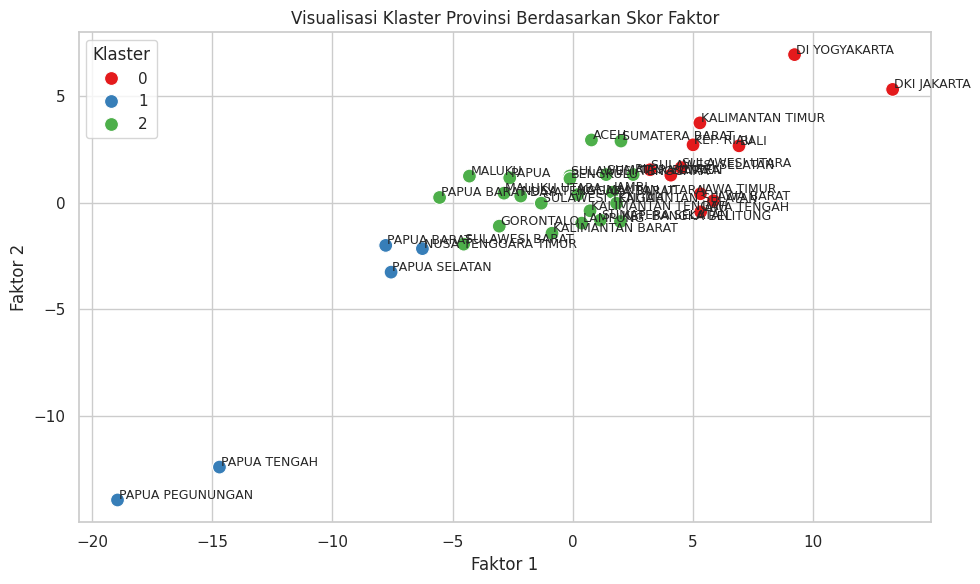

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot scatter plot klaster
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df_sorted,
    x='Faktor 1',
    y='Faktor 2',
    hue='Klaster',
    palette='Set1',
    s=100
)

# Tambahkan label provinsi
for _, row in df_sorted.iterrows():
    plt.text(row['Faktor 1'] + 0.05, row['Faktor 2'] + 0.05, row['Provinsi'], fontsize=9)

plt.title('Visualisasi Klaster Provinsi Berdasarkan Skor Faktor')
plt.xlabel('Faktor 1')
plt.ylabel('Faktor 2')
plt.legend(title='Klaster')
plt.grid(True)
plt.tight_layout()
plt.show()


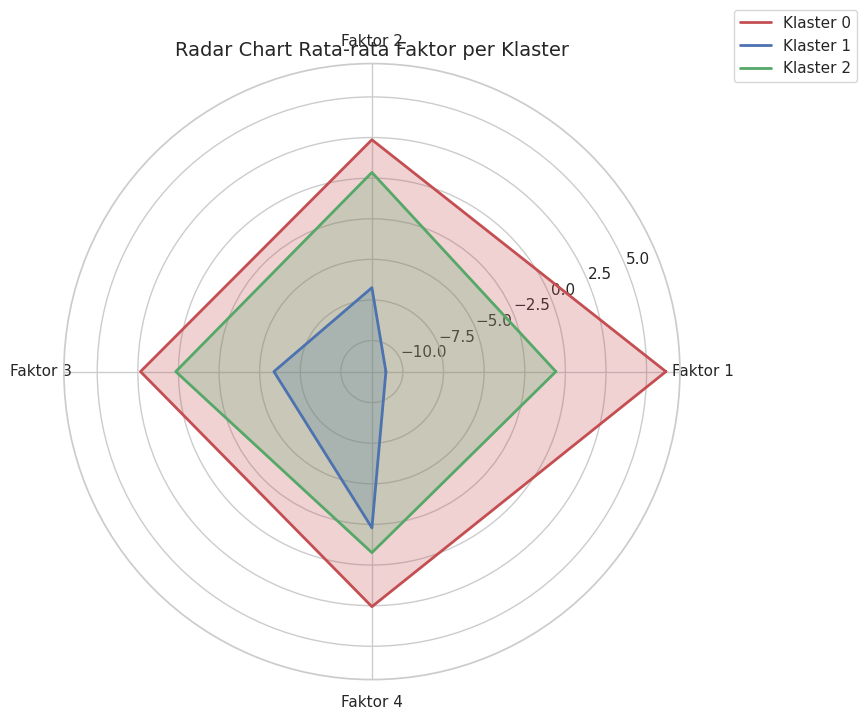

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Hitung rata-rata tiap faktor per klaster
cluster_means = df_sorted.groupby('Klaster')[['Faktor 1', 'Faktor 2', 'Faktor 3', 'Faktor 4']].mean()

# Persiapan data radar
labels = cluster_means.columns.tolist()
num_vars = len(labels)

# Hitung sudut untuk sumbu
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Agar grafik tertutup

# Membuat radar chart
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Warna untuk tiap klaster
colors = ['r', 'b', 'g']

# Plot setiap klaster
for i, (index, row) in enumerate(cluster_means.iterrows()):
    values = row.tolist()
    values += values[:1]  # Tutup lingkaran
    ax.plot(angles, values, color=colors[i], linewidth=2, label=f'Klaster {index}')
    ax.fill(angles, values, color=colors[i], alpha=0.25)

# Tambahkan label sumbu
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Tambahkan judul dan legend
plt.title('Radar Chart Rata-rata Faktor per Klaster', size=14)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()


In [ ]:
# Simpan ke file CSV
df_sorted.to_csv('hasil_klasterisasi.csv', index=False


SyntaxError: incomplete input (<ipython-input-14-190e18fb10c9>, line 2)